## Explainability of Attention Mechanisms in `t2` with Z Features. Add to L.

This notebook looks at the attention responses for a given input and tries to explore the explainability of the attention mechanism that is being used in the `t2` model

In [1]:
import argparse
import joblib
import json
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import shutil
import sys
import seaborn as sns
import tensorflow as tf

from itertools import cycle
from numpy import interp
from pathlib import Path
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from tensorflow import keras

from astronet.constants import astronet_working_directory as asnwd
from astronet.preprocess import one_hot_encode
from astronet.utils import astronet_logger, load_dataset, find_optimal_batch_size

In [2]:
from astronet.metrics import WeightedLogLoss
from astronet.visualise_results import plot_acc_history, plot_confusion_matrix, plot_loss_history, plot_multiROC

In [3]:
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

import random as python_random
# The below is necessary for starting core Python generated random numbers
# in a well-defined state.
python_random.seed(RANDOM_SEED)

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.serif": ["Computer Modern Roman"]})

plt.rcParams["figure.figsize"] = (20,3)

print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


In [4]:
mpl.style.use("seaborn-whitegrid")

In [5]:
architecture = "t2"

In [6]:
dataset = "plasticc"

In [7]:
snonly = None

if snonly is not None:
    dataform = "snonly"
else:
    dataform = "full"

In [8]:
X_train, y_train, X_test, y_test, loss, Z_train, Z_test = load_dataset(dataset, redshift=True, snonly=snonly)

In [9]:
num_classes = y_train.shape[1]
num_classes

14

In [10]:
BATCH_SIZE = find_optimal_batch_size(X_train.shape[0])
_, timesteps, num_features = X_train.shape  # X_train.shape[1:] == (TIMESTEPS, num_features)
input_shape = (BATCH_SIZE, timesteps, num_features)
input_shape

(64, 100, 6)

In [11]:
_, num_z_features = Z_train.shape
Z_input_shape = (BATCH_SIZE, num_z_features)

Get params for best model with lowest loss. Once we have the associated parameters, the corresponding model will be instanciated.

In [12]:
# with open(f"{asnwd}/astronet/{architecture}/models/{dataset}/results.json") as f:
#     events = json.load(f)
#     # Get params for best model with lowest loss
#     event = min(events['training_result'], key=lambda ev: ev['loss'])

# model_name = None    
# model_name = "1612541563-63c7b2d"
# model_name = "1614175009-c2f6ea1"
# model_name = "1613551066-32f3933"
# model_name = "1613551066-32f3933"
# model_name = "1615495431-0.1.dev701+g2539a82.d20210311"
model_name = "1619624444-0.1.dev765+g7c90cbb.d20210428"


with open(f"{asnwd}/astronet/{architecture}/models/{dataset}/results_with_z.json") as f:
    events = json.load(f)
    if model_name is not None:
    # Get params for model chosen with cli args
        event = next(item for item in events['training_result'] if item["name"] == model_name)
    else:
        # Get params for best model with lowest loss
        event = min(
            (item for item in events["training_result"] if item["augmented"] is None),
                key=lambda ev: ev["model_evaluate_on_test_loss"],
            )

#         event = min(events['training_result'], key=lambda ev: ev['model_evaluate_on_test_loss'])

In [13]:
# Show short summary of items in 'event'
dict(list(event.items())[1:4])

{'augmented': None, 'avocado': None, 'droprate': 0.1}

In [14]:
model_name = event['name']

In [15]:
model_name

'1619624444-0.1.dev765+g7c90cbb.d20210428'

In [16]:
# model = keras.models.load_model(f"{asnwd}/astronet/{architecture}/models/{dataset}/model-{model_name}", 
#                                 custom_objects={'WeightedLogLoss': WeightedLogLoss()}, 
#                                compile=False)

In [17]:
embed_dim = event['embed_dim']  # --> Embedding size for each token
num_heads = event['num_heads']  # --> Number of attention heads
ff_dim = event['ff_dim']  # --> Hidden layer size in feed forward network inside transformer

# --> Number of filters to use in ConvEmbedding block, should be equal to embed_dim
num_filters = embed_dim

num_layers = event['num_layers']    # --> N x repeated transformer blocks
droprate = event['droprate']        # --> Rate of neurons to drop

In [18]:
from astronet.t2.model import T2Model

In [19]:
input_shape_nobatch = input_shape[1:]
Z_input_shape_nobatch = Z_input_shape[1:]

inputs = [
    tf.keras.Input(shape=input_shape_nobatch), 
    tf.keras.Input(shape=Z_input_shape_nobatch),
]

# input_shape_nobatch = input_shape[1:]
# inputs = tf.keras.Input(shape=input_shape_nobatch)

In [20]:
input_shape_nobatch, Z_input_shape_nobatch
# input_shape_nobatch

((100, 6), (2,))

In [21]:
inputs

[<KerasTensor: shape=(None, 100, 6) dtype=float32 (created by layer 'input_1')>,
 <KerasTensor: shape=(None, 2) dtype=float32 (created by layer 'input_2')>]

In [22]:
tf.config.run_functions_eagerly(True)

Instanciate a `T2Model` and load with parameters defined earlier from saved configuration file

In [23]:
model = T2Model(        
    input_dim=input_shape,
    embed_dim=embed_dim,
    num_heads=num_heads,
    ff_dim=ff_dim,
    num_filters=num_filters,
    num_classes=num_classes,
    num_layers=num_layers,
    droprate=droprate,
    num_aux_feats=2,
    add_aux_feats_to="L",
#     fc_neurons=fc_neurons,
)

In [24]:
model.call(inputs, training=True)

<KerasTensor: shape=(None, 14) dtype=float32 (created by layer 'dense_6')>

In [25]:
input_shape

(64, 100, 6)

In [26]:
model.build(input_shape)

In [27]:
model.summary()

Model: "t2_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_embedding (ConvEmbeddin (None, 102, 32)           224       
_________________________________________________________________
positional_encoding (Positio (None, 102, 32)           0         
_________________________________________________________________
transformer_block (Transform (None, 102, 32)           12704     
_________________________________________________________________
global_average_pooling1d (Gl (None, 32)                0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 14)                462       
Total params: 13,390
Trainable params: 13,390
Non-trainable params: 0
______________________________________________________

In [28]:
# model.load_weights(f"{asnwd}/astronet/{architecture}/models/{dataset}/weights-1611674535-affdd40")
# model.load_weights(f"{asnwd}/astronet/{architecture}/models/{dataset}/weights-{model_name}")
model.load_weights(f"{asnwd}/astronet/{architecture}/models/{dataset}/model-{model_name}")

In [29]:
model.layers

In [30]:
for i in model.layers:
    print(i.output)

KerasTensor(type_spec=TensorSpec(shape=(None, 102, 32), dtype=tf.float32, name=None), name='conv_embedding/conv1d/Relu:0', description="created by layer 'conv_embedding'")
KerasTensor(type_spec=TensorSpec(shape=(None, 102, 32), dtype=tf.float32, name=None), name='positional_encoding/add:0', description="created by layer 'positional_encoding'")
KerasTensor(type_spec=TensorSpec(shape=(None, 102, 32), dtype=tf.float32, name=None), name='transformer_block/layer_normalization_1/batchnorm/add_1:0', description="created by layer 'transformer_block'")
KerasTensor(type_spec=TensorSpec(shape=(None, 32), dtype=tf.float32, name=None), name='global_average_pooling1d/Mean:0', description="created by layer 'global_average_pooling1d'")
KerasTensor(type_spec=TensorSpec(shape=(None, 32), dtype=tf.float32, name=None), name='dropout_2/dropout/Mul_1:0', description="created by layer 'dropout_2'")
KerasTensor(type_spec=TensorSpec(shape=(None, 14), dtype=tf.float32, name=None), name='dense_6/Softmax:0', desc

### Explainability of Attention Mechanisms

In [31]:
# x = X_test[rindex]
# x.shape

In [32]:
# z = Z_test[rindex]
# z

In [33]:
from astronet.visualise_results import _get_encoding

In [34]:
encoding, class_encoding, class_names = _get_encoding(dataset, dataform=dataform)

In [35]:
class_names

['mu-Lens-Single',
 'TDE',
 'EB',
 'SNII',
 'SNIax',
 'Mira',
 'SNIbc',
 'KN',
 'M-dwarf',
 'SNIa-91bg',
 'AGN',
 'SNIa',
 'RRL',
 'SLSN-I']

In [36]:
for i in range(len(model.layers)):
    print(i, model.layers[i].name)

0 conv_embedding
1 positional_encoding
2 transformer_block
3 global_average_pooling1d
4 dropout_2
5 dense_6


In [37]:
from keras.models import Model
# same as previous model but with an additional output
cam_model  = Model(inputs=inputs,outputs=(model.layers[2].output,model.layers[5].output), name="CAM")
cam_model.summary()

Model: "CAM"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 2)]          0                                            
__________________________________________________________________________________________________
tf.tile (TFOpLambda)            (None, 12)           0           input_2[0][0]                    
__________________________________________________________________________________________________
input_1 (InputLayer)            [(None, 100, 6)]     0                                            
__________________________________________________________________________________________________
reshape (Reshape)               (None, 2, 6)         0           tf.tile[0][0]                    
________________________________________________________________________________________________

In [38]:
# get the features and results of the test images using the newly created model
features,results = cam_model.predict([X_test, Z_test])

# shape of the features
print("features shape: ", features.shape)
print("results shape", results.shape)

/usr/local/anaconda3/envs/astronet/lib/python3.7/site-packages/tensorflow/python/data/ops/dataset_ops.py:3504: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  "Even though the tf.config.experimental_run_functions_eagerly "


features shape:  (1962, 102, 32)
results shape (1962, 14)


In [39]:
# these are the weights going into the softmax layer
last_dense_layer = model.layers[-1]

# get the weights list.  index 0 contains the weights, index 1 contains the biases
gap_weights_l = last_dense_layer.get_weights()

print("gap_weights_l index 0 contains weights ", gap_weights_l[0].shape)
print("gap_weights_l index 1 contains biases ", gap_weights_l[1].shape)

# shows the number of features per class, and the total number of classes
# Store the weights
gap_weights = gap_weights_l[0]

print(f"There are {gap_weights.shape[0]} feature weights and {gap_weights.shape[1]} classes.")

gap_weights_l index 0 contains weights  (32, 14)
gap_weights_l index 1 contains biases  (14,)
There are 32 feature weights and 14 classes.


In [40]:
features.shape

(1962, 102, 32)

In [41]:
# Get the features for the image at index 0
idx = 0
features_for_img = features[idx,:,:]

print(f"The features for image index {idx} has shape (timesteps, num of feature channels) : ", features_for_img.shape)

The features for image index 0 has shape (timesteps, num of feature channels) :  (102, 32)


In [42]:
# Select the weights that are used for a specific class (0...9)
class_id = 0
# take the dot product between the scaled image features and the weights for 
gap_weights_for_one_class = gap_weights[:,class_id]

print("features_for_img_scaled has shape ", features_for_img.shape)
print("gap_weights_for_one_class has shape ", gap_weights_for_one_class.shape)
# take the dot product between the scaled features and the weights for one class
cam = np.dot(features_for_img, gap_weights_for_one_class)

print("class activation map shape ", cam.shape)

features_for_img_scaled has shape  (102, 32)
gap_weights_for_one_class has shape  (32,)
class activation map shape  (102,)


In [367]:
cam_all = np.dot(features, gap_weights)
print("all class activation map shape ", cam_all.shape)

all class activation map shape  (1962, 102, 14)


In [450]:
from scipy.special import softmax
np.set_printoptions(precision=15)
pd.options.display.float_format = '{:.15f}'.format

In [451]:
cam_all_softmax = softmax(cam_all, axis=1)
cam_all_softmax.shape

(1962, 102, 14)

In [552]:
import numpy.testing as npt
npt.assert_almost_equal((cam_all.shape[0] * cam_all.shape[2]), cam_all_softmax.sum(), decimal=1)

In [452]:
cam_all_softmax.sum()

27467.998

In [453]:
# camr = cam_all_softmax[:,100:102,:]
camr = cam_all_softmax[:,:,:]

In [454]:
# df = pd.DataFrame(data=camr.reshape(27468,2), columns=["redshift", "redshift_error"])
df = pd.DataFrame(data=camr.reshape(27468,102))

In [455]:
df

,0,1,2,3,4,5,6,7,8,9,...,92,93,94,95,96,97,98,99,100,101
0,0.009047213941813,0.002086421009153,0.017304833978415,0.000644279876724,0.000303583627101,0.055809993296862,0.001083219656721,0.002851679688320,0.021469112485647,0.000132734421641,...,0.018837634474039,0.000237042302615,0.000623407016974,0.008148559369147,0.027408713474870,0.004524234682322,0.017507415264845,0.000146579885040,0.053685102611780,0.000520517991390
1,0.000484131567646,0.004996427334845,0.002164267003536,0.013796478509903,0.019646992906928,0.000170480052475,0.000256963918218,0.000229835830396,0.015326307155192,0.000057491193729,...,0.010594012215734,0.000178554080776,0.003107265569270,0.000530502409674,0.019782846793532,0.003141401102766,0.001251995330676,0.001180396066047,0.001059125410393,0.001282352372073
2,0.007815510965884,0.000225139723625,0.000004516683475,0.007101836148649,0.023278648033738,0.000086000422016,0.048334211111069,0.030582163482904,0.037594933062792,0.000938809360377,...,0.024654813110828,0.001916119945236,0.003153819590807,0.000790168181993,0.006779068615288,0.001798033714294,0.013935245573521,0.000344576576026,0.000025595050829,0.002673022914678
3,0.006710315123200,0.001651924801990,0.001080454792827,0.375313252210617,0.000008894246093,0.191313281655312,0.137230008840561,0.000358789839083,0.338365942239761,0.002591360826045,...,0.002348178764805,0.006283542606980,0.006931984797120,0.000290481548291,0.000485615688376,0.001496504293755,0.007741931360215,0.000711129279807,0.003972126170993,0.000322262872942
4,0.007419666275382,0.000641778227873,0.000696497445460,0.003643616335467,0.000872309028637,0.004535174928606,0.007630810141563,0.000182053685421,0.000175501088961,0.000366001273505,...,0.000128726707771,0.002391281537712,0.003927626181394,0.000901785679162,0.001251849695109,0.009881101548672,0.000454361666925,0.017873469740152,0.015720726922154,0.000919654208701
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27463,0.000000004078131,0.000410168868257,0.000005185059763,0.000438811955974,0.000000532903584,0.007810153067112,0.185972839593887,0.000211424368899,0.000294983357890,0.000527281896211,...,0.000464617565740,0.000410535576520,0.000347792170942,0.218403726816177,0.000519064080436,0.000001063751370,0.000002244213647,0.000047435096349,0.000016330390281,0.001751709496602
27464,0.053246527910233,0.006213305052370,0.002331347437575,0.002010417170823,0.000005775983936,0.003067483659834,0.005936145782471,0.000846114591695,0.003275192109868,0.000009566132576,...,0.001706338371150,0.000003359008588,0.000000168756557,0.000866634887643,0.000155355213792,0.003707611933351,0.003196639940143,0.000922504230402,0.001276594237424,0.000897839607205
27465,0.000009397386748,0.003209963906556,0.008440682664514,0.000167208330822,0.003318035043776,0.000005662894182,0.000000069876407,0.000361741898814,0.000306336616632,0.001643108786084,...,0.000139662239235,0.005300030577928,0.000634904368781,0.011730217374861,0.000225441574003,0.028267219662666,0.000000525961241,0.050169825553894,0.013729990459979,0.000109754262667
27466,0.034680277109146,0.000003174881840,0.000000004900399,0.003066312521696,0.012718138284981,0.005107588134706,0.000114409609523,0.001634318963625,0.004718978423625,0.001121999346651,...,0.008655392564833,0.003133627586067,0.000103814199974,0.003656105604023,0.001499843900092,0.000447604776127,0.000548503710888,0.000001691223702,0.000001375340730,0.000170128099853


In [456]:
data = pd.DataFrame(columns=df.columns)
for i, chunk in enumerate(np.array_split(df, 14)):
#     print(chunk.shape, i+1)
    chunk["class"] = class_names[i]
#     chunk["class"] = i
    assert len(chunk) == len(df) / 14
    data = pd.concat([data, chunk])

In [457]:
data.shape

(27468, 103)

In [592]:
for i, chunk in enumerate(np.array_split(data, 1)):
    print(chunk.shape)
    chunk["class"] = "All Classes"
    data_all = pd.concat([data, chunk])

(27468, 103)


In [593]:
data_all.shape

(54936, 103)

In [594]:
data_all = data_all.rename(columns={100: "redshift", 101: "redshift-error"})

In [596]:
data_all.tail()

,0,1,2,3,4,5,6,7,8,9,...,93,94,95,96,97,98,99,redshift,redshift-error,class
27463,0.000000004078131,0.000410168868257,0.000005185059763,0.000438811955974,0.000000532903584,0.007810153067112,0.185972839593887,0.000211424368899,0.000294983357890,0.000527281896211,...,0.000410535576520,0.000347792170942,0.218403726816177,0.000519064080436,0.000001063751370,0.000002244213647,0.000047435096349,0.000016330390281,0.001751709496602,All Classes
27464,0.053246527910233,0.006213305052370,0.002331347437575,0.002010417170823,0.000005775983936,0.003067483659834,0.005936145782471,0.000846114591695,0.003275192109868,0.000009566132576,...,0.000003359008588,0.000000168756557,0.000866634887643,0.000155355213792,0.003707611933351,0.003196639940143,0.000922504230402,0.001276594237424,0.000897839607205,All Classes
27465,0.000009397386748,0.003209963906556,0.008440682664514,0.000167208330822,0.003318035043776,0.000005662894182,0.000000069876407,0.000361741898814,0.000306336616632,0.001643108786084,...,0.005300030577928,0.000634904368781,0.011730217374861,0.000225441574003,0.028267219662666,0.000000525961241,0.050169825553894,0.013729990459979,0.000109754262667,All Classes
27466,0.034680277109146,0.000003174881840,0.000000004900399,0.003066312521696,0.012718138284981,0.005107588134706,0.000114409609523,0.001634318963625,0.004718978423625,0.001121999346651,...,0.003133627586067,0.000103814199974,0.003656105604023,0.001499843900092,0.000447604776127,0.000548503710888,0.000001691223702,0.000001375340730,0.000170128099853,All Classes
27467,0.000039879723772,0.001706880517304,0.009872172959149,0.000842365087010,0.000391975481762,0.000408833060646,0.000001724354775,0.001085788826458,0.000648553250358,0.000184811840882,...,0.000095175630122,0.004818397574127,0.000003040851425,0.000000007541429,0.001909308717586,0.000000295623892,0.004643132910132,0.000083582199295,0.001245891093276,All Classes


In [458]:
data

,0,1,2,3,4,5,6,7,8,9,...,93,94,95,96,97,98,99,100,101,class
0,0.009047213941813,0.002086421009153,0.017304833978415,0.000644279876724,0.000303583627101,0.055809993296862,0.001083219656721,0.002851679688320,0.021469112485647,0.000132734421641,...,0.000237042302615,0.000623407016974,0.008148559369147,0.027408713474870,0.004524234682322,0.017507415264845,0.000146579885040,0.053685102611780,0.000520517991390,mu-Lens-Single
1,0.000484131567646,0.004996427334845,0.002164267003536,0.013796478509903,0.019646992906928,0.000170480052475,0.000256963918218,0.000229835830396,0.015326307155192,0.000057491193729,...,0.000178554080776,0.003107265569270,0.000530502409674,0.019782846793532,0.003141401102766,0.001251995330676,0.001180396066047,0.001059125410393,0.001282352372073,mu-Lens-Single
2,0.007815510965884,0.000225139723625,0.000004516683475,0.007101836148649,0.023278648033738,0.000086000422016,0.048334211111069,0.030582163482904,0.037594933062792,0.000938809360377,...,0.001916119945236,0.003153819590807,0.000790168181993,0.006779068615288,0.001798033714294,0.013935245573521,0.000344576576026,0.000025595050829,0.002673022914678,mu-Lens-Single
3,0.006710315123200,0.001651924801990,0.001080454792827,0.375313252210617,0.000008894246093,0.191313281655312,0.137230008840561,0.000358789839083,0.338365942239761,0.002591360826045,...,0.006283542606980,0.006931984797120,0.000290481548291,0.000485615688376,0.001496504293755,0.007741931360215,0.000711129279807,0.003972126170993,0.000322262872942,mu-Lens-Single
4,0.007419666275382,0.000641778227873,0.000696497445460,0.003643616335467,0.000872309028637,0.004535174928606,0.007630810141563,0.000182053685421,0.000175501088961,0.000366001273505,...,0.002391281537712,0.003927626181394,0.000901785679162,0.001251849695109,0.009881101548672,0.000454361666925,0.017873469740152,0.015720726922154,0.000919654208701,mu-Lens-Single
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27463,0.000000004078131,0.000410168868257,0.000005185059763,0.000438811955974,0.000000532903584,0.007810153067112,0.185972839593887,0.000211424368899,0.000294983357890,0.000527281896211,...,0.000410535576520,0.000347792170942,0.218403726816177,0.000519064080436,0.000001063751370,0.000002244213647,0.000047435096349,0.000016330390281,0.001751709496602,SLSN-I
27464,0.053246527910233,0.006213305052370,0.002331347437575,0.002010417170823,0.000005775983936,0.003067483659834,0.005936145782471,0.000846114591695,0.003275192109868,0.000009566132576,...,0.000003359008588,0.000000168756557,0.000866634887643,0.000155355213792,0.003707611933351,0.003196639940143,0.000922504230402,0.001276594237424,0.000897839607205,SLSN-I
27465,0.000009397386748,0.003209963906556,0.008440682664514,0.000167208330822,0.003318035043776,0.000005662894182,0.000000069876407,0.000361741898814,0.000306336616632,0.001643108786084,...,0.005300030577928,0.000634904368781,0.011730217374861,0.000225441574003,0.028267219662666,0.000000525961241,0.050169825553894,0.013729990459979,0.000109754262667,SLSN-I
27466,0.034680277109146,0.000003174881840,0.000000004900399,0.003066312521696,0.012718138284981,0.005107588134706,0.000114409609523,0.001634318963625,0.004718978423625,0.001121999346651,...,0.003133627586067,0.000103814199974,0.003656105604023,0.001499843900092,0.000447604776127,0.000548503710888,0.000001691223702,0.000001375340730,0.000170128099853,SLSN-I


In [459]:
data = data.rename(columns={100: "redshift", 101: "redshift-error"})

In [460]:
data

,0,1,2,3,4,5,6,7,8,9,...,93,94,95,96,97,98,99,redshift,redshift-error,class
0,0.009047213941813,0.002086421009153,0.017304833978415,0.000644279876724,0.000303583627101,0.055809993296862,0.001083219656721,0.002851679688320,0.021469112485647,0.000132734421641,...,0.000237042302615,0.000623407016974,0.008148559369147,0.027408713474870,0.004524234682322,0.017507415264845,0.000146579885040,0.053685102611780,0.000520517991390,mu-Lens-Single
1,0.000484131567646,0.004996427334845,0.002164267003536,0.013796478509903,0.019646992906928,0.000170480052475,0.000256963918218,0.000229835830396,0.015326307155192,0.000057491193729,...,0.000178554080776,0.003107265569270,0.000530502409674,0.019782846793532,0.003141401102766,0.001251995330676,0.001180396066047,0.001059125410393,0.001282352372073,mu-Lens-Single
2,0.007815510965884,0.000225139723625,0.000004516683475,0.007101836148649,0.023278648033738,0.000086000422016,0.048334211111069,0.030582163482904,0.037594933062792,0.000938809360377,...,0.001916119945236,0.003153819590807,0.000790168181993,0.006779068615288,0.001798033714294,0.013935245573521,0.000344576576026,0.000025595050829,0.002673022914678,mu-Lens-Single
3,0.006710315123200,0.001651924801990,0.001080454792827,0.375313252210617,0.000008894246093,0.191313281655312,0.137230008840561,0.000358789839083,0.338365942239761,0.002591360826045,...,0.006283542606980,0.006931984797120,0.000290481548291,0.000485615688376,0.001496504293755,0.007741931360215,0.000711129279807,0.003972126170993,0.000322262872942,mu-Lens-Single
4,0.007419666275382,0.000641778227873,0.000696497445460,0.003643616335467,0.000872309028637,0.004535174928606,0.007630810141563,0.000182053685421,0.000175501088961,0.000366001273505,...,0.002391281537712,0.003927626181394,0.000901785679162,0.001251849695109,0.009881101548672,0.000454361666925,0.017873469740152,0.015720726922154,0.000919654208701,mu-Lens-Single
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27463,0.000000004078131,0.000410168868257,0.000005185059763,0.000438811955974,0.000000532903584,0.007810153067112,0.185972839593887,0.000211424368899,0.000294983357890,0.000527281896211,...,0.000410535576520,0.000347792170942,0.218403726816177,0.000519064080436,0.000001063751370,0.000002244213647,0.000047435096349,0.000016330390281,0.001751709496602,SLSN-I
27464,0.053246527910233,0.006213305052370,0.002331347437575,0.002010417170823,0.000005775983936,0.003067483659834,0.005936145782471,0.000846114591695,0.003275192109868,0.000009566132576,...,0.000003359008588,0.000000168756557,0.000866634887643,0.000155355213792,0.003707611933351,0.003196639940143,0.000922504230402,0.001276594237424,0.000897839607205,SLSN-I
27465,0.000009397386748,0.003209963906556,0.008440682664514,0.000167208330822,0.003318035043776,0.000005662894182,0.000000069876407,0.000361741898814,0.000306336616632,0.001643108786084,...,0.005300030577928,0.000634904368781,0.011730217374861,0.000225441574003,0.028267219662666,0.000000525961241,0.050169825553894,0.013729990459979,0.000109754262667,SLSN-I
27466,0.034680277109146,0.000003174881840,0.000000004900399,0.003066312521696,0.012718138284981,0.005107588134706,0.000114409609523,0.001634318963625,0.004718978423625,0.001121999346651,...,0.003133627586067,0.000103814199974,0.003656105604023,0.001499843900092,0.000447604776127,0.000548503710888,0.000001691223702,0.000001375340730,0.000170128099853,SLSN-I


In [602]:
class_mapping = {
    90: "SNIa",
    67: "SNIa-91bg",
    52: "SNIax",
    42: "SNII",
    62: "SNIbc",
    95: "SLSN-I",
    15: "TDE",
    64: "KN",
    88: "AGN",
    92: "RRL",
    65: "M-dwarf",
    16: "EB",
    53: "Mira",
    6: "$\mu$-Lens-Single",
}
class_encoding
class_names = list(np.vectorize(class_mapping.get)(class_encoding))
class_names

['$\\mu$-Lens-Single',
 'TDE',
 'EB',
 'SNII',
 'SNIax',
 'Mira',
 'SNIbc',
 'KN',
 'M-dwarf',
 'SNIa-91bg',
 'AGN',
 'SNIa',
 'RRL',
 'SLSN-I']

In [603]:
class_names.append("All Classes")
class_names

['$\\mu$-Lens-Single',
 'TDE',
 'EB',
 'SNII',
 'SNIax',
 'Mira',
 'SNIbc',
 'KN',
 'M-dwarf',
 'SNIa-91bg',
 'AGN',
 'SNIa',
 'RRL',
 'SLSN-I',
 'All Classes']

In [604]:
import seaborn as sns
import matplotlib.ticker as mtick
from matplotlib import rcParams

# figure size in inches
rcParams['figure.figsize'] = 16,9
rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.serif": ["Computer Modern Roman"]})

sns.set_theme(style="whitegrid")

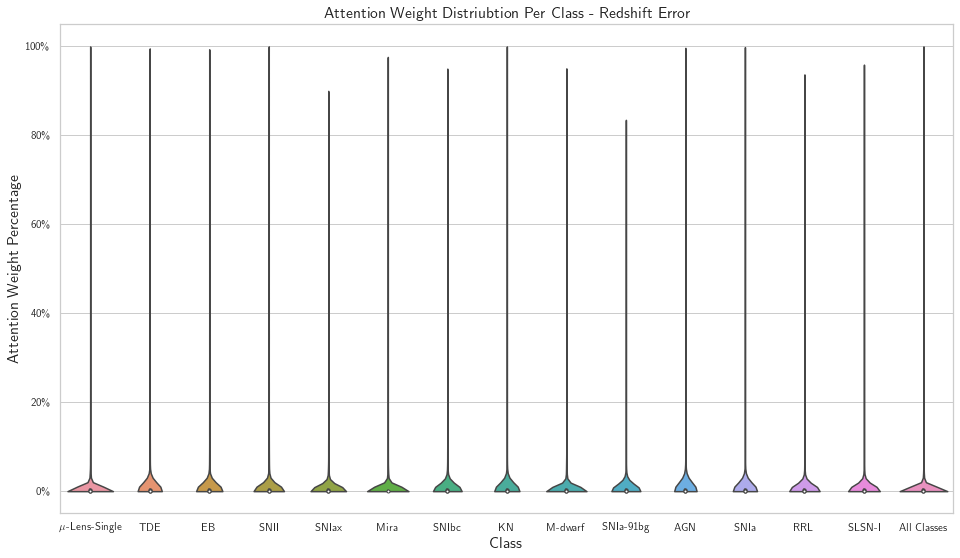

In [605]:
ax = sns.violinplot(x=data_all["class"], y=data_all["redshift-error"], cut=0)

ax.set_title(r'Attention Weight Distriubtion Per Class - Redshift Error ', fontsize=16);
ax.set_xlabel('Class', fontsize=16)
ax.set_xticklabels(class_names)
ax.set_ylabel('Attention Weight Percentage', fontsize=16)
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

In [ ]:
ac_data = pd.concat([data["redshift"], chunk])

In [589]:
# g = sns.catplot(x=data["class"], y=data["redshift"],
#                 data=data["redshift"], kind="violin", split=True,);

[(0.0, 0.05)]

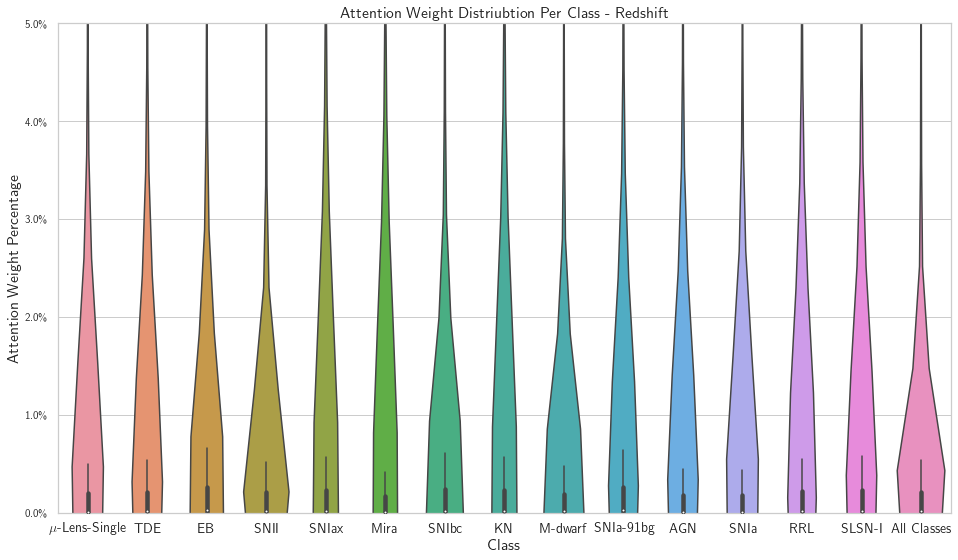

In [606]:
ax = sns.violinplot(x=data_all["class"], y=data_all["redshift"])

ax.set_title(r'Attention Weight Distriubtion Per Class - Redshift', fontsize=16);
ax.set_xlabel('Class', fontsize=16)
ax.set_xticklabels(class_names, fontsize=14)
ax.set_ylabel('Attention Weight Percentage', fontsize=16)
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax.set(ylim=(0, 0.05))

In [531]:
df = data[data["redshift"] < 0.0001]

In [532]:
df['redshift'].dtypes, df.shape

(dtype('float32'), (12914, 103))

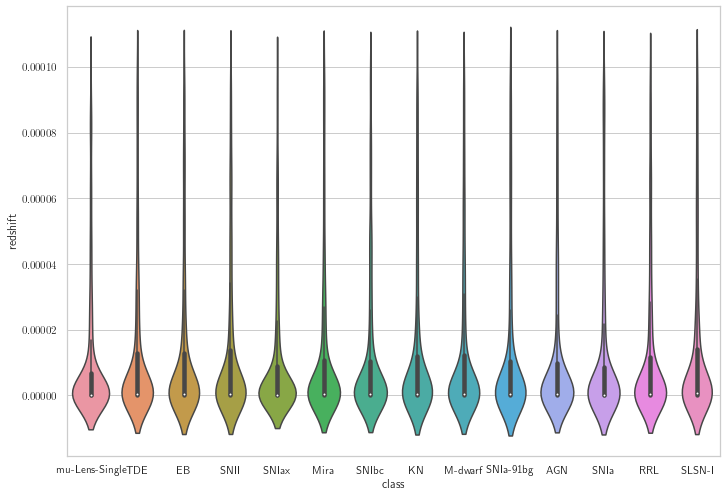

In [533]:
ax = sns.violinplot(x=df["class"], y=df['redshift'], inner="box")

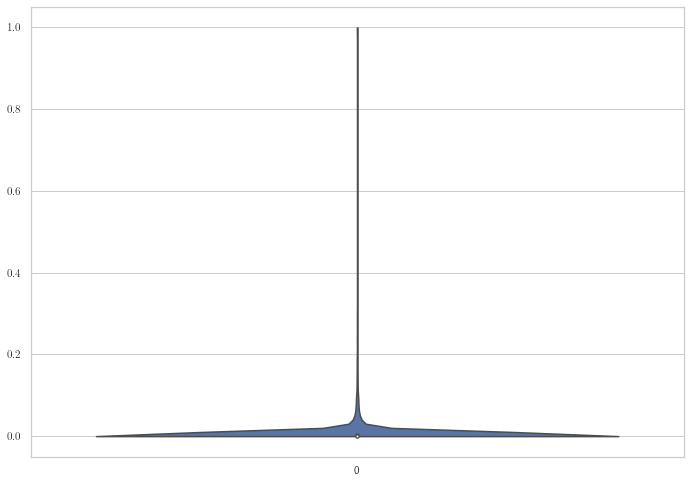

In [542]:
# df = data[data["redshift"] < 0.0001]
ax = sns.violinplot(data=data["redshift"], inner="box", cut=0)

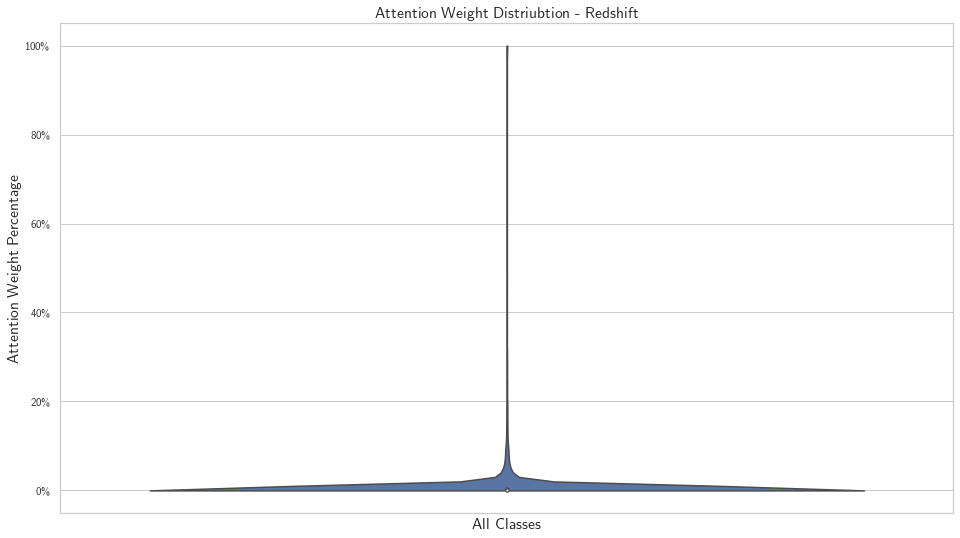

In [580]:
ax = sns.violinplot(data=data["redshift"], inner="box", cut=0)

ax.set_title(r'Attention Weight Distriubtion - Redshift', fontsize=16)
ax.set_xlabel('All Classes', fontsize=16)
ax.set_xticks([])
ax.set_ylabel('Attention Weight Percentage', fontsize=16)
ax.yaxis.set_major_formatter(ticker.PercentFormatter(1.0))

In [436]:
data[data['redshift']==data['redshift'].max()]

,0,1,2,3,4,5,6,7,8,9,...,93,94,95,96,97,98,99,redshift,redshift_error,class
301,0.00175880,0.00005083,0.00000001,0.00018567,0.00014509,0.00032667,0.00287892,0.00001031,0.00000001,0.00009683,...,0.00021943,0.00000006,0.00005397,0.00000313,0.00003361,0.00000000,0.00014999,0.99993134,0.00031252,mu-Lens-Single


In [410]:
data["redshift"][data["class"] == class_names[0]]

0      0.00492
1      0.00173
2      0.00093
3      0.00204
4      0.00421
         ...  
1957   0.00000
1958   0.00000
1959   0.00000
1960   0.00225
1961   0.00006
Name: redshift, Length: 1962, dtype: float32

In [394]:
# frames = [ chunk["class"] = class_names[i] for i, chunk in enumerate(np.array_split(df, 14)) ]
# result = pd.concat(frames)

In [383]:
np.array_split(df, 14)

[      redshift  redshift_error
 0      0.00492         0.00042
 1      0.00173         0.00031
 2      0.00093         0.00596
 3      0.00204         0.00362
 4      0.00421         0.00053
 ...        ...             ...
 1957   0.00000         0.00000
 1958   0.00000         0.00000
 1959   0.00000         0.00000
 1960   0.00225         0.00017
 1961   0.00006         0.00077
 
 [1962 rows x 2 columns],
       redshift  redshift_error
 1962   0.01878         0.00000
 1963   0.00376         0.00149
 1964   0.00001         0.00612
 1965   0.00103         0.00076
 1966   0.00645         0.00000
 ...        ...             ...
 3919   0.00001         0.00000
 3920   0.00004         0.00002
 3921   0.00005         0.02544
 3922   0.00389         0.00002
 3923   0.00079         0.42877
 
 [1962 rows x 2 columns],
       redshift  redshift_error
 3924   0.00059         0.00052
 3925   0.00000         0.00325
 3926   0.00373         0.00019
 3927   0.00089         0.00001
 3928   0.00002 

In [ ]:
pd.DataFrame(data=cam_all[1:,1:],    # values
              index=data[1:,0],    # 1st column as index
              columns=data[0,1:])  # 1st row as the column names

In [50]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [325]:
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
def show_cam(image_index, desired_class, counter):
    '''displays the class activation map of a particular image'''

  # takes the features of the chosen image
    features_for_img = features[image_index,:,:]

  # get the class with the highest output probability
    prediction = np.argmax(results[image_index])

  # get the gap weights at the predicted class
    class_activation_weights = gap_weights[:,prediction]

  # upsample the features to the image's original size (28 x 28)
#   class_activation_features = sp.ndimage.zoom(features_for_img, (28/3, 28/3, 1), order=2)
    class_activation_features = features_for_img

  # compute the intensity of each feature in the CAM
    cam_output = np.dot(class_activation_features,class_activation_weights)
    print(cam_output.shape)
    print(np.expand_dims(cam_output, axis=0).shape)
    cam_output = np.expand_dims(cam_output, axis=0)
    print('Predicted Class = ' +str(prediction)+ ', Probability = ' + str(results[image_index][prediction]))
  
    if (results[image_index][prediction] < 0.90):
        return False

    my_cmap = sns.light_palette("Navy", as_cmap=True)
    fig, ax = plt.subplots(figsize=(20, 8))
    from scipy.special import softmax
    sns.heatmap(softmax(cam_output), cmap=my_cmap, cbar=False, robust=True, ax=ax, annot=False, fmt=".1%",) # vmin=v.min(), vmax=v.max()
    cbar = ax.figure.colorbar(ax.collections[0])
    cbar.set_ticks([0, 1])
    cbar.set_ticklabels(["0%", "100%"])
    ax2 = ax.twinx()
#     ax2.set_ylabel(r'\textit{d}', labelpad=15, fontsize=36)
    ax2.plot(X_test[image_index], lw=5)

    ax2.grid(False)
    ax2.get_yaxis().set_visible(True)
    
    ax2.set_yticklabels([])
#     ax.set_xticklabels([])

#     ax.xaxis.set_ticks(np.arange(1, 100, 10))
#     ticks = ['$0$', '$10$', '$20$', '$30$', '$40$', '$50$', '$60$', '$70$', '$80$', '$90$']
# #     lst = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90]
#     lst = list(np.linspace(0, 100, 10, endpoint=False, dtype=int))
# #     ticks = list(map(str, lst))
#     ax.set_xticklabels(ticks)
#     ax.tick_params(axis='x', direction='out', length=6, width=2, colors='k',
#                grid_color='k', grid_alpha=0.5)

    ax.set_xlabel(r'Sequence Length, $L$', fontsize=28)
    ax2.set_ylabel(r'Attention Weight Percentage', fontsize=28)

    ax.tick_params(which='minor', width=1.25)
    ax.tick_params(which='minor', length=3.5)
    
    ax.xaxis.set_major_locator(MultipleLocator(20))
    ax.xaxis.set_major_formatter(mpl.ticker.FormatStrFormatter(r'${%d}$'))

    # For the minor ticks, use no labels; default NullFormatter.
#     ax.xaxis.set_minor_locator(MultipleLocator(5))
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.get_yaxis().set_visible(False)
    
    plt.axvline(x=99, color="lime", linestyle="dashed", linewidth=2)
  # display the image
    plt.title(rf"Predicted Class: {class_names[desired_class]} with Probability = {results[image_index][prediction]:.3f}", fontsize=36)
    plt.savefig(f"{asnwd}/notebooks/cams/CAM-{class_names[desired_class]}-{counter}")
    plt.show()
    plt.clf()

In [326]:
list(np.linspace(0, 100, 10, endpoint=False, dtype=int))

[0, 10, 20, 30, 40, 50, 60, 70, 80, 90]

In [327]:
def show_maps(desired_class, num_maps):
    '''
    goes through the first 10,000 test images and generates CAMs 
    for the first `num_maps`(int) of the `desired_class`(int)
    '''

    counter = 0

    if desired_class > (len(class_names) - 1):
        print("please choose a class between 0 and {len(class_names) - 1}")

    # go through the first 10000 images
    for i in range(0,1000):
        # break if we already displayed the specified number of maps
        if counter == num_maps:
            break

        # images that match the class will be shown
        random_sample = np.random.choice(len(results), 1)[0]
        if np.argmax(results[random_sample]) == desired_class:
#         if np.argmax(results[i]) == desired_class:
#             counter += 1
            sc = show_cam(random_sample, desired_class, counter)
            if sc is not None:
                continue 
            else:
                 counter += 1   

In [387]:
class_names

['mu-Lens-Single',
 'TDE',
 'EB',
 'SNII',
 'SNIax',
 'Mira',
 'SNIbc',
 'KN',
 'M-dwarf',
 'SNIa-91bg',
 'AGN',
 'SNIa',
 'RRL',
 'SLSN-I']

In [329]:
# import matplotlib; matplotlib.matplotlib_fname()
# import matplotlib as mpl
# import matplotlib.pyplot as plt

mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=28)
mpl.rc('ytick', labelsize=28)

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.serif": ["Computer Modern Roman"]})

In [390]:
class_names.index("SNIa"), class_names[0]

(11, 'mu-Lens-Single')

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9762156


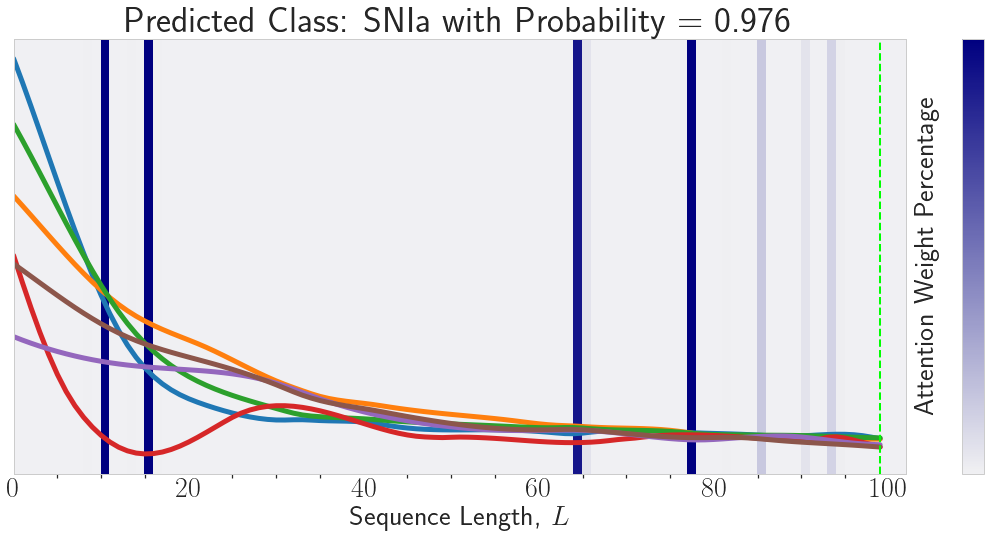

<Figure size 1440x216 with 0 Axes>

In [330]:
show_maps(desired_class=class_names.index("SNIa"), num_maps=1)

In [125]:
# import matplotlib.pyplot as plt
# from matplotlib.pyplot import *
# from matplotlib.ticker import AutoMinorLocator

# RVcurve_op_my_data_transit_out1 = "/Users/brettaddison/Desktop/RM_plot2.pdf"

# fig = plt.figure()
# plt.xlim(-250.0, 250.0)
# plt.ylim(-180.0, 100.0)
# ax = plt.subplot()
# plt.ylabel('Radial Velocity', fontsize=14)
# plt.axhline(y=-50.0, linestyle='dashed', linewidth=1.25, color="r", zorder=2)
# minorLocator = AutoMinorLocator(5)
# ax.xaxis.set_minor_locator(minorLocator)
# ax.yaxis.set_minor_locator(minorLocator)
# ax.yaxis.set_major_locator(MultipleLocator(50))
# ax.xaxis.set_major_locator(MultipleLocator(50))

### Make CAMs

(102,)
(1, 102)
Predicted Class = 0, Probability = 0.9249455


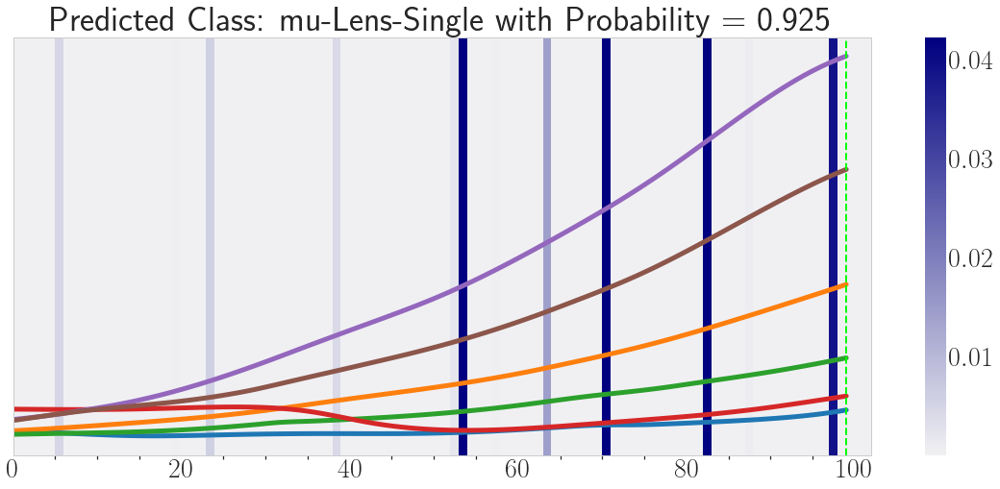

(102,)
(1, 102)
Predicted Class = 0, Probability = 0.8161757
(102,)
(1, 102)
Predicted Class = 0, Probability = 0.6190426
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.91857


<Figure size 1440x216 with 0 Axes>

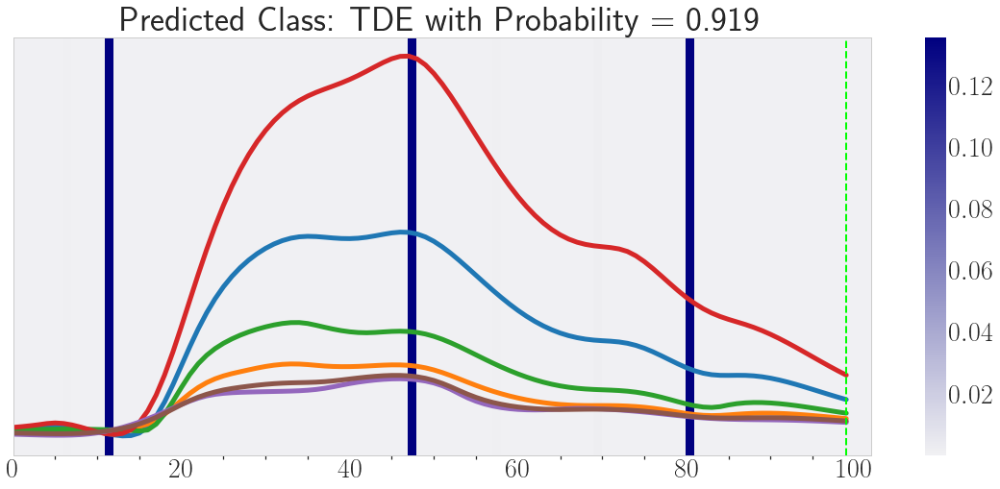

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9911067


<Figure size 1440x216 with 0 Axes>

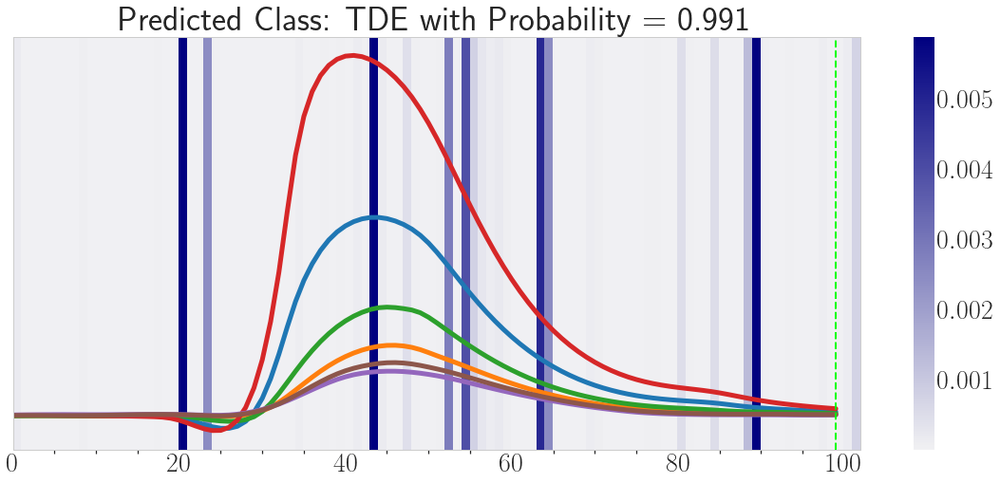

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.87153393
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9596946


<Figure size 1440x216 with 0 Axes>

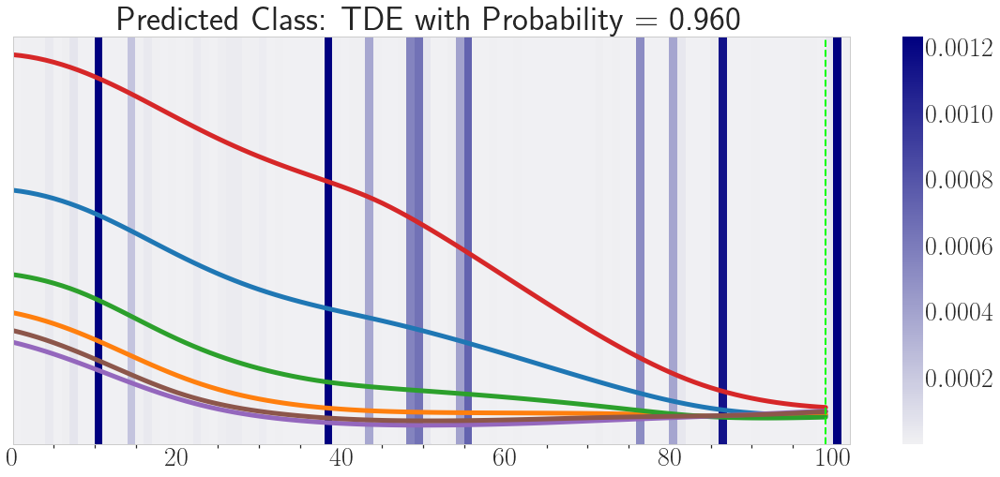

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.99937373


<Figure size 1440x216 with 0 Axes>

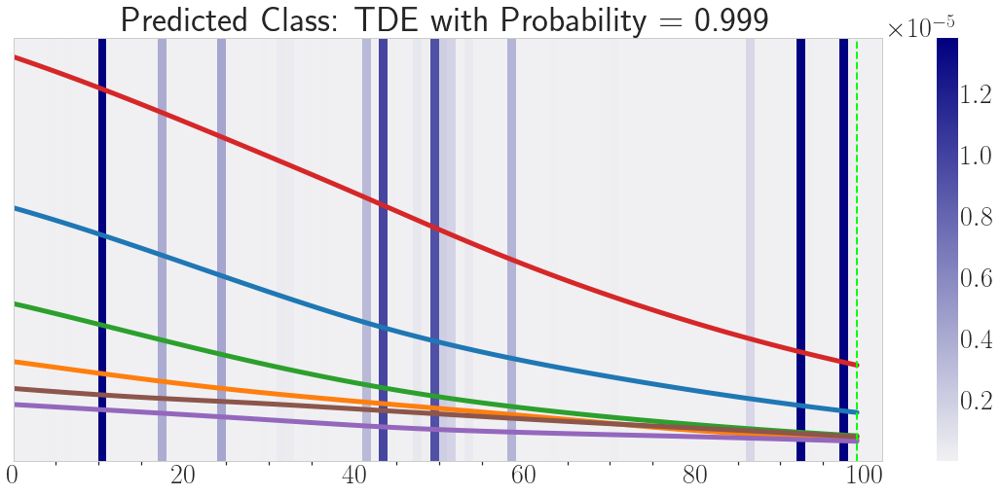

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.91889346


<Figure size 1440x216 with 0 Axes>

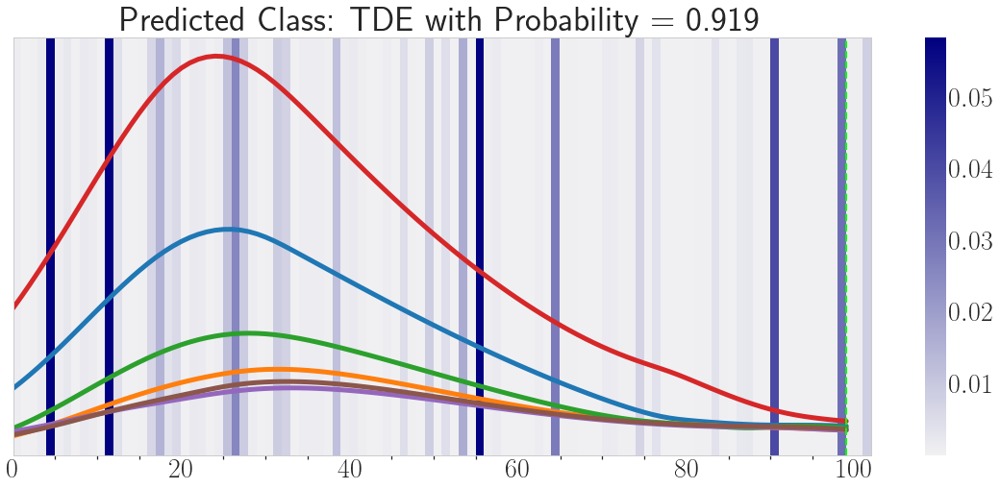

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.91857594


<Figure size 1440x216 with 0 Axes>

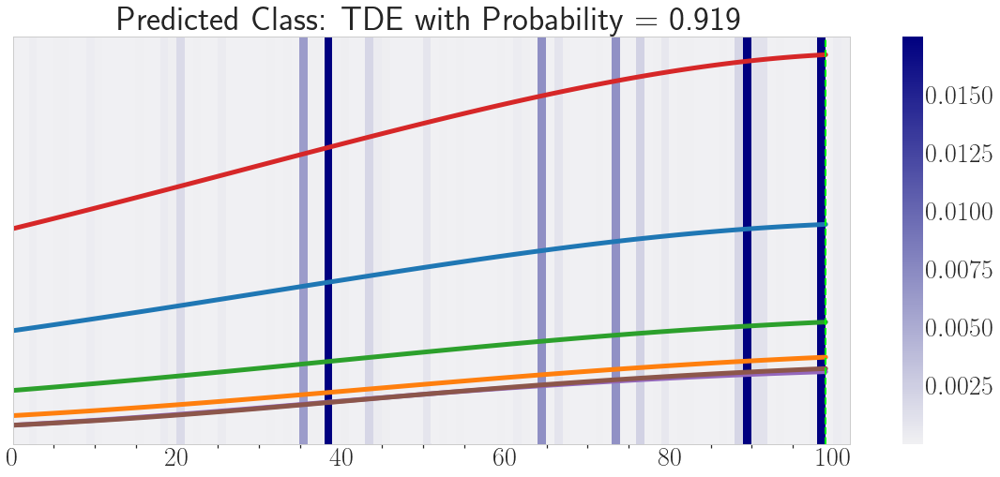

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9061642


<Figure size 1440x216 with 0 Axes>

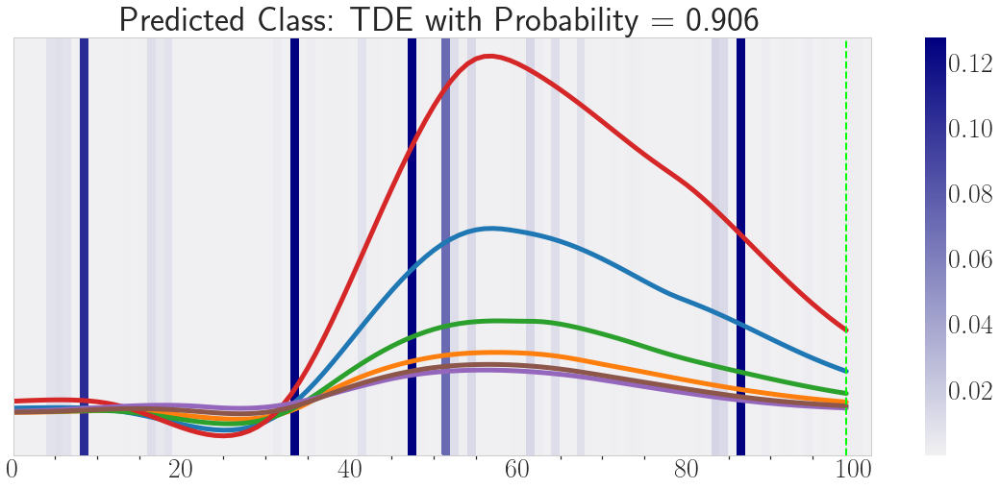

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.7330707
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.887581
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9741262


<Figure size 1440x216 with 0 Axes>

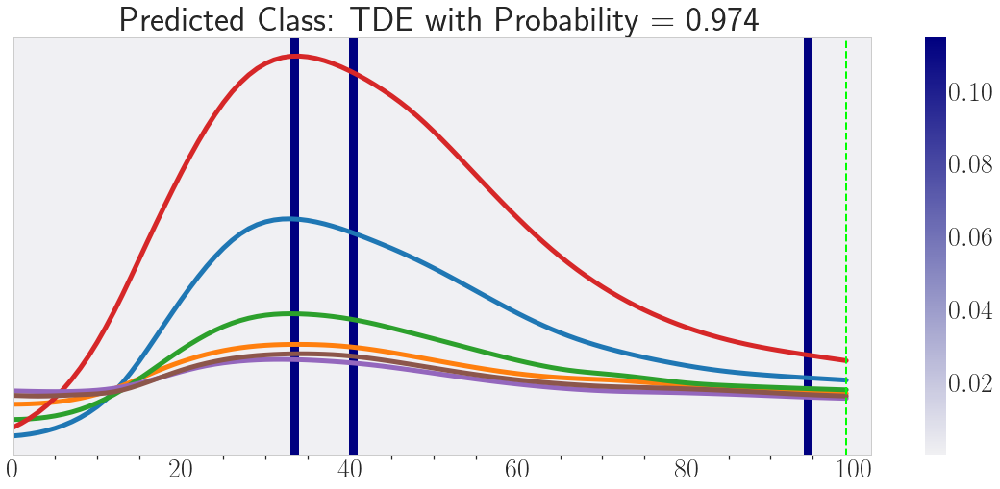

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9607567


<Figure size 1440x216 with 0 Axes>

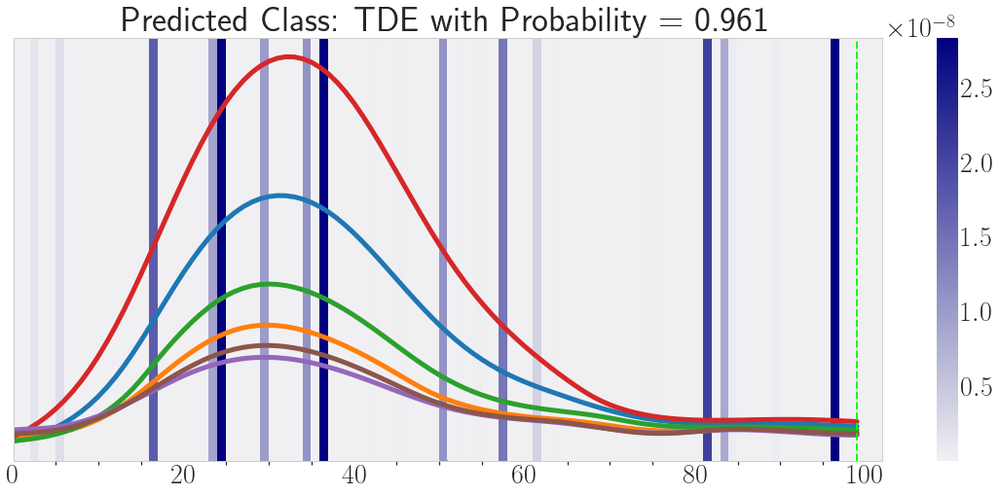

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9879781


<Figure size 1440x216 with 0 Axes>

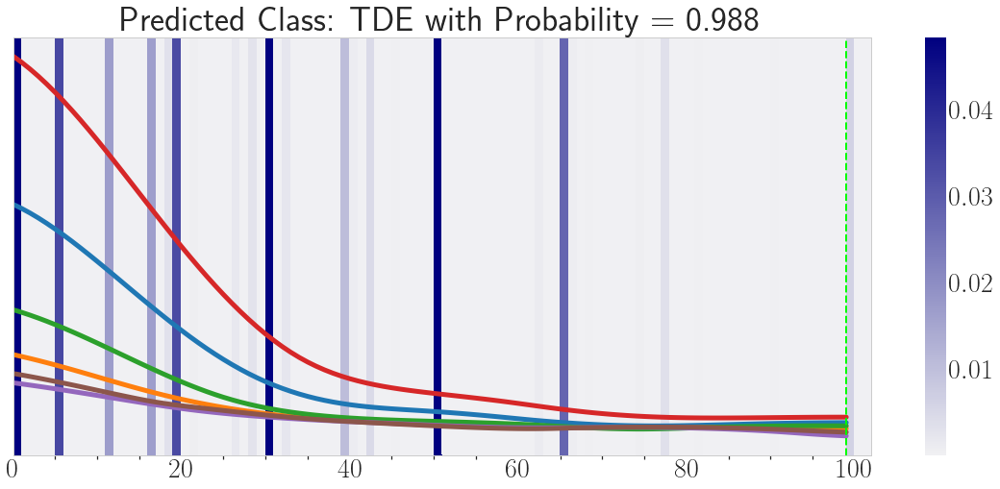

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.8888124
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9158829


<Figure size 1440x216 with 0 Axes>

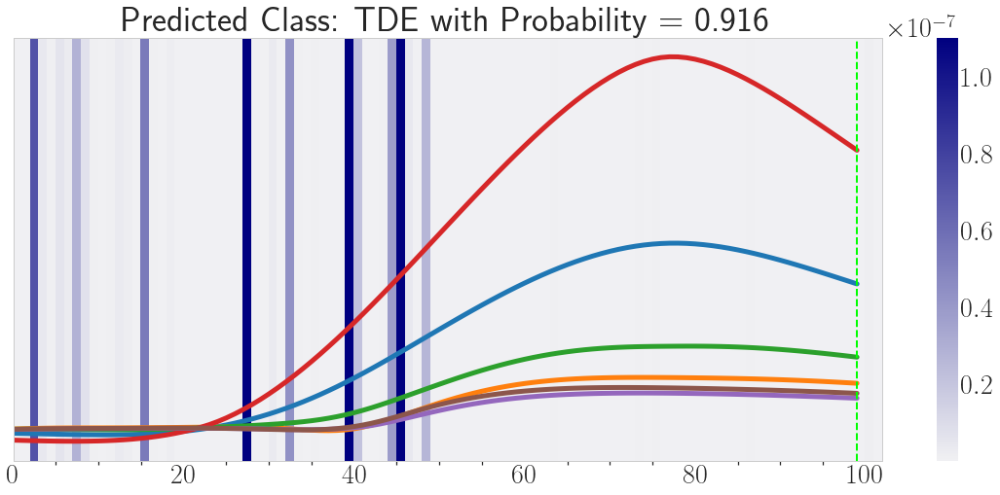

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9725591


<Figure size 1440x216 with 0 Axes>

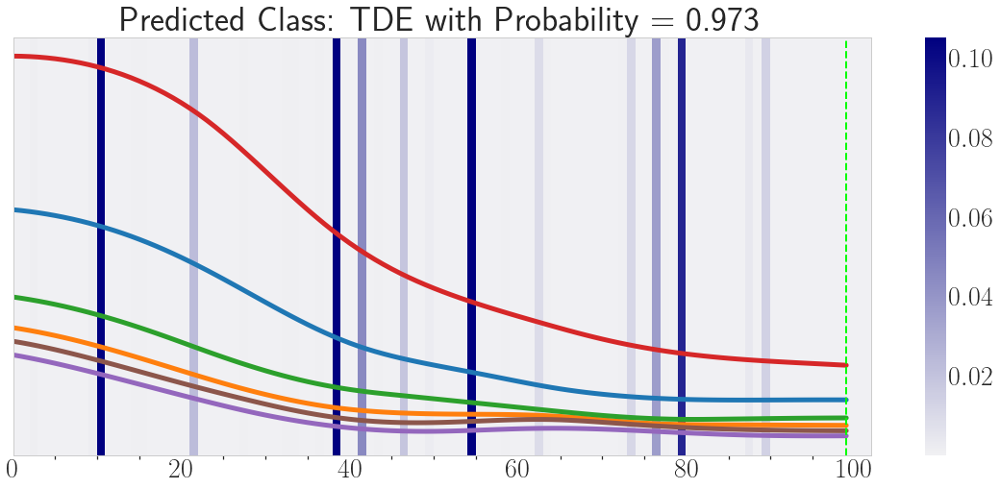

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.42254817
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.5301428
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.8745834
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.70456237
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.568376
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.85420704
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.78711295
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.3644908
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.8783143
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.99323297


<Figure size 1440x216 with 0 Axes>

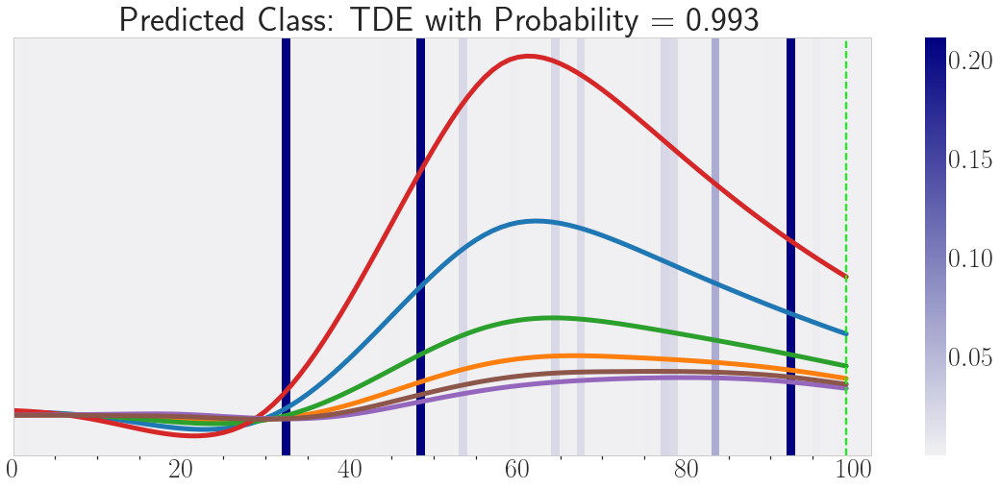

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.27370542
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.997761


<Figure size 1440x216 with 0 Axes>

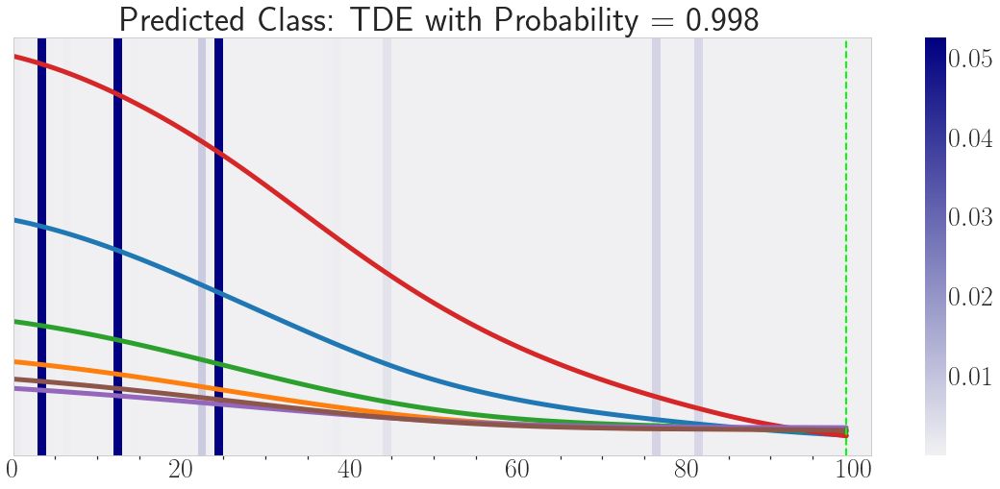

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9607567


<Figure size 1440x216 with 0 Axes>

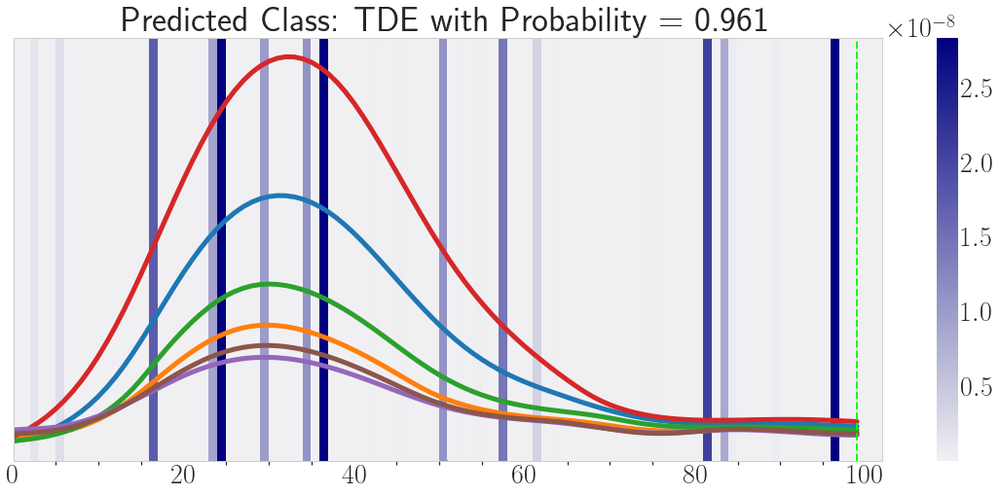

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.8307244
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9404268


<Figure size 1440x216 with 0 Axes>

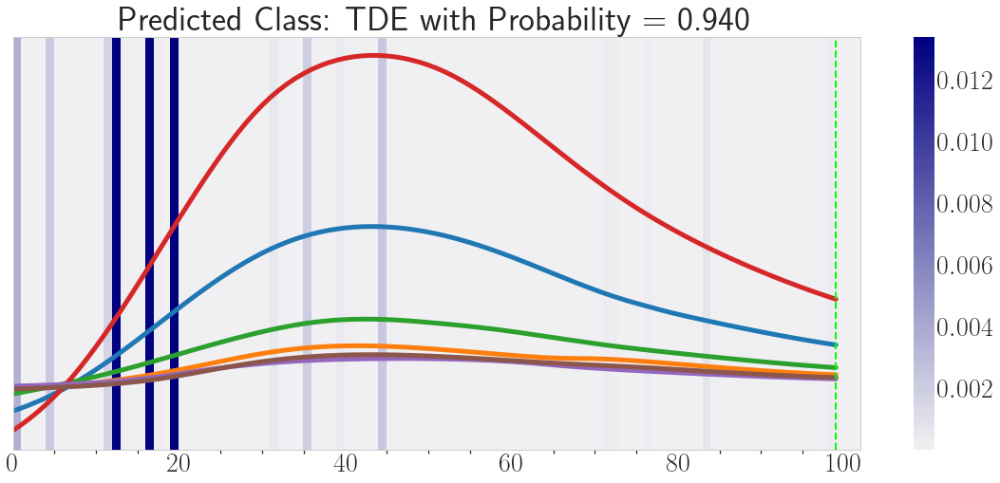

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.721409
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.98987806


<Figure size 1440x216 with 0 Axes>

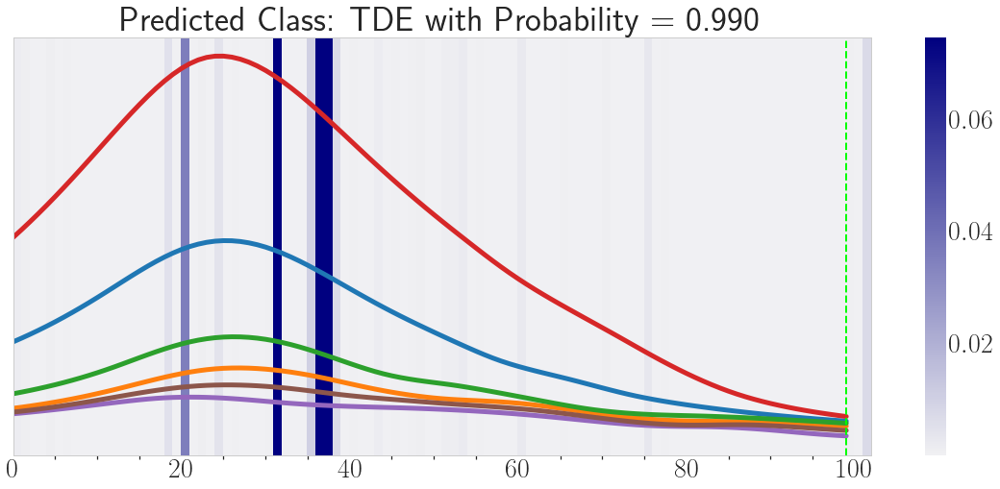

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.79767746
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9596946


<Figure size 1440x216 with 0 Axes>

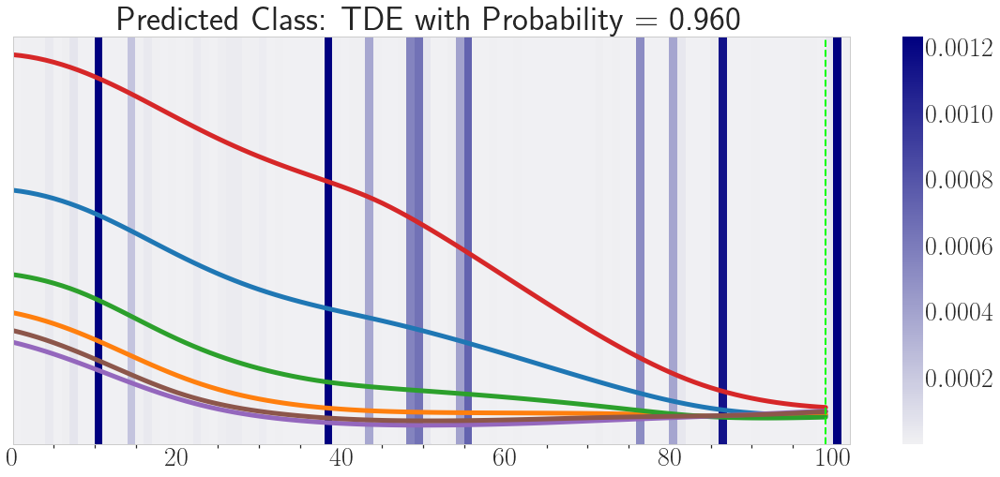

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.99797803


<Figure size 1440x216 with 0 Axes>

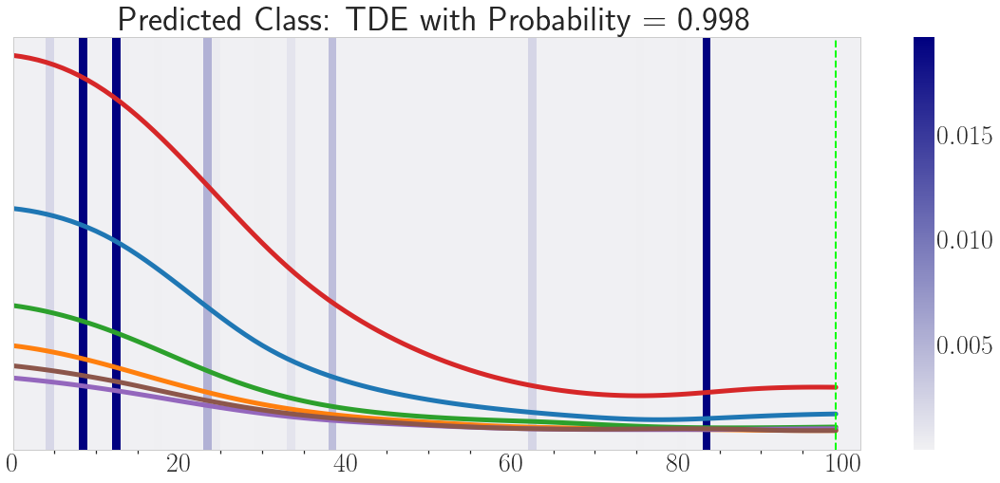

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.78876185
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.66393673
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.98228735


<Figure size 1440x216 with 0 Axes>

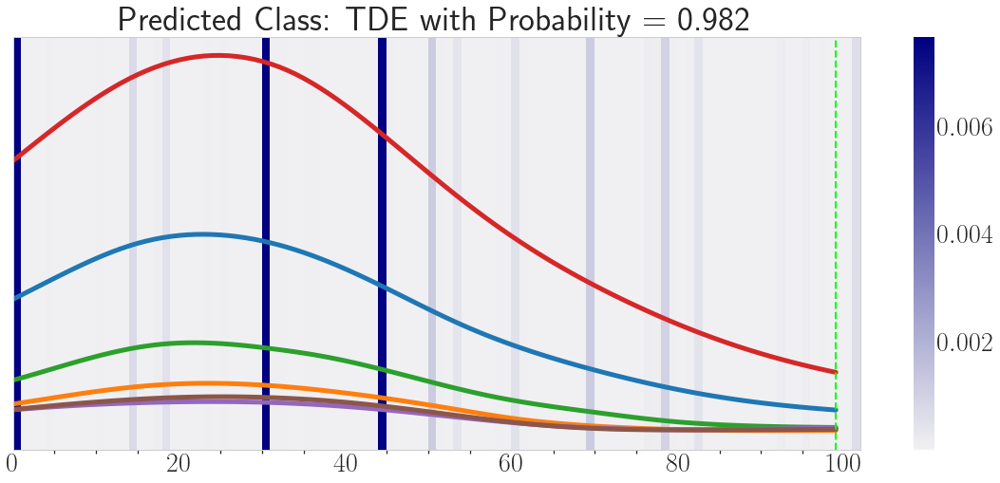

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9911082


<Figure size 1440x216 with 0 Axes>

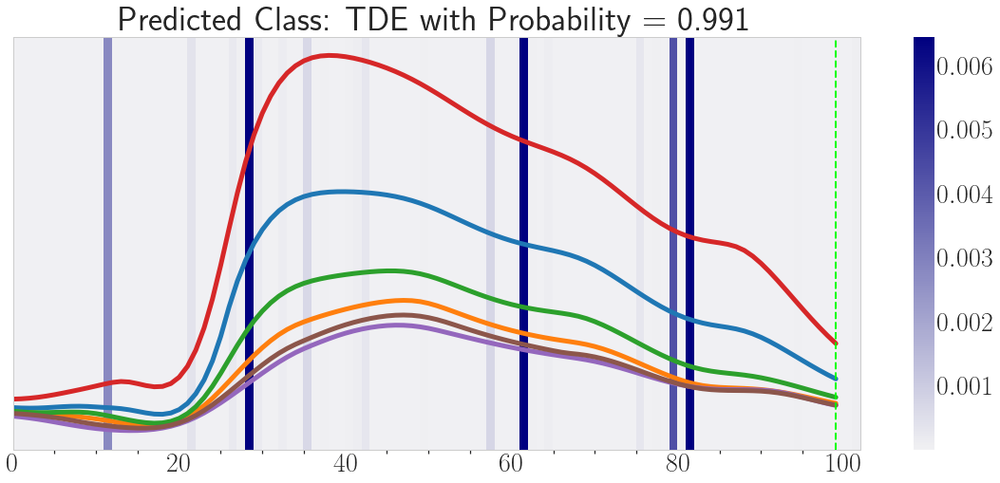

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.98987806


<Figure size 1440x216 with 0 Axes>

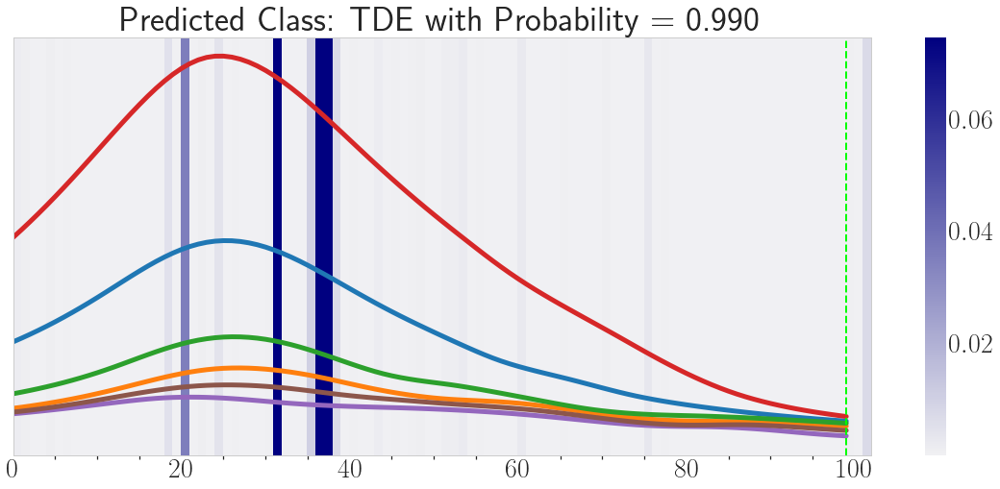

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.8888124
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.4075126
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.5301428
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.94081503


<Figure size 1440x216 with 0 Axes>

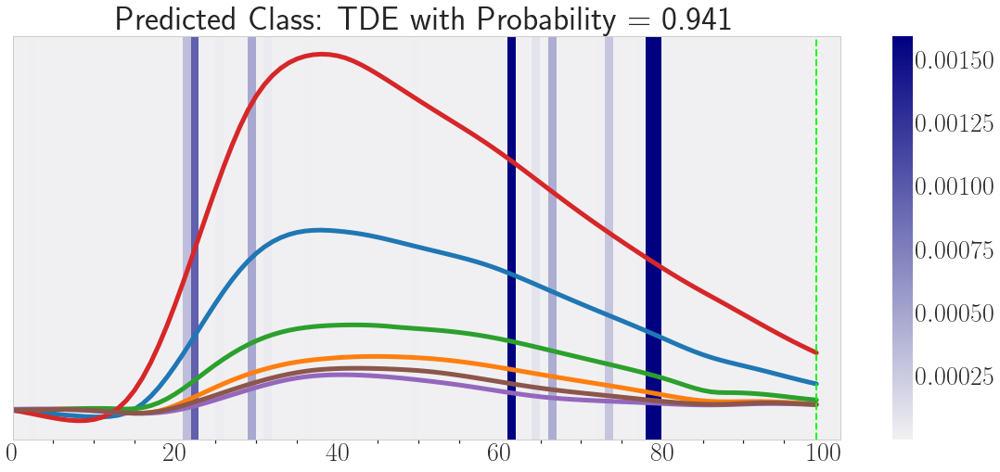

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9781568


<Figure size 1440x216 with 0 Axes>

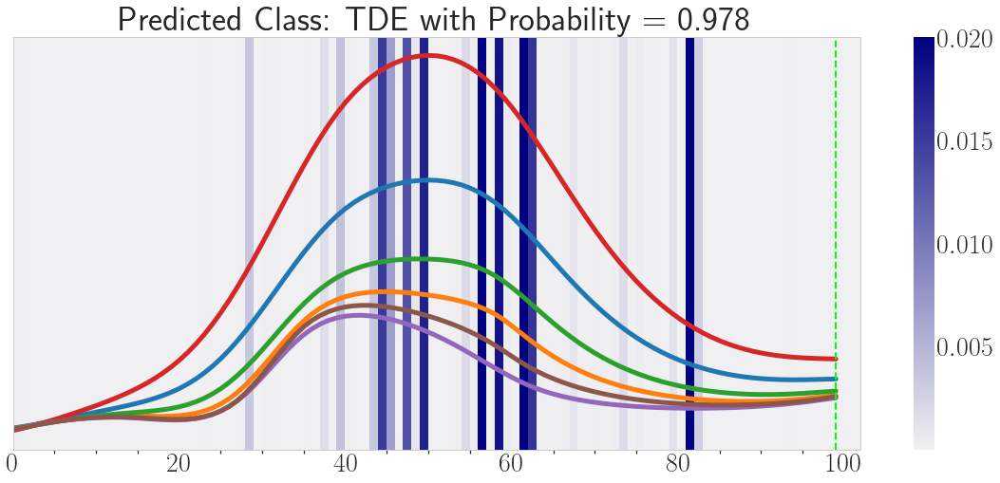

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9061642


<Figure size 1440x216 with 0 Axes>

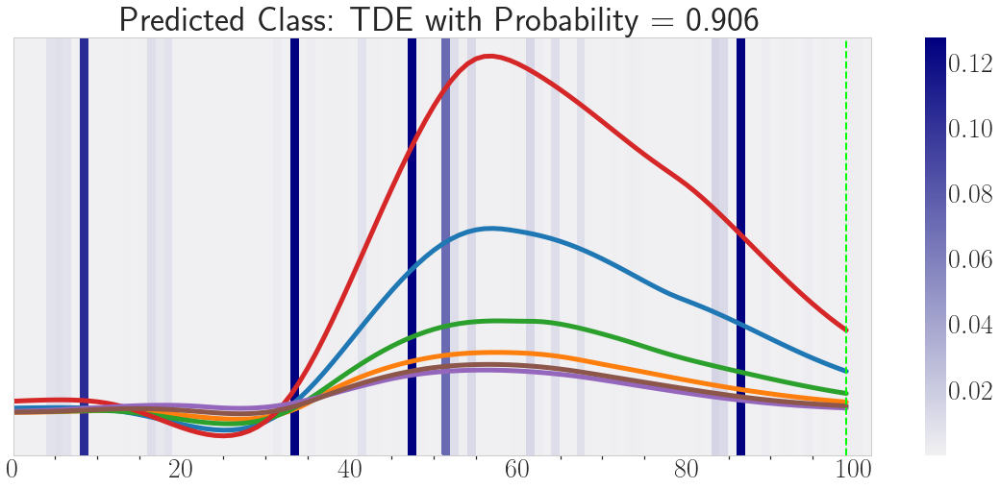

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.67310226
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.66393673
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9315649


<Figure size 1440x216 with 0 Axes>

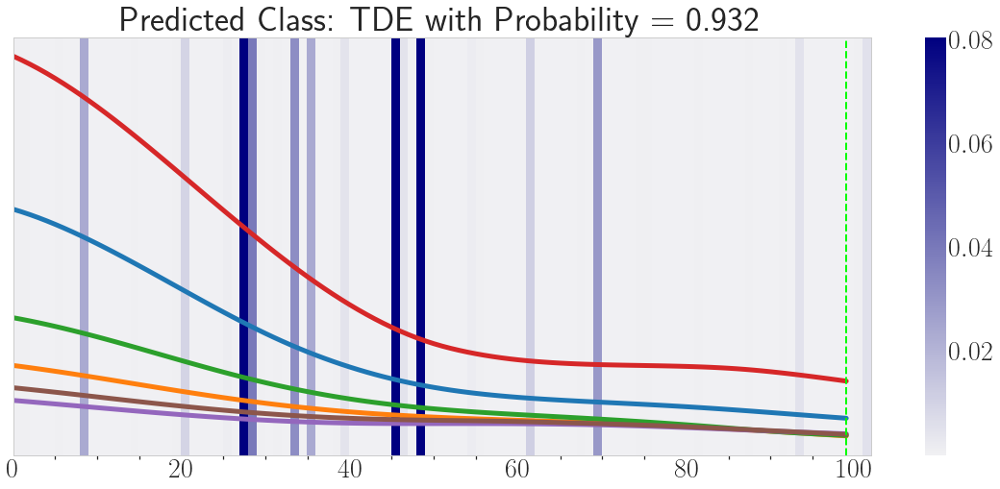

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.86386937
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.889296
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.99857926


<Figure size 1440x216 with 0 Axes>

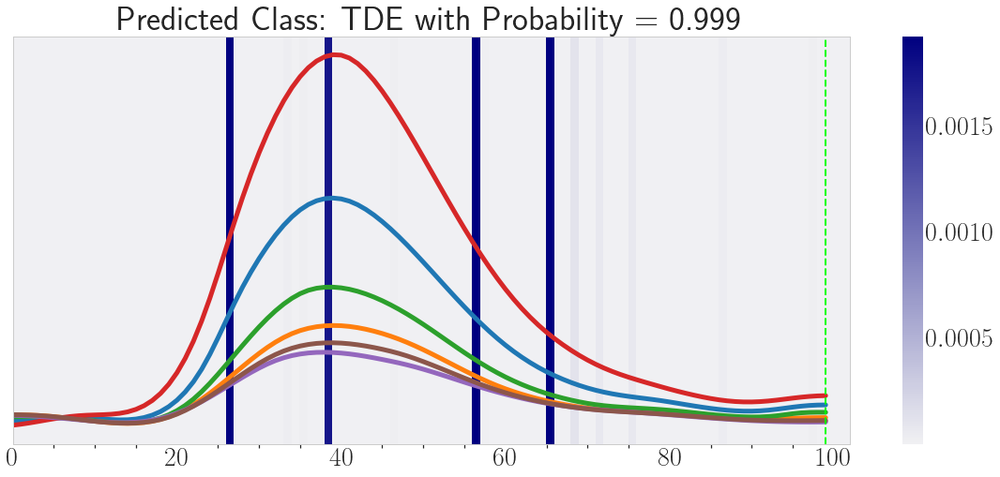

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.44102576
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9786743


<Figure size 1440x216 with 0 Axes>

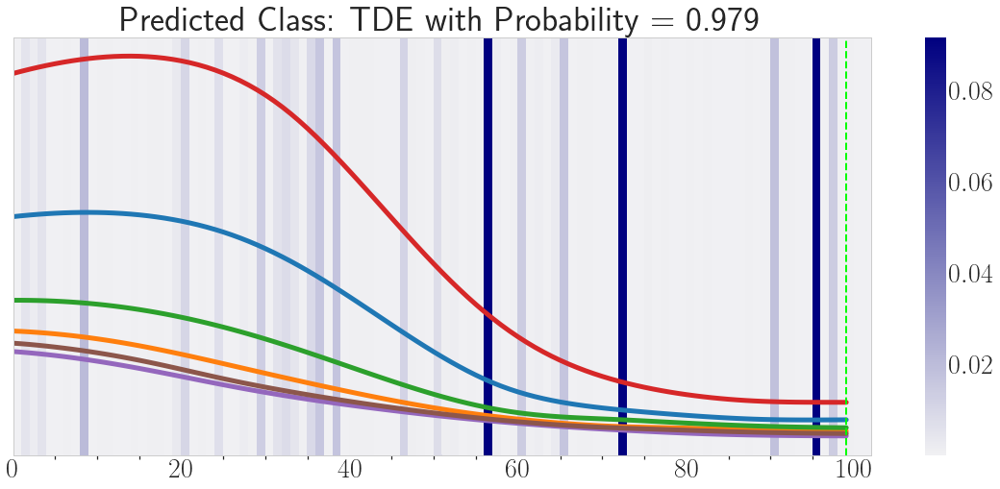

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.5571506
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.9404268


<Figure size 1440x216 with 0 Axes>

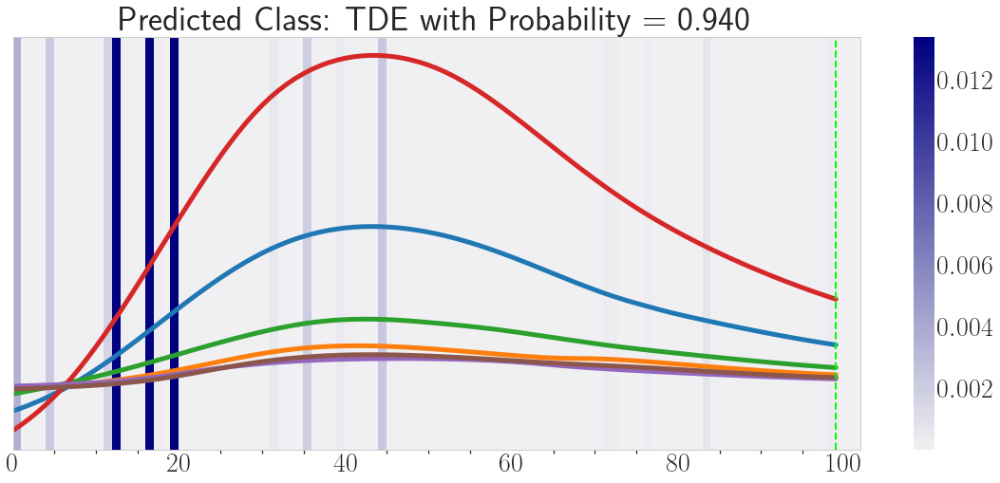

(102,)
(1, 102)
Predicted Class = 1, Probability = 0.5250899
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.39005628
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.8926484
(102,)
(1, 102)
Predicted Class = 1, Probability = 0.96683586


<Figure size 1440x216 with 0 Axes>

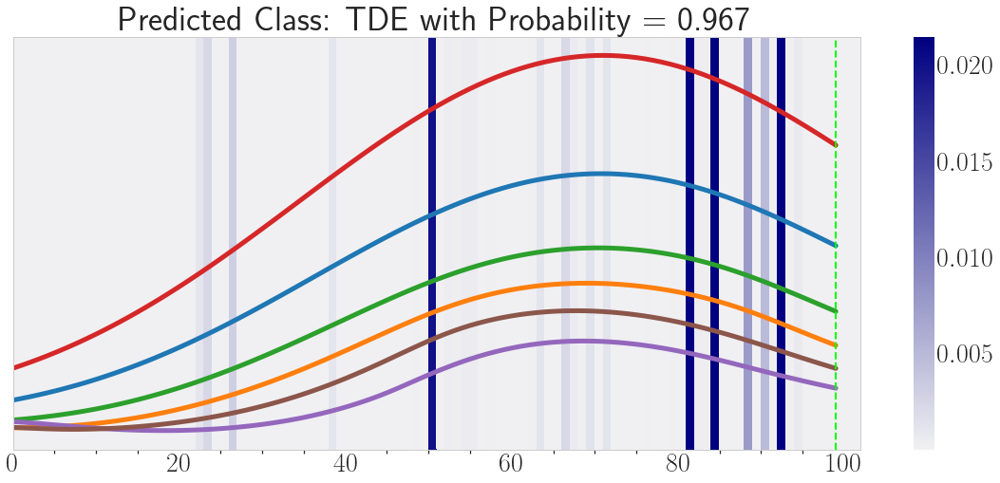

(102,)
(1, 102)
Predicted Class = 2, Probability = 1.0


<Figure size 1440x216 with 0 Axes>

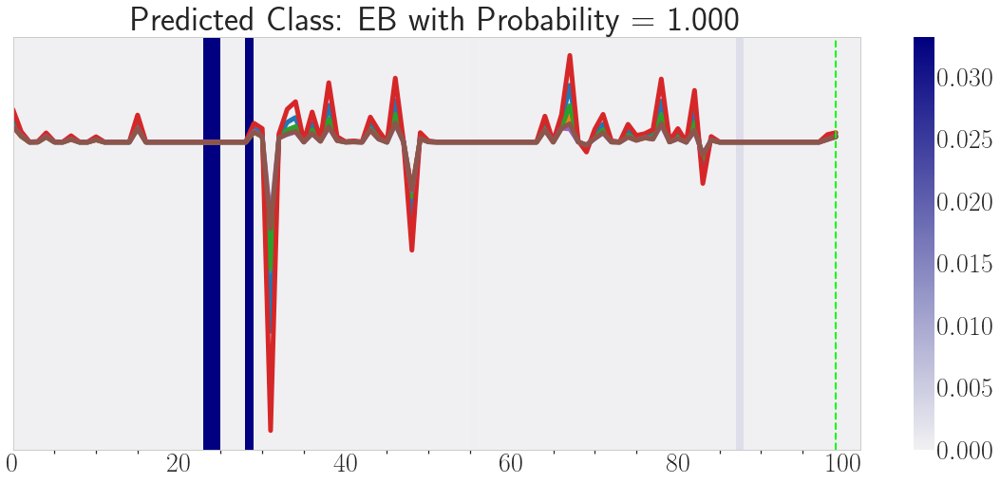

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.90906656


<Figure size 1440x216 with 0 Axes>

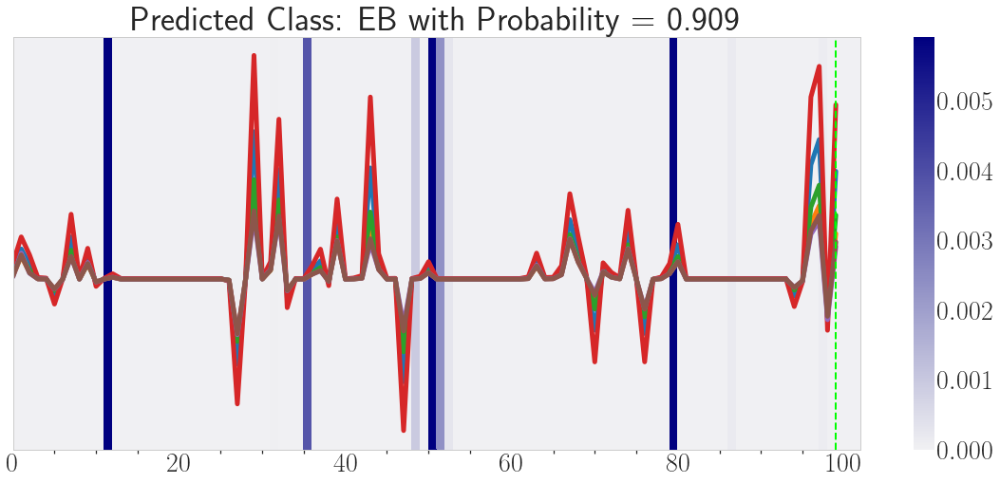

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.99769163


<Figure size 1440x216 with 0 Axes>

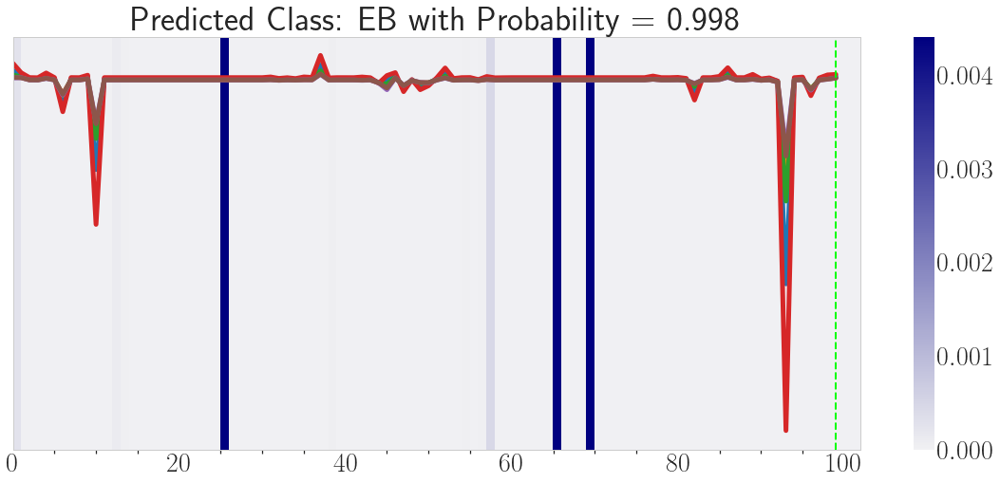

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.986446


<Figure size 1440x216 with 0 Axes>

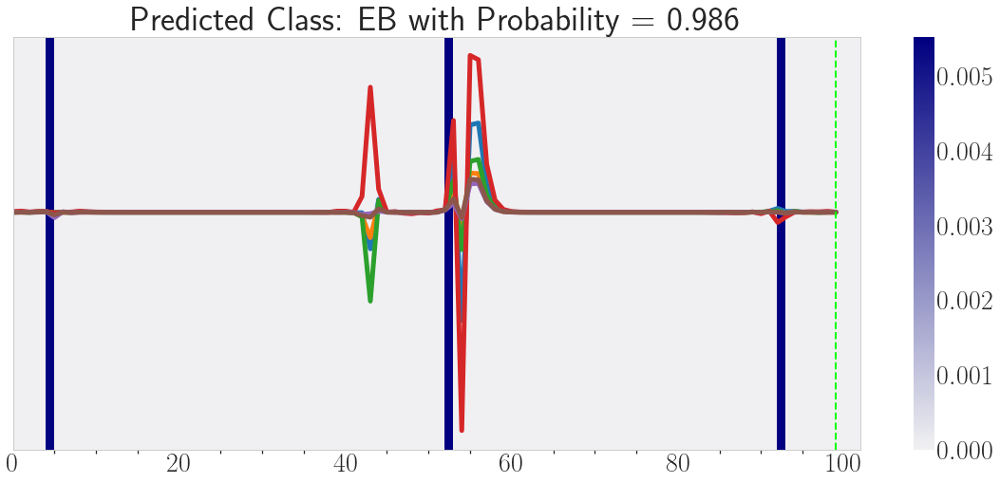

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9998914


<Figure size 1440x216 with 0 Axes>

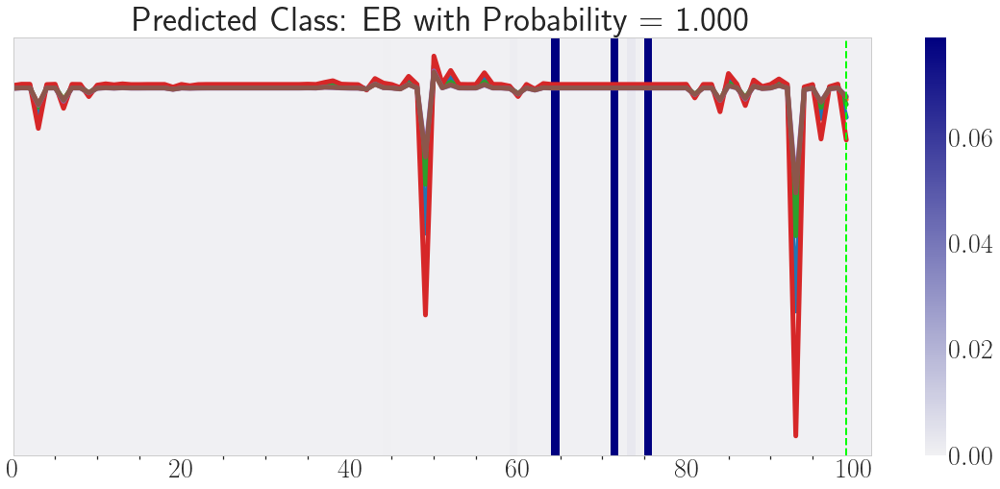

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9999794


<Figure size 1440x216 with 0 Axes>

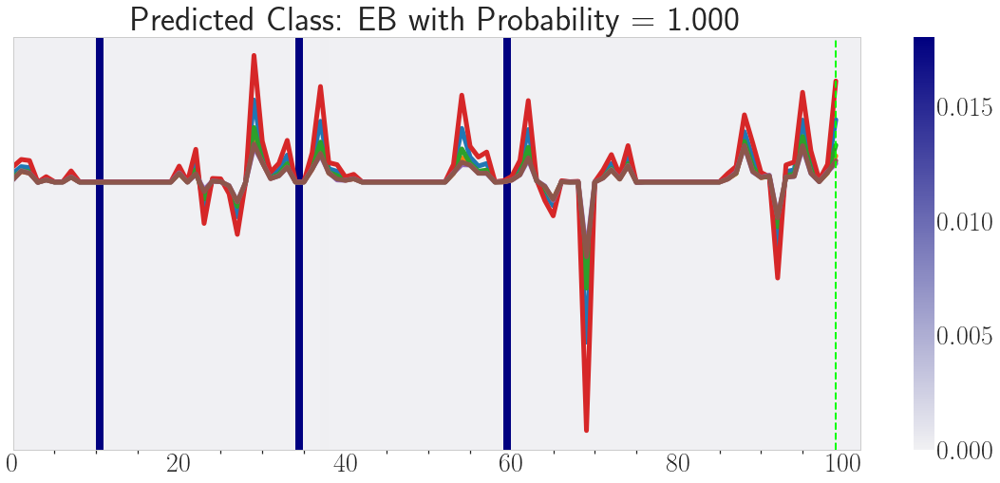

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.99991107


<Figure size 1440x216 with 0 Axes>

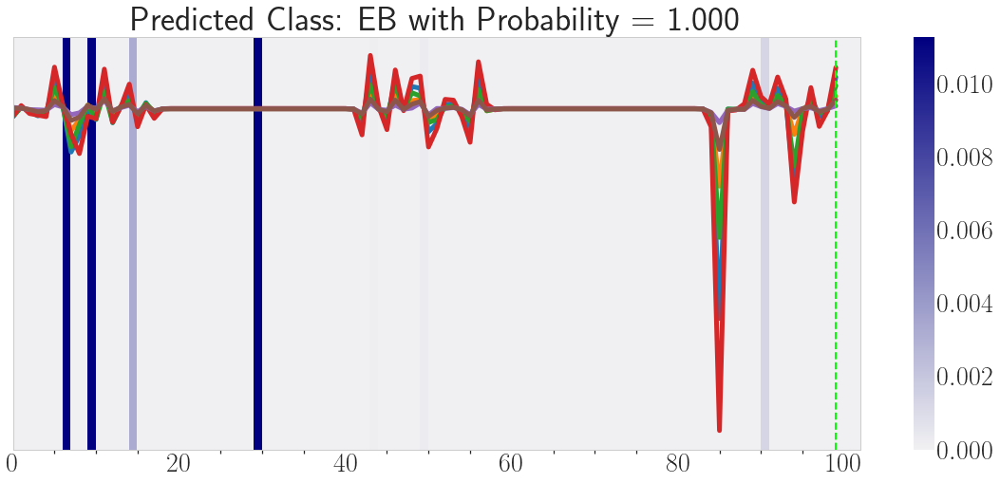

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.99923015


<Figure size 1440x216 with 0 Axes>

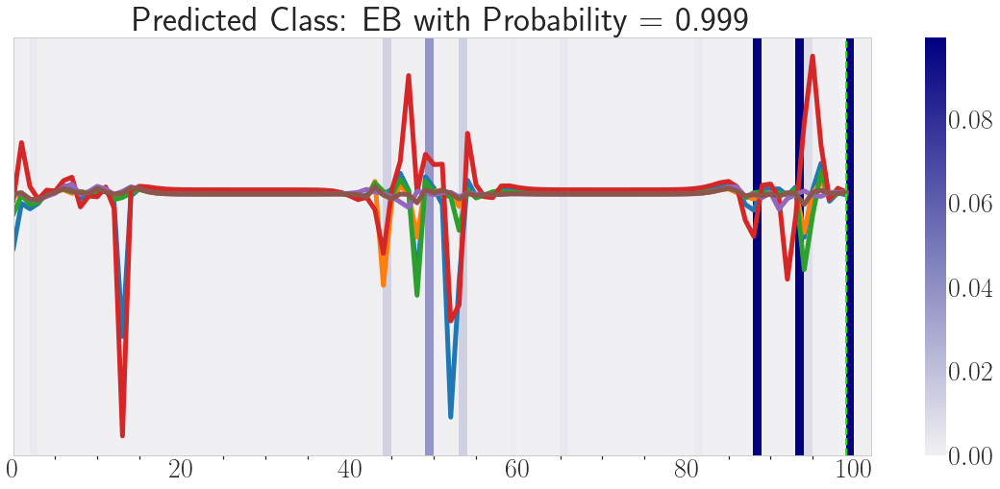

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.99986756


<Figure size 1440x216 with 0 Axes>

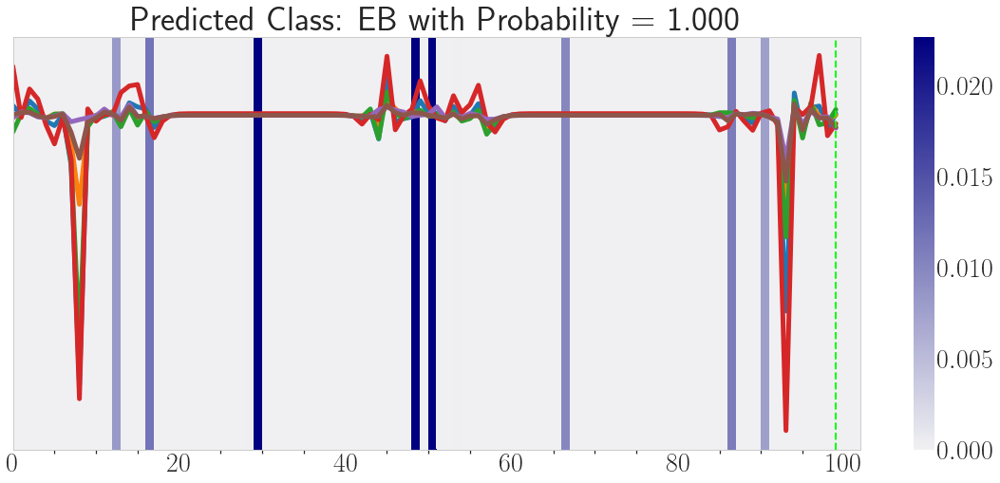

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.8951261
(102,)
(1, 102)
Predicted Class = 2, Probability = 0.99989355


<Figure size 1440x216 with 0 Axes>

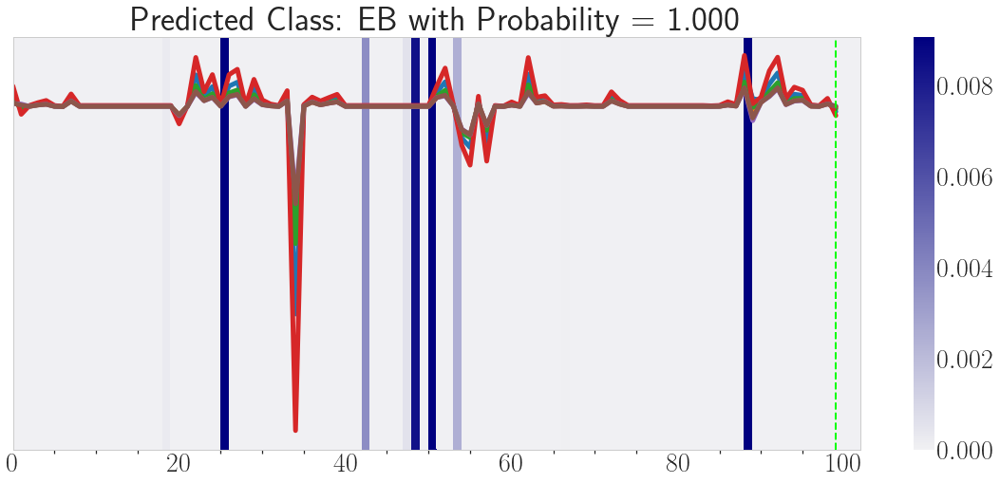

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9999993


<Figure size 1440x216 with 0 Axes>

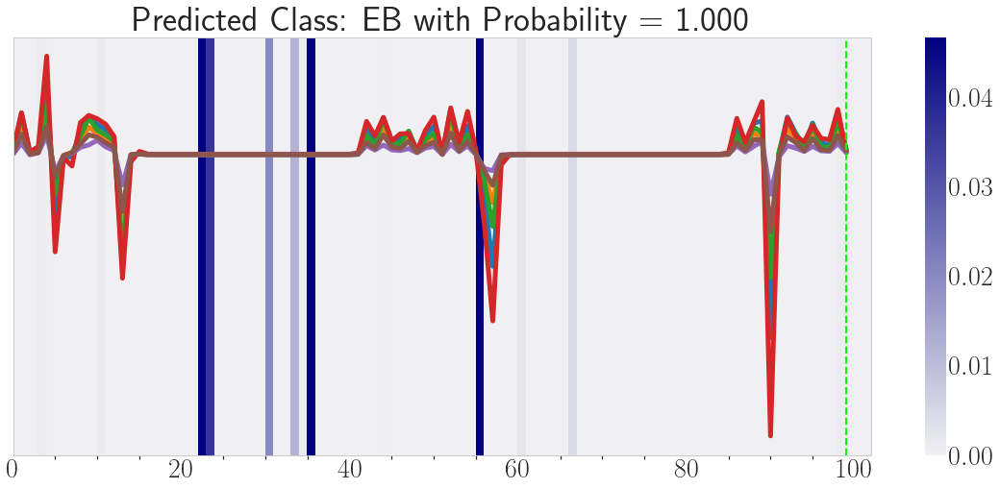

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.99769163


<Figure size 1440x216 with 0 Axes>

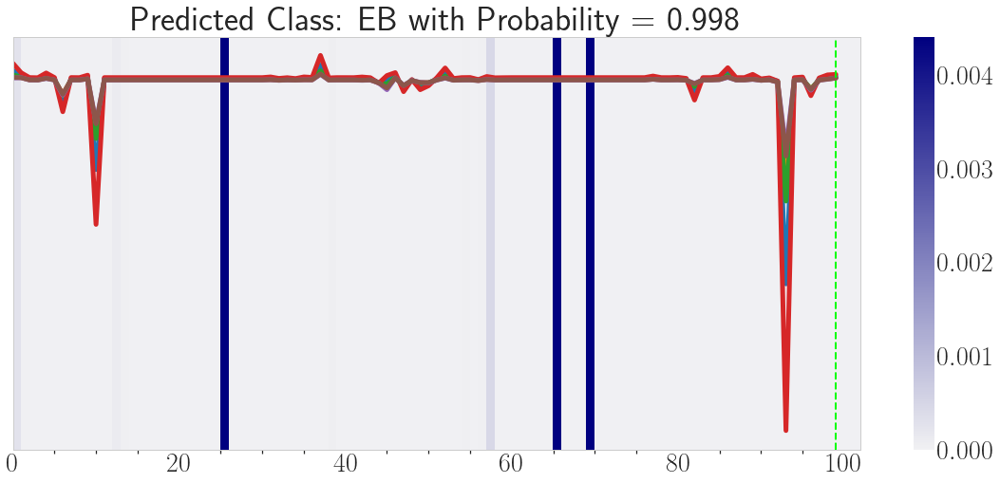

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9998914


<Figure size 1440x216 with 0 Axes>

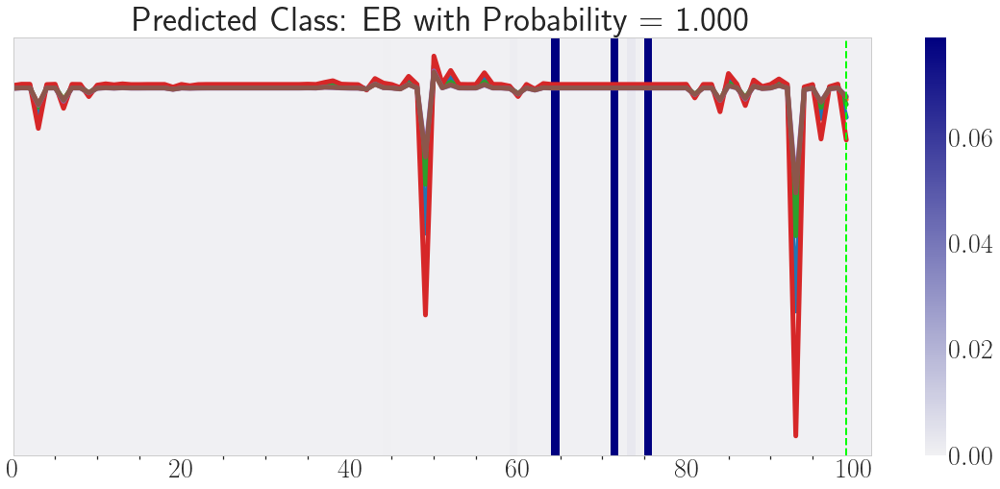

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.99996006


<Figure size 1440x216 with 0 Axes>

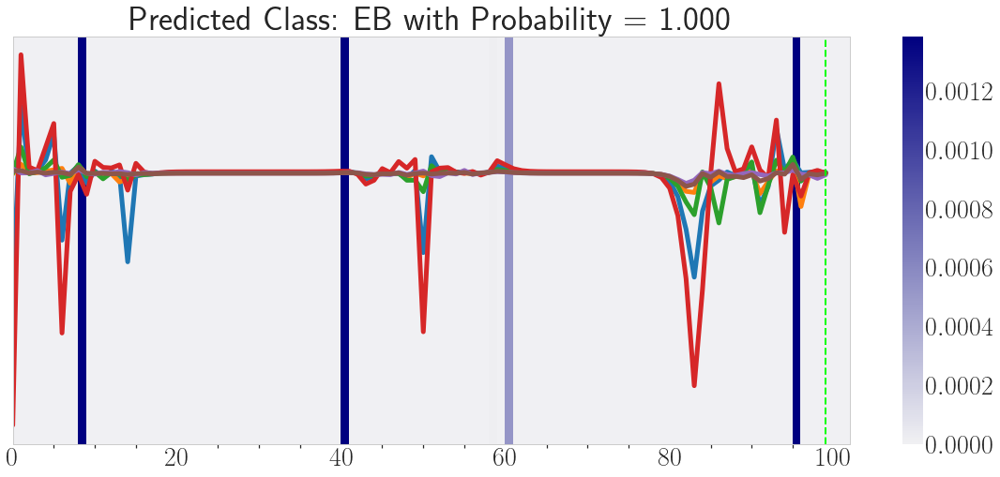

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.99991107


<Figure size 1440x216 with 0 Axes>

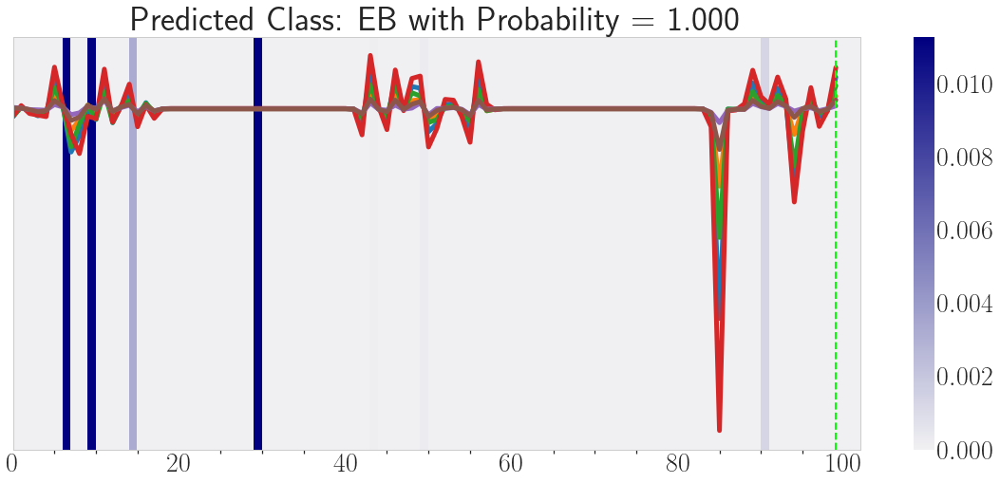

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9999993


<Figure size 1440x216 with 0 Axes>

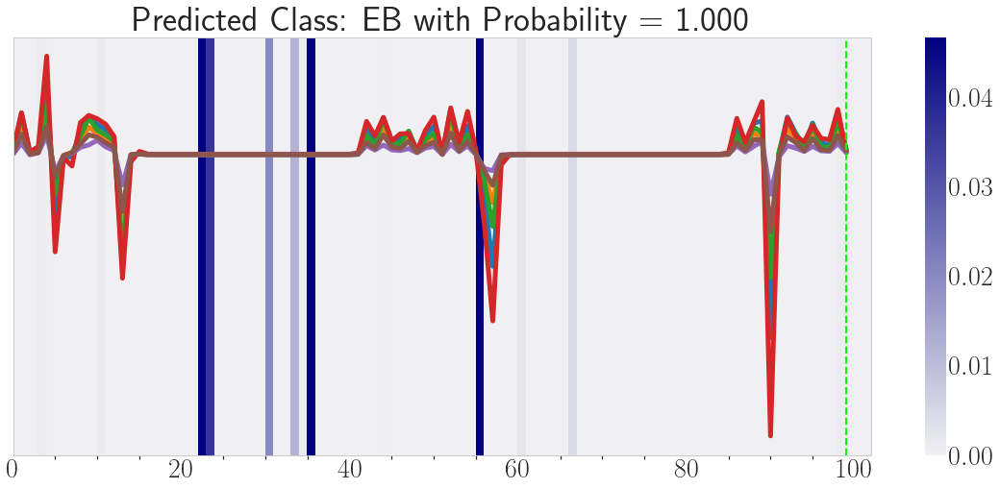

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9966774


<Figure size 1440x216 with 0 Axes>

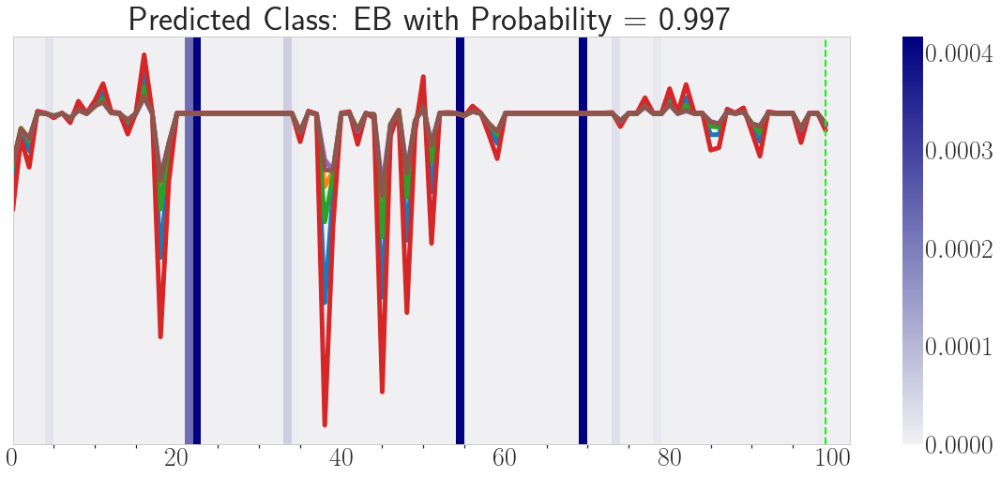

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.99989355


<Figure size 1440x216 with 0 Axes>

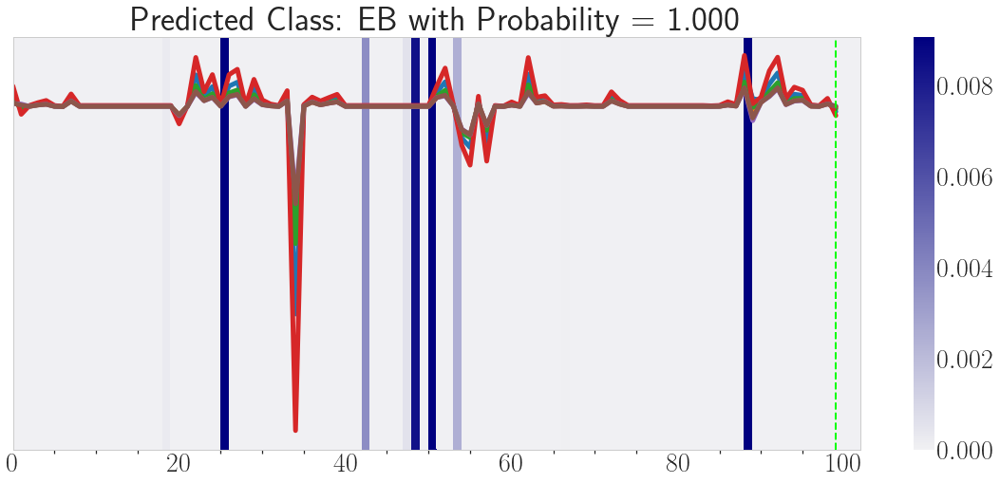

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.99989355


<Figure size 1440x216 with 0 Axes>

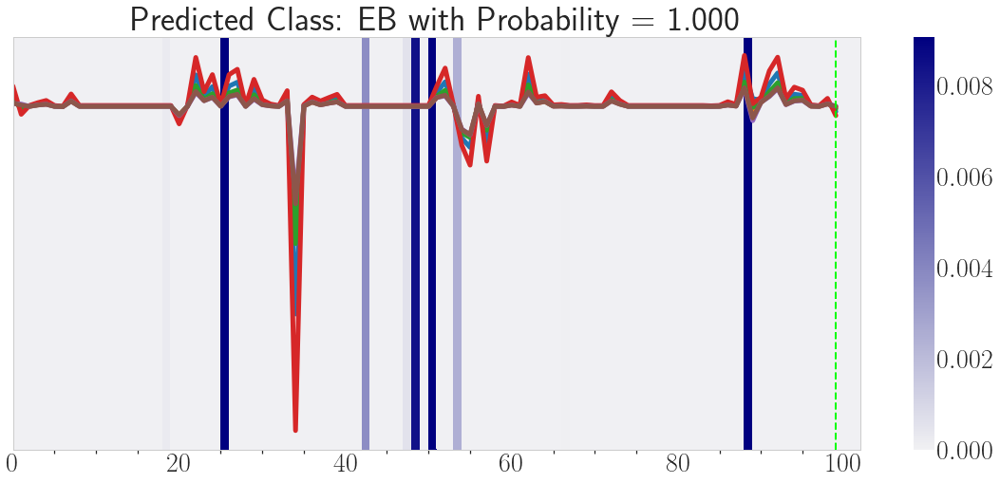

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.99999976


<Figure size 1440x216 with 0 Axes>

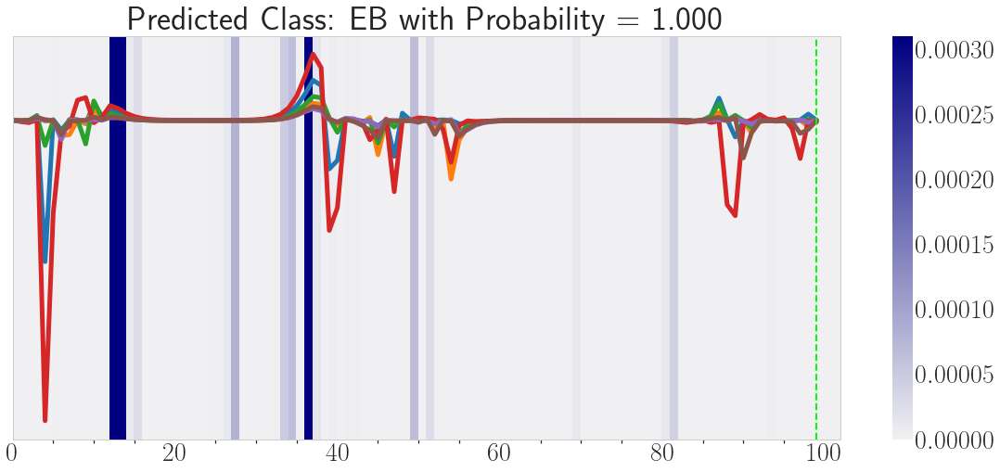

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9999018


<Figure size 1440x216 with 0 Axes>

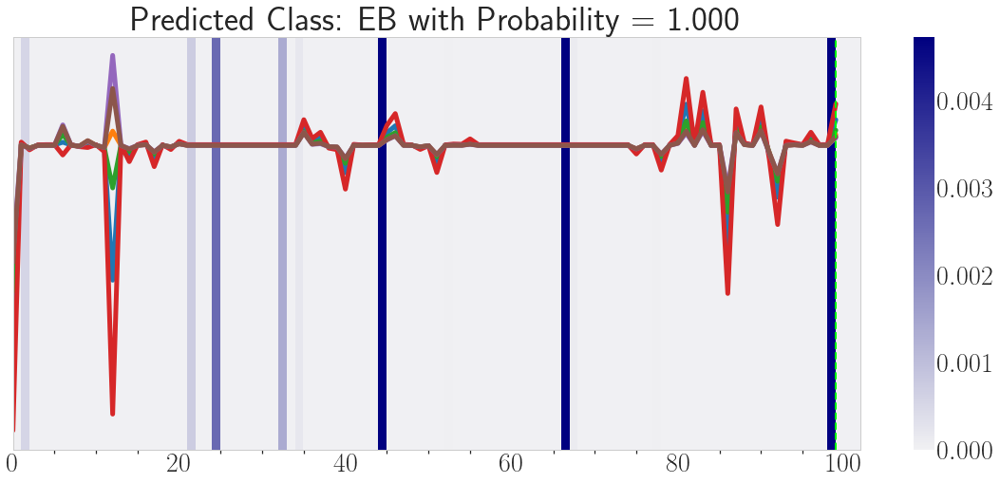

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9999968


<Figure size 1440x216 with 0 Axes>

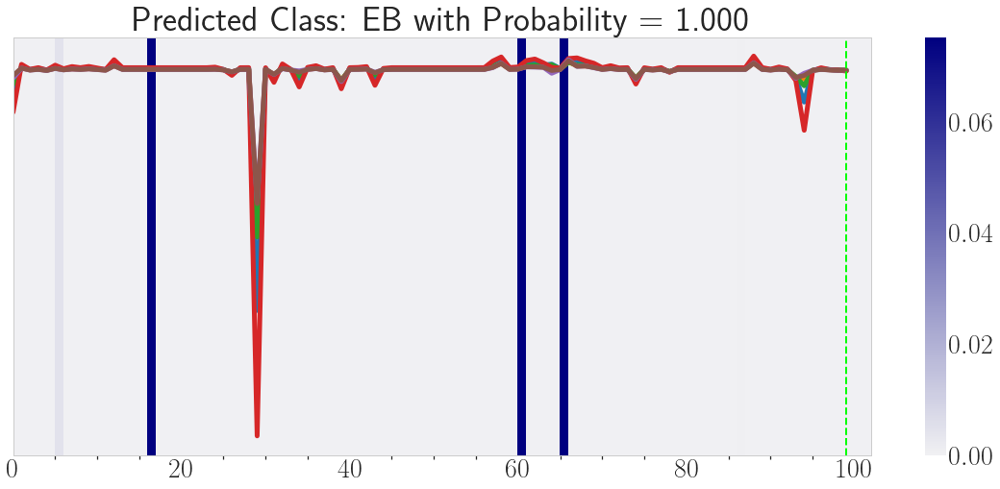

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9999794


<Figure size 1440x216 with 0 Axes>

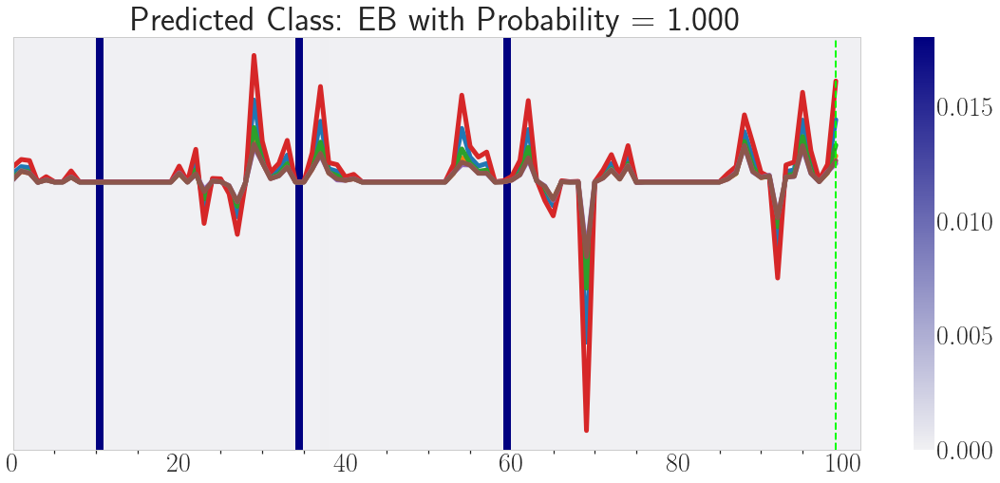

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.58342636
(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9979062


<Figure size 1440x216 with 0 Axes>

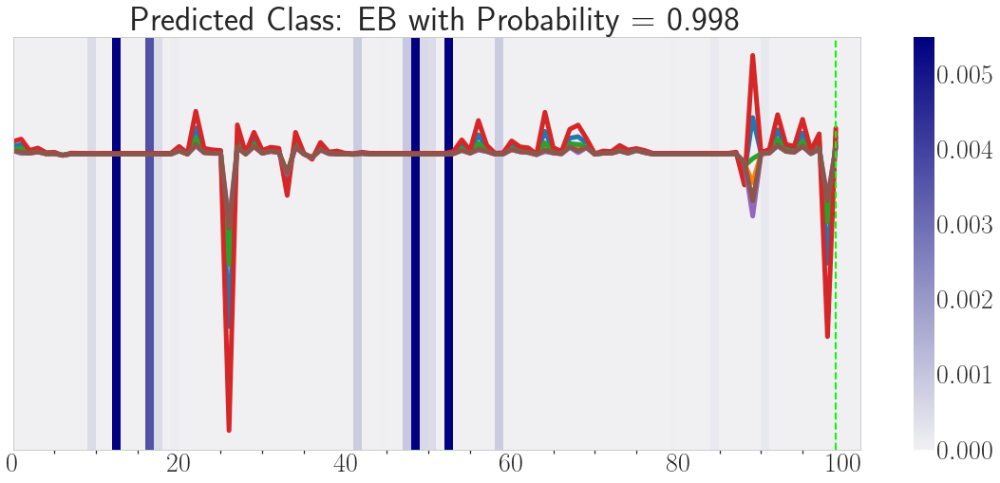

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9998914


<Figure size 1440x216 with 0 Axes>

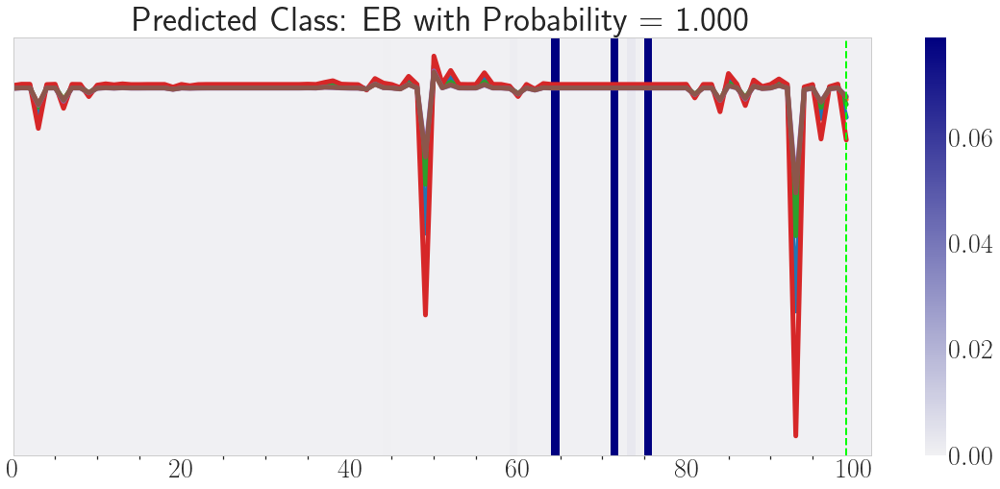

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9999881


<Figure size 1440x216 with 0 Axes>

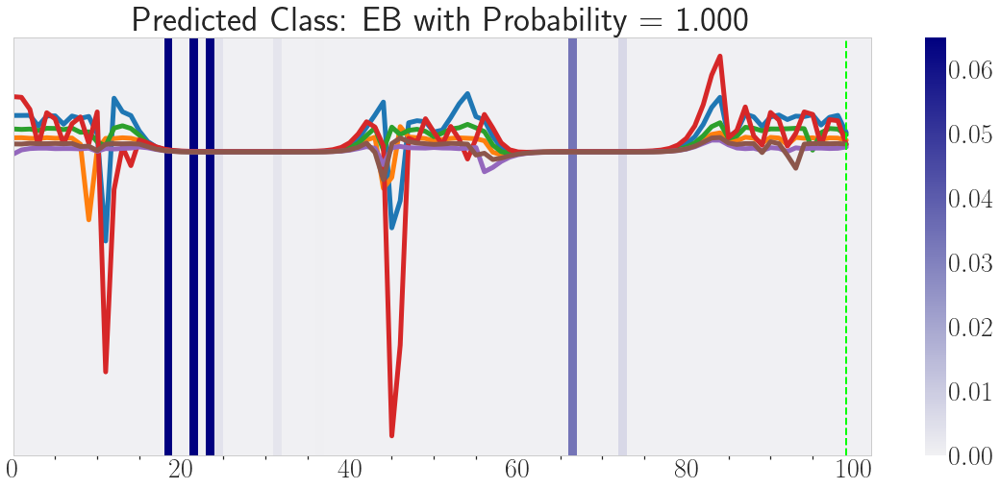

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9997471


<Figure size 1440x216 with 0 Axes>

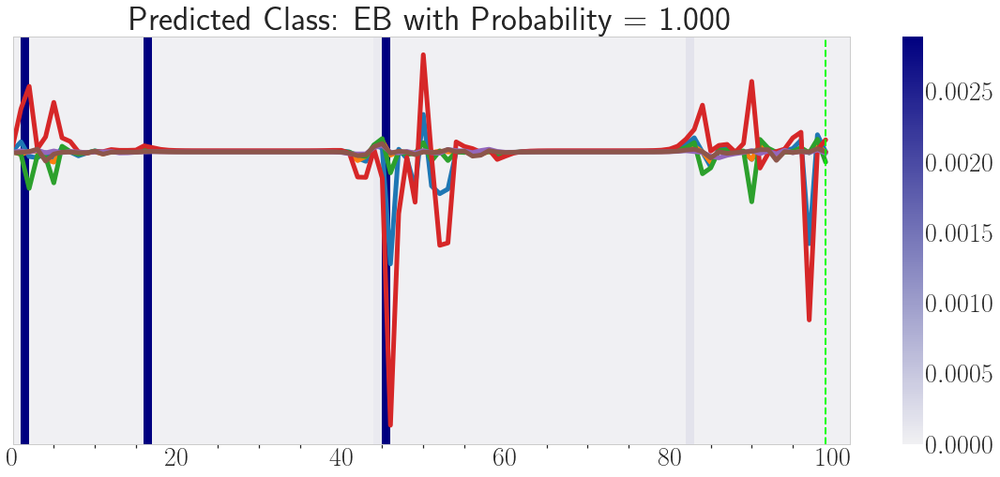

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.9999993


<Figure size 1440x216 with 0 Axes>

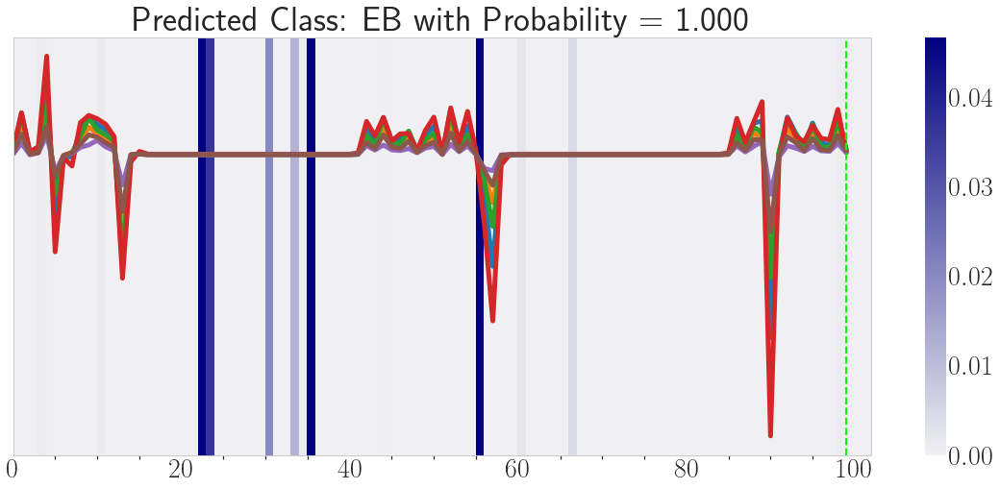

(102,)
(1, 102)
Predicted Class = 2, Probability = 1.0


<Figure size 1440x216 with 0 Axes>

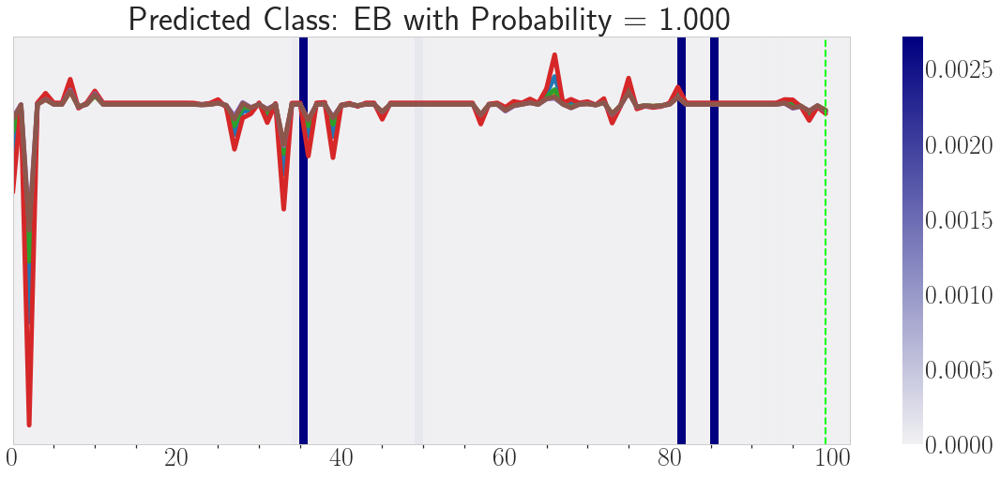

(102,)
(1, 102)
Predicted Class = 2, Probability = 0.43295085
(102,)
(1, 102)
Predicted Class = 2, Probability = 1.0


<Figure size 1440x216 with 0 Axes>

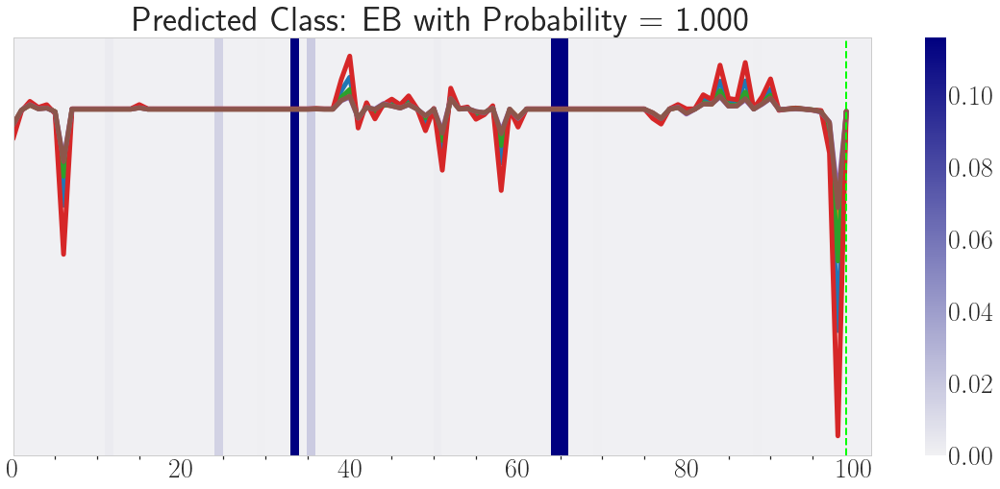

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5900038
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5335705
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.6090789
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.45124847
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.28943226
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.72000766
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.57514983
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.3584208
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.46665022
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.8762541
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.37478596
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.7092995
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.6595499
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.7035585
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.6818151
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.60864973
(102,)
(1, 102)
P

<Figure size 1440x216 with 0 Axes>

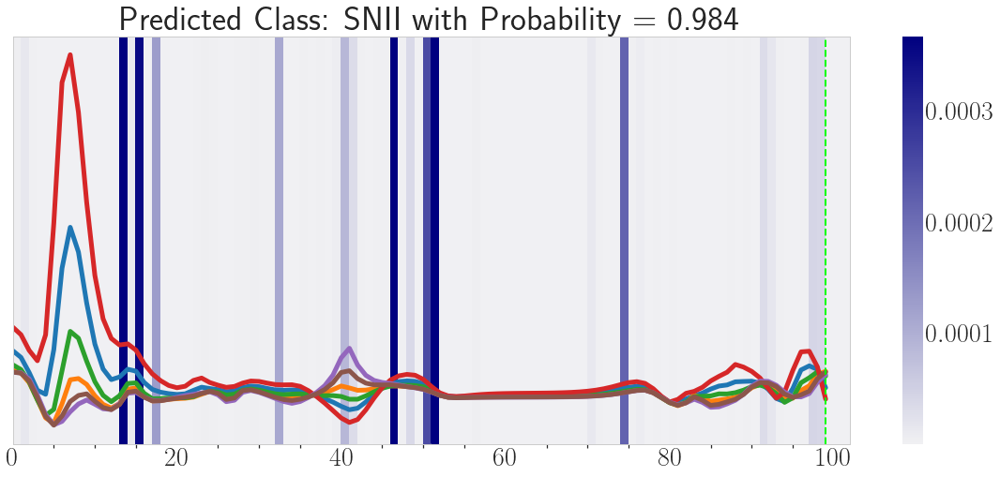

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.3378517
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.6027569
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5900038
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.78102225
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.37314925
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.90398747


<Figure size 1440x216 with 0 Axes>

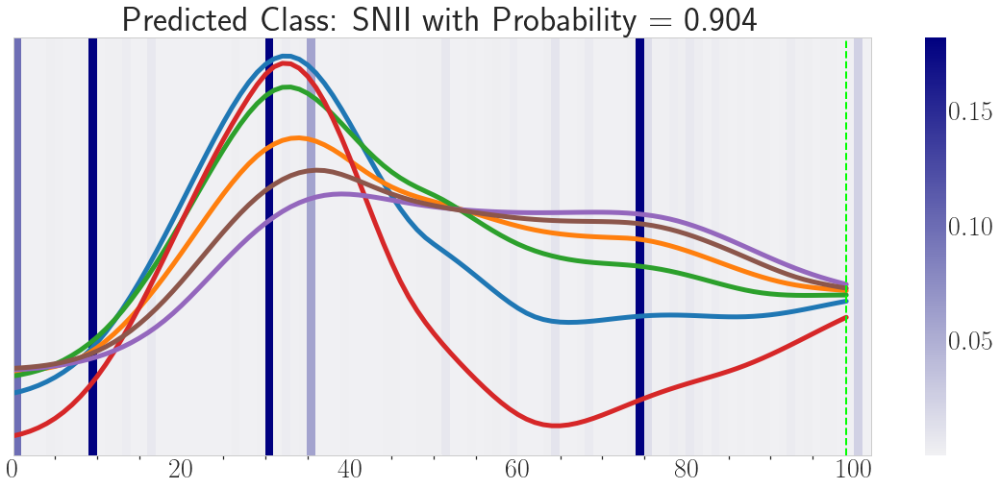

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5183835
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.83100903
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.99915016


<Figure size 1440x216 with 0 Axes>

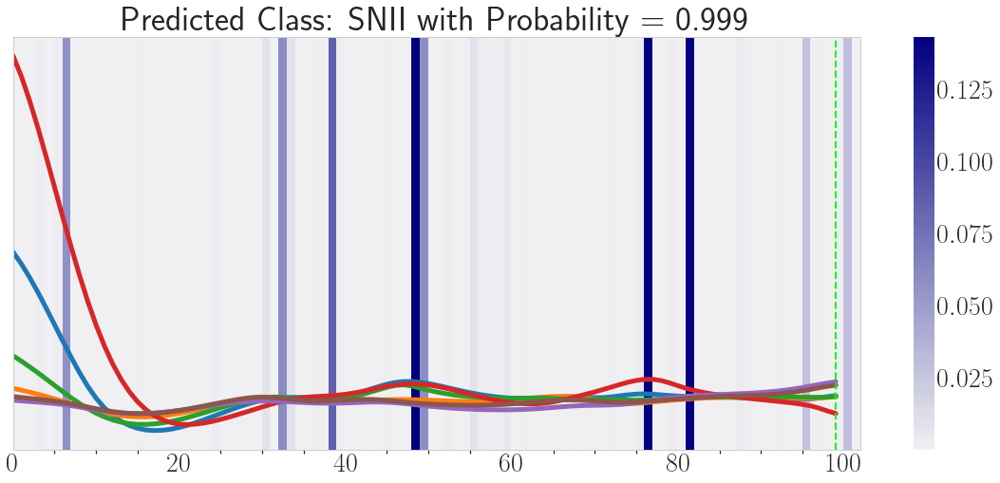

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.26914752
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.6270237
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5773797
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.41418147
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9957361


<Figure size 1440x216 with 0 Axes>

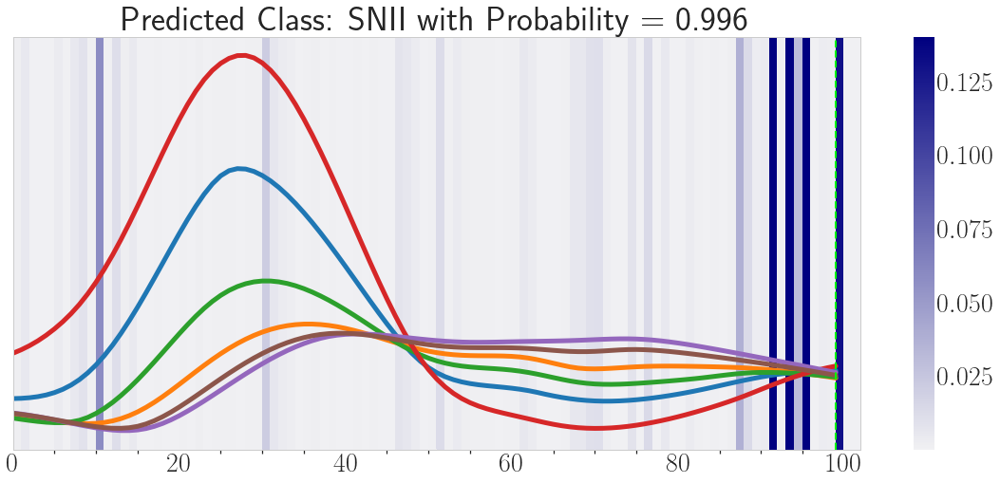

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.7789233
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9350662


<Figure size 1440x216 with 0 Axes>

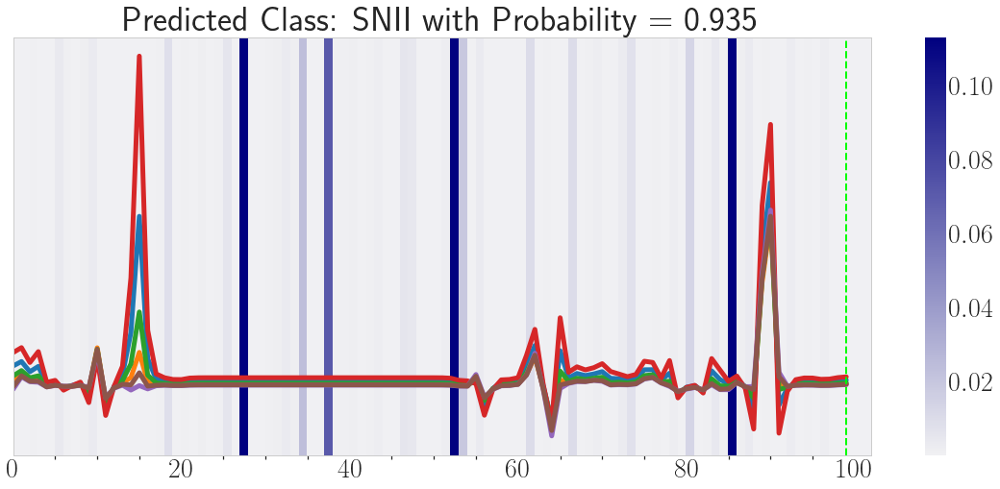

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9548053


<Figure size 1440x216 with 0 Axes>

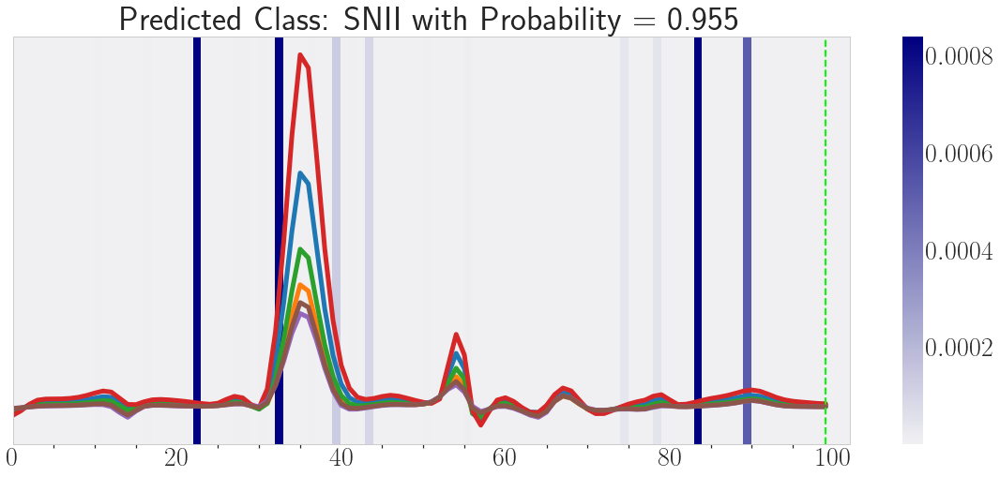

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9987723


<Figure size 1440x216 with 0 Axes>

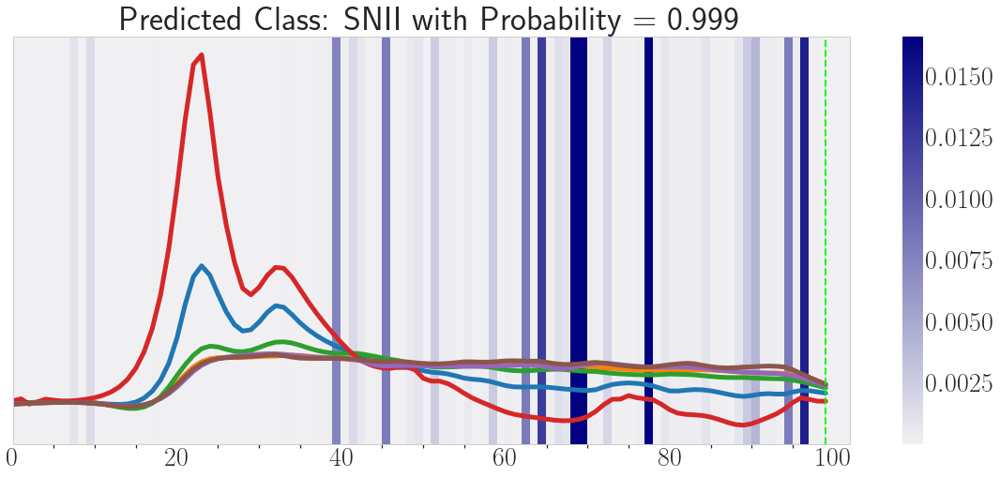

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.6818151
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.48230553
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.31184992
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.7168521
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.53776664
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9865942


<Figure size 1440x216 with 0 Axes>

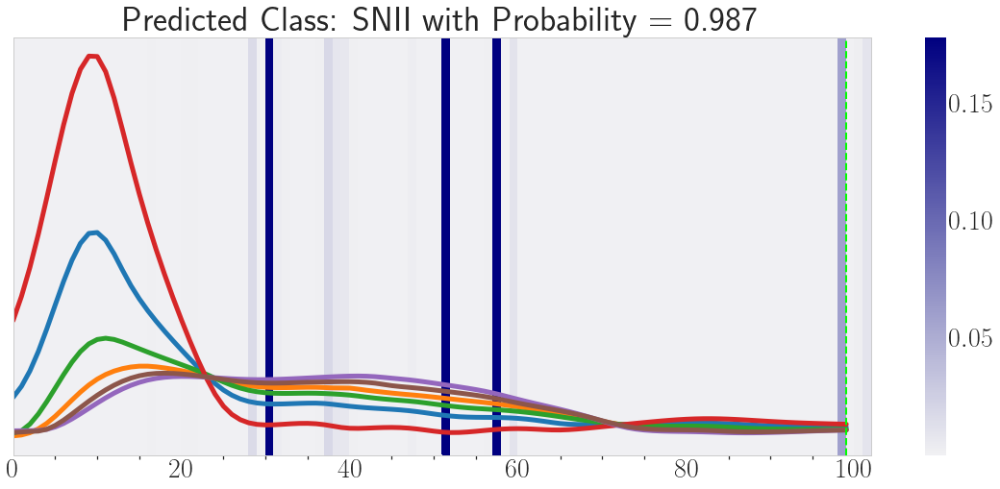

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.41833898
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.99713933


<Figure size 1440x216 with 0 Axes>

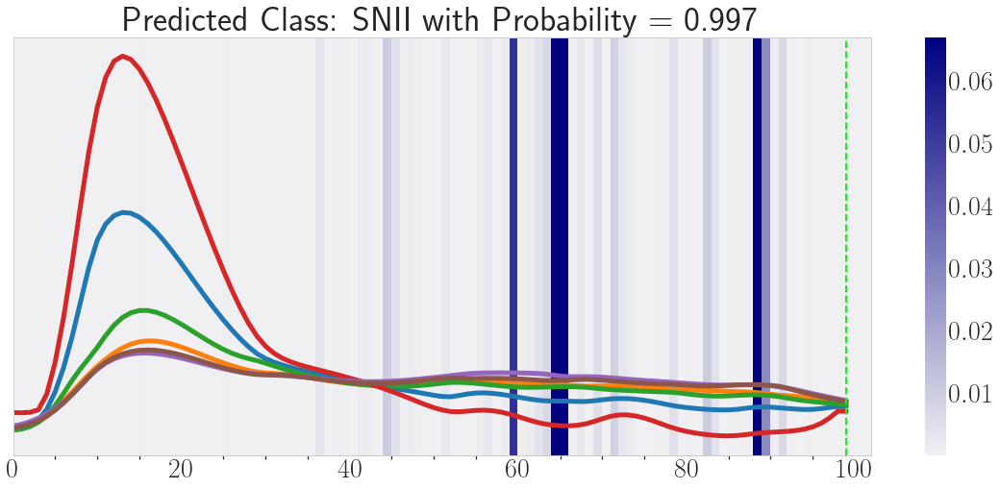

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.7375161
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.61207443
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.4720923
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.50190496
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9995028


<Figure size 1440x216 with 0 Axes>

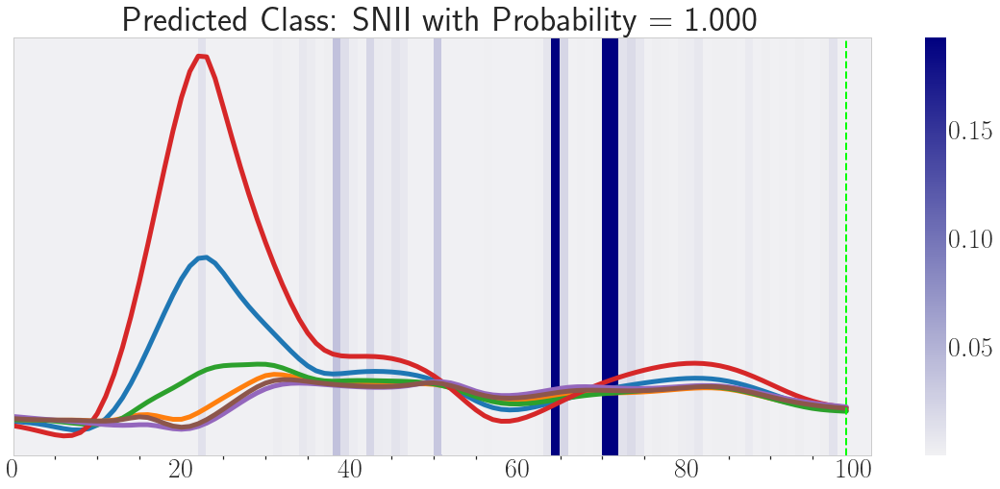

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5307345
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.7308262
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.42676097
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.3584208
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5704021
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9262055


<Figure size 1440x216 with 0 Axes>

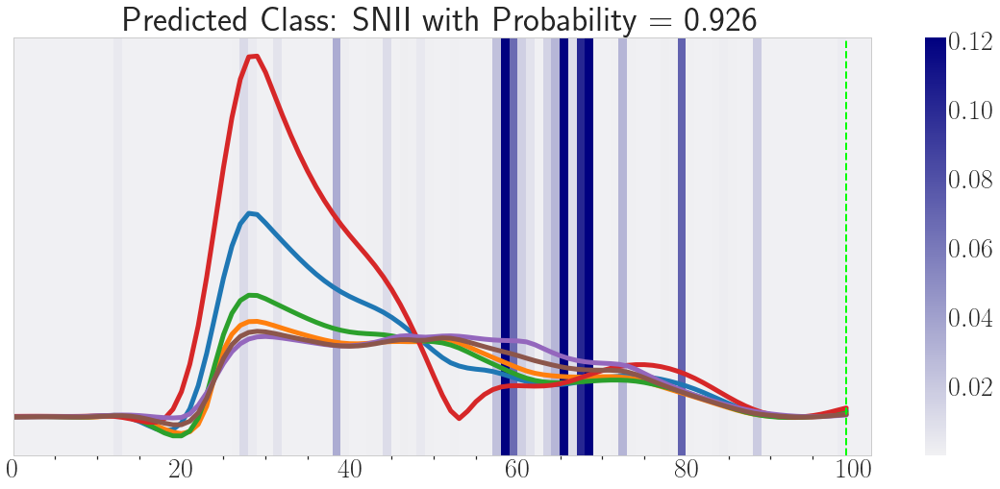

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9586479


<Figure size 1440x216 with 0 Axes>

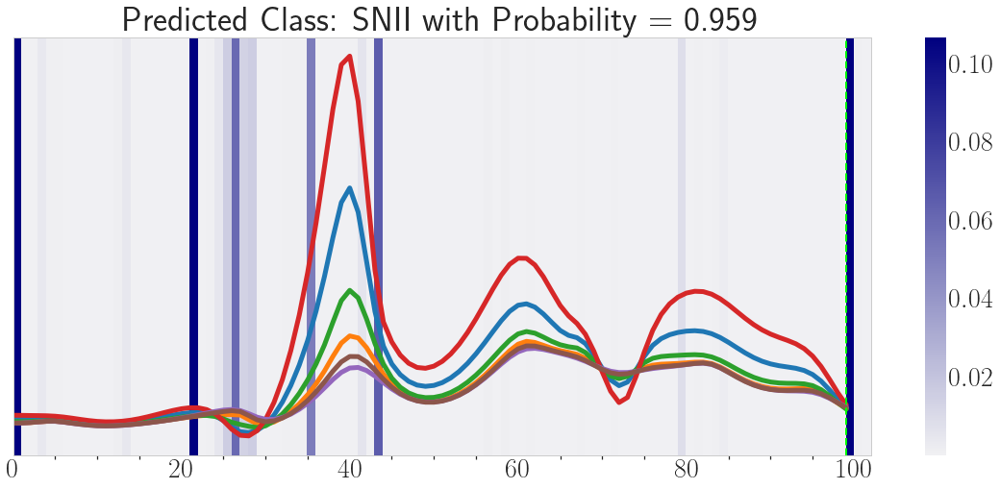

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.38216206
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9586479


<Figure size 1440x216 with 0 Axes>

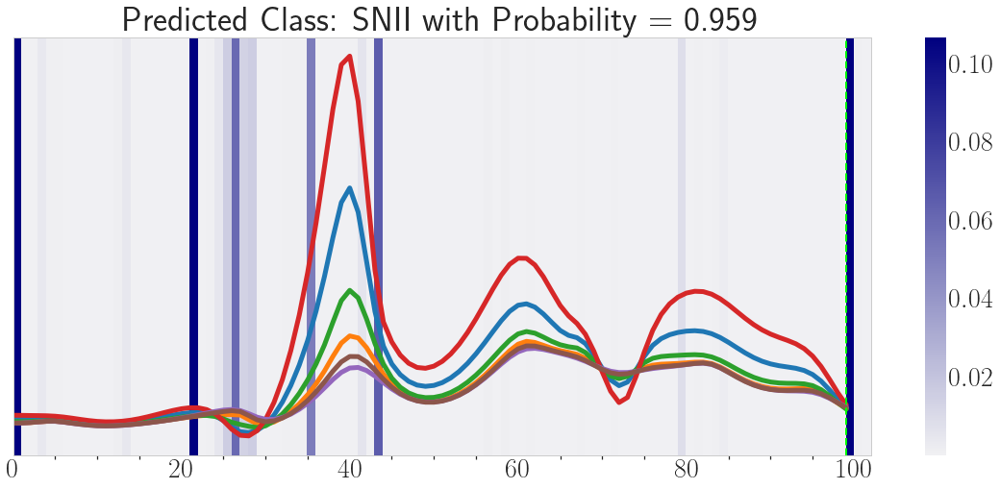

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9645328


<Figure size 1440x216 with 0 Axes>

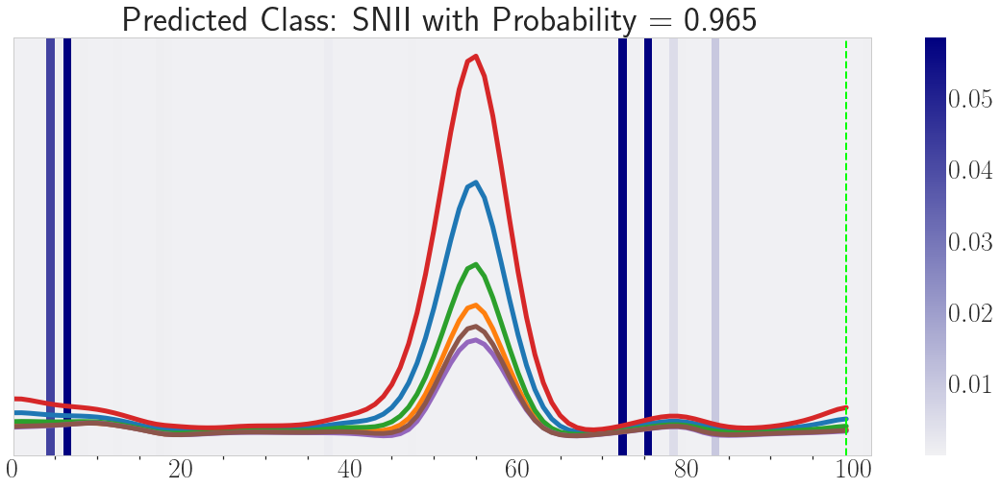

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5900038
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.967224


<Figure size 1440x216 with 0 Axes>

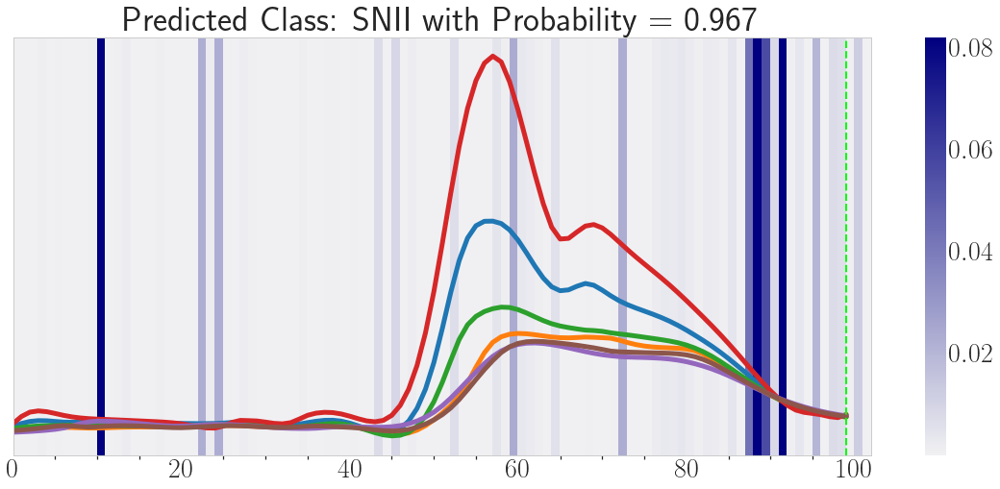

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.67675227
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5900038
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.36218145
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9786781


<Figure size 1440x216 with 0 Axes>

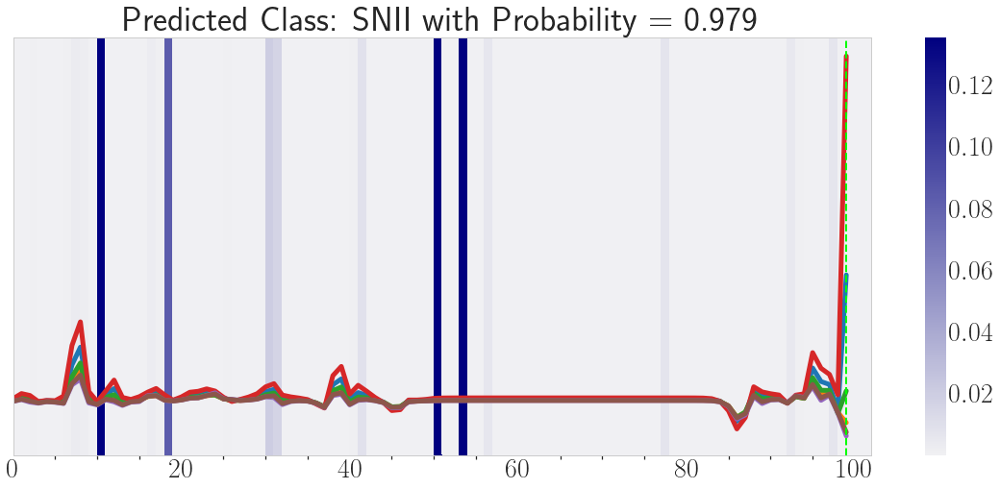

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.63084495
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.3669944
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.4375695
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.42538157
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.4953204
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.28427413
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.89386314
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.97598433


<Figure size 1440x216 with 0 Axes>

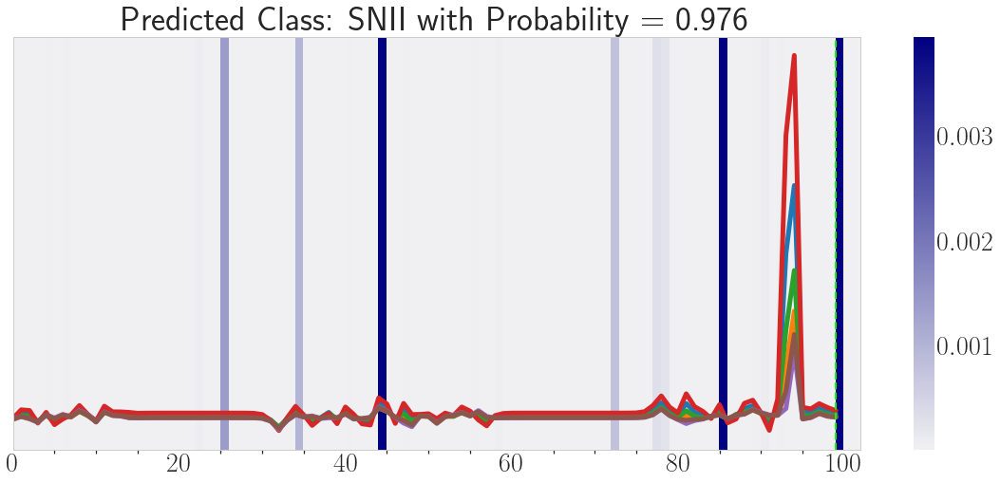

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.4825382
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.95002836


<Figure size 1440x216 with 0 Axes>

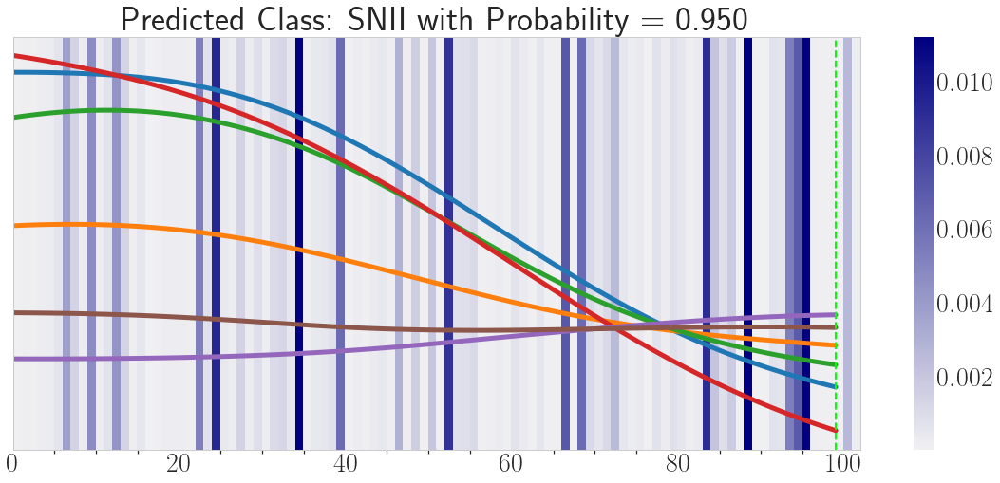

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.6036263
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.6728847
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9972415


<Figure size 1440x216 with 0 Axes>

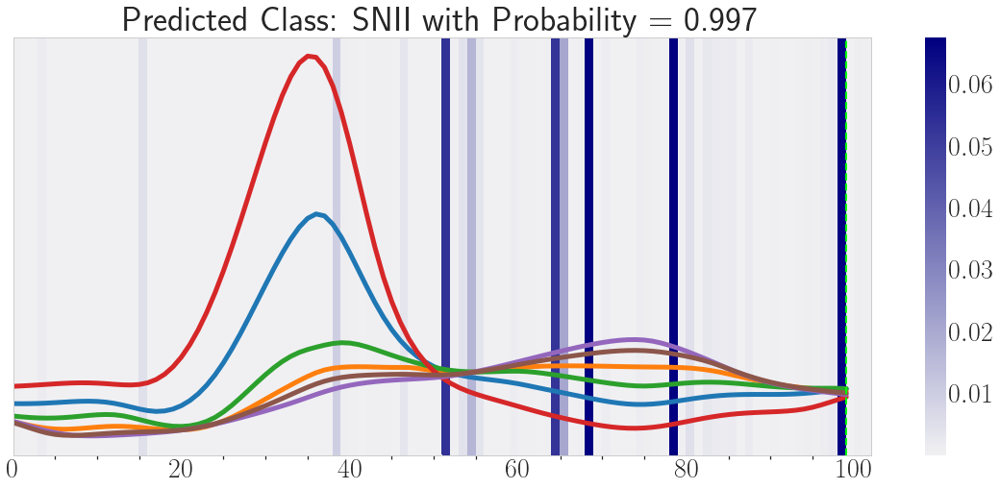

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.8901334
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.7807272
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.87368435
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.44640186
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.63084495
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5433235
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.73446757
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9987723


<Figure size 1440x216 with 0 Axes>

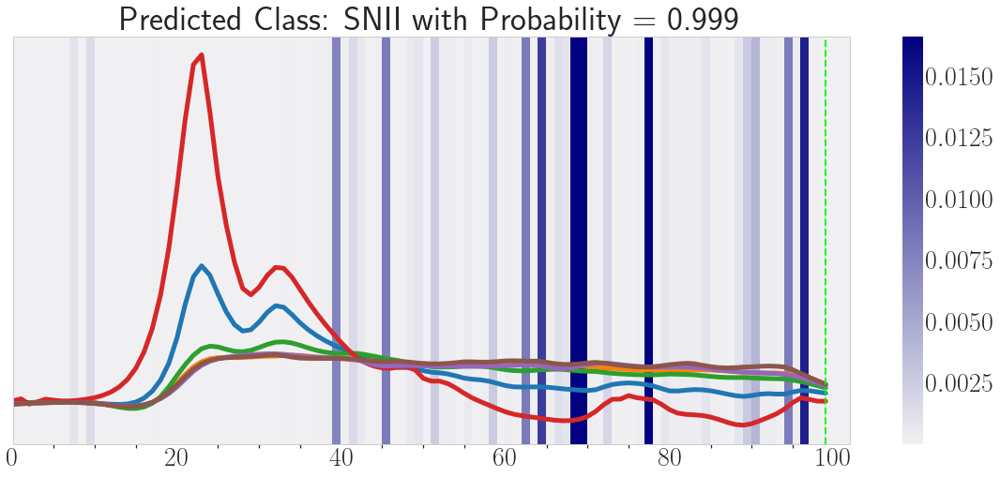

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.58390206
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.7577307
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.42706847
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.3356984
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.64779645
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.4720923
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.32330558
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.32330558
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.4825382
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.76489514
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.41833898
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.7375161
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.49612474
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.52762735
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9829007


<Figure size 1440x216 with 0 Axes>

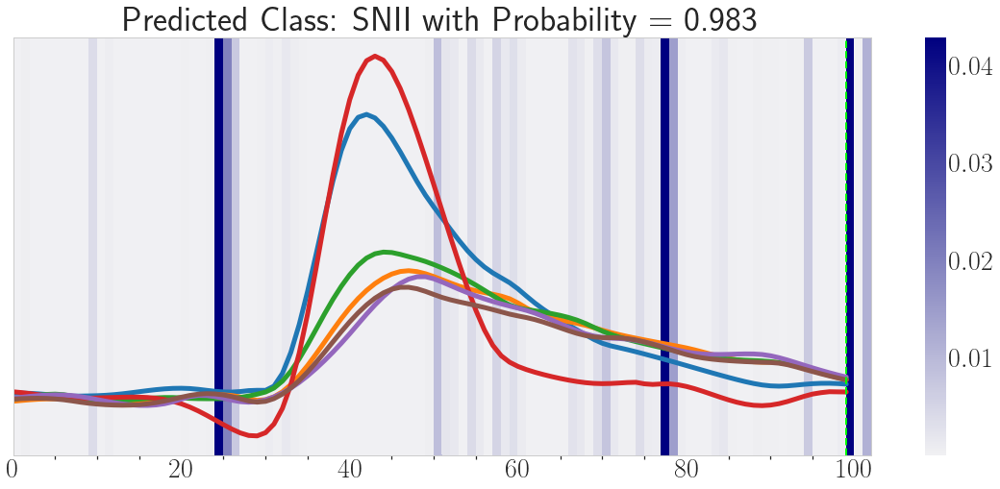

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.4298281
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.42564106
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9091013


<Figure size 1440x216 with 0 Axes>

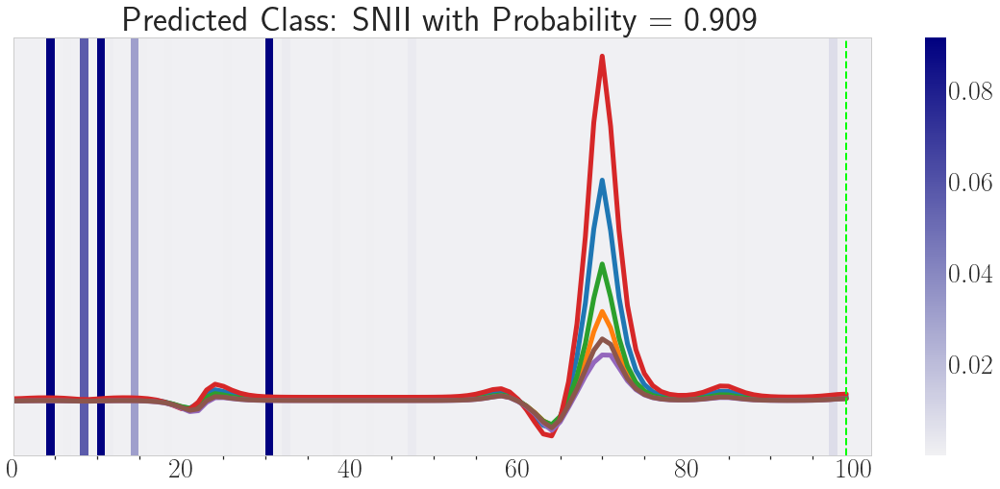

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.7378007
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.43920252
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.8722133
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.4095914
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.55363756
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.87368435
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.45124847
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.34994096
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.3859568
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.50036025
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9400715


<Figure size 1440x216 with 0 Axes>

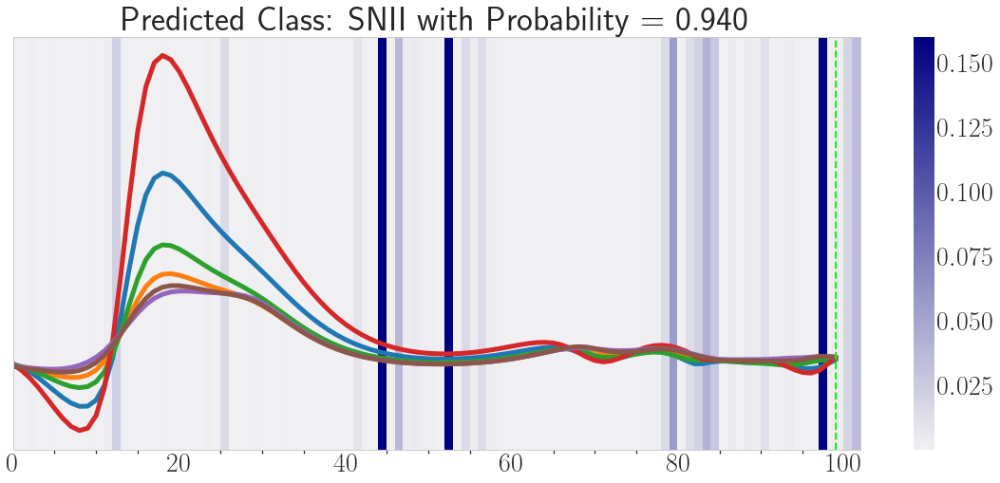

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5019687
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.41028303
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5283127
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.7628403
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.27922022
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.41237864
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5402921
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.43920252
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.3378517
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.72737575
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9838955


<Figure size 1440x216 with 0 Axes>

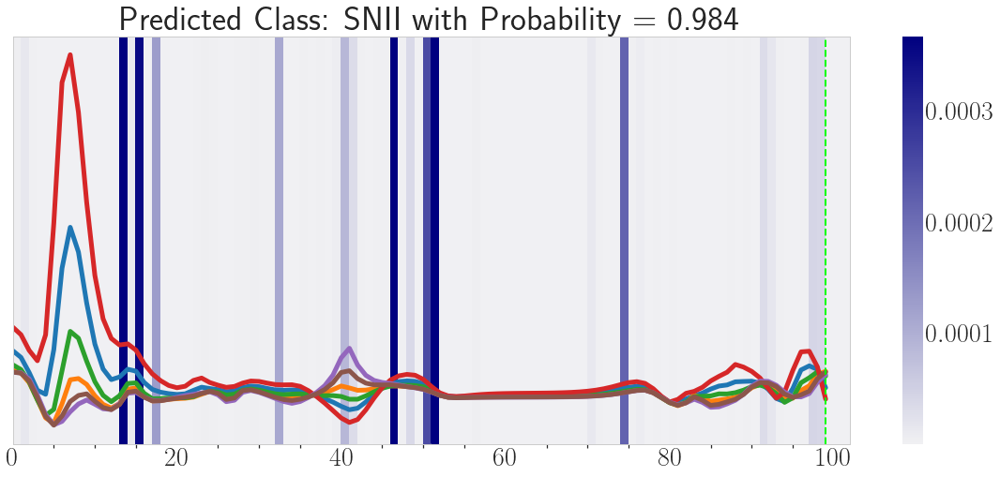

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5905381
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.37466785
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.63743466
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.96627206


<Figure size 1440x216 with 0 Axes>

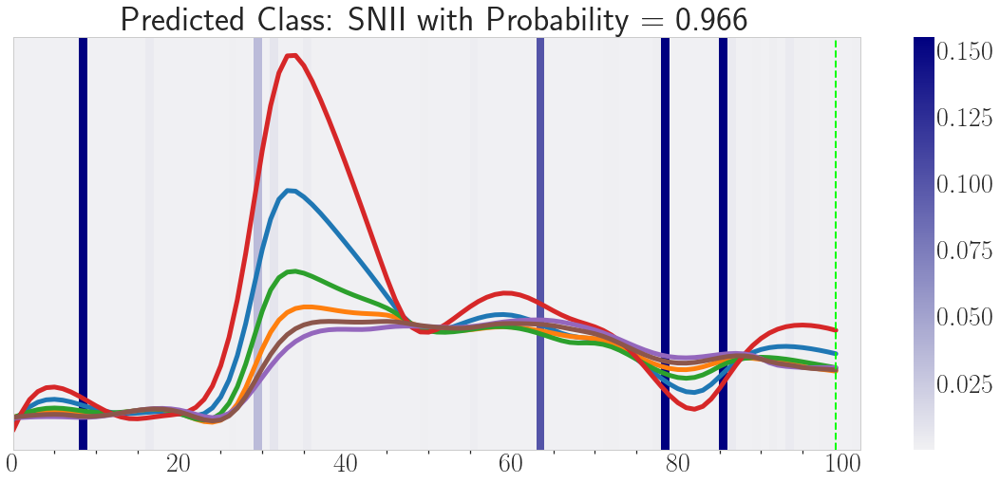

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.93649846


<Figure size 1440x216 with 0 Axes>

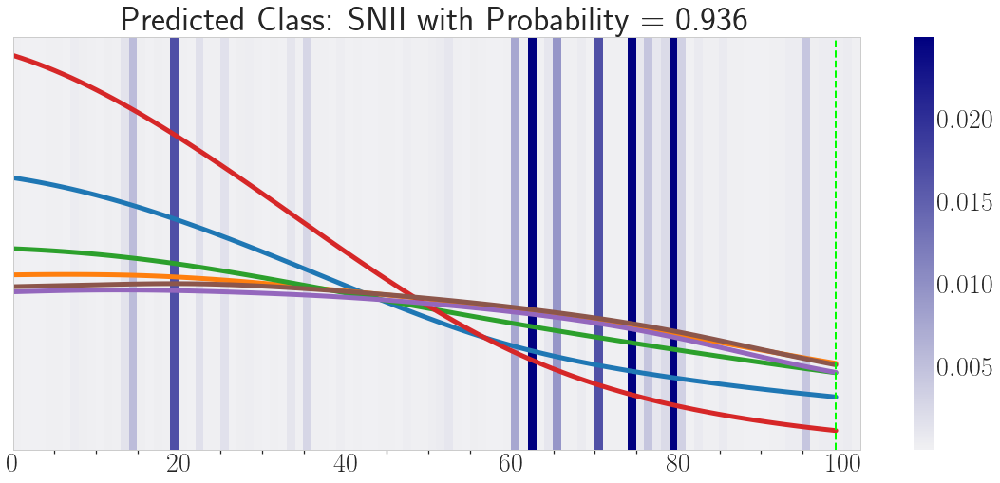

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.41297302
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.3763703
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9243899


<Figure size 1440x216 with 0 Axes>

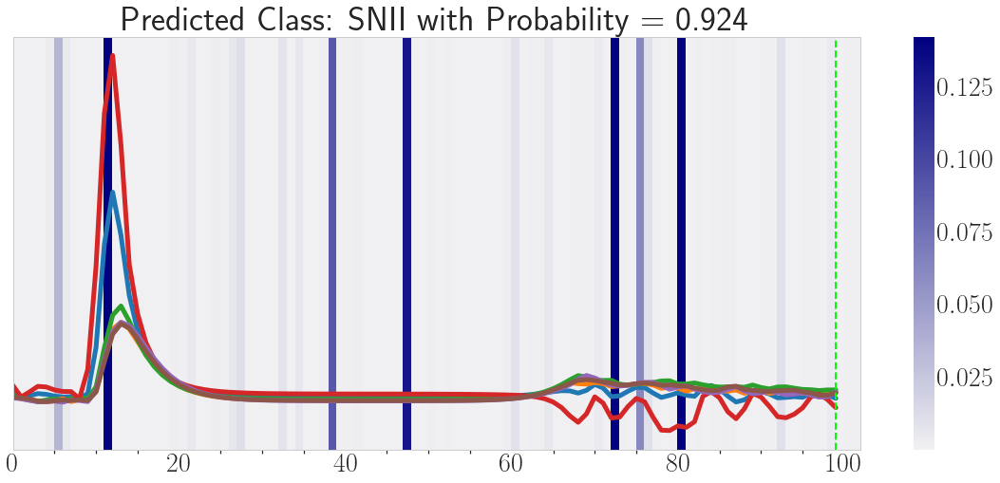

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.61954814
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.74182045
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.57514983
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.3312078
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.6270237
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.77258384
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5456827
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.29703915
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.76354986
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.37091804
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9987723


<Figure size 1440x216 with 0 Axes>

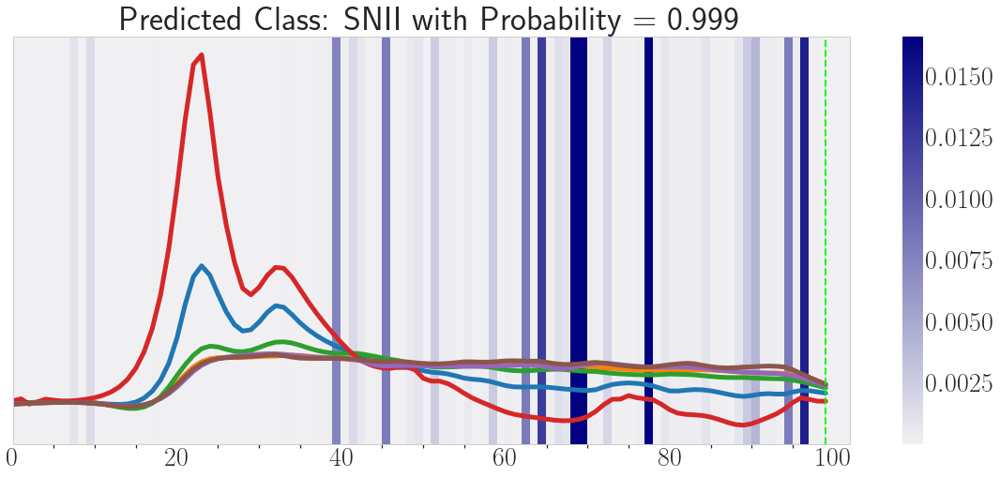

(102,)
(1, 102)
Predicted Class = 3, Probability = 0.44640186
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.80402267
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.5773797
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.7308262
(102,)
(1, 102)
Predicted Class = 3, Probability = 0.9786781


<Figure size 1440x216 with 0 Axes>

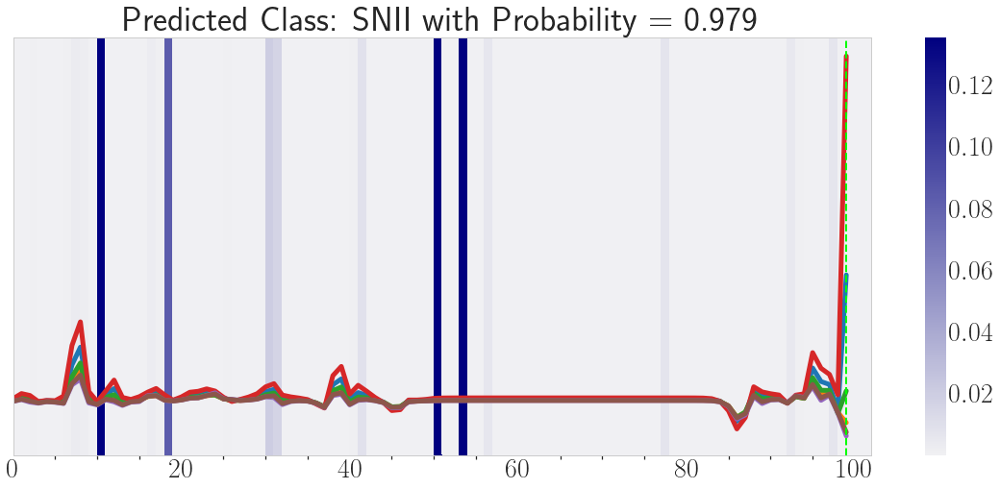

(102,)
(1, 102)
Predicted Class = 4, Probability = 0.3665191
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.5579191
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.26255205
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.55012304
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.6244446
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.33415037
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.44288683
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.8031237
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.5970856
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.48889062
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.5970856
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.3987718
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.37024114
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.33415037
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.48176157
(102,)
(1, 102)
Predicted Class = 4, Probability = 0.68716675
(102,)
(1, 102)

<Figure size 1440x216 with 0 Axes>

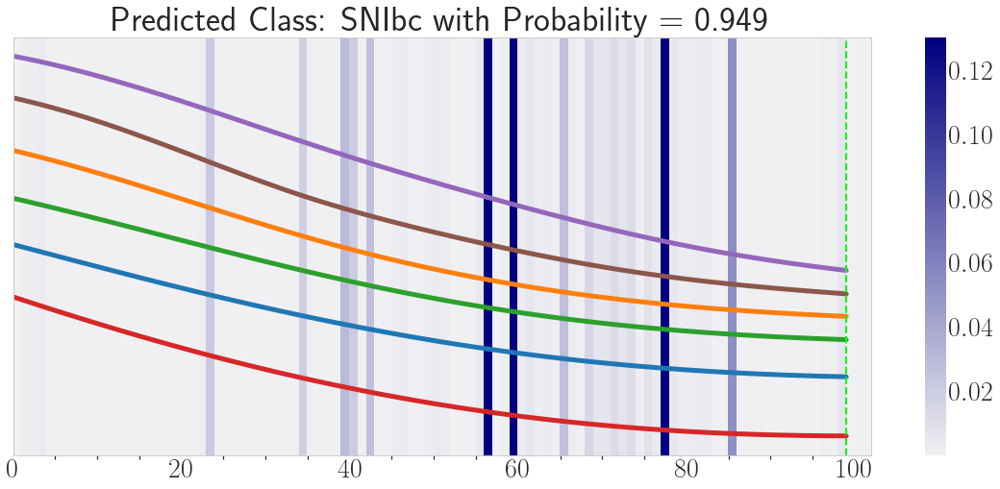

(102,)
(1, 102)
Predicted Class = 6, Probability = 0.68216854
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.35083678
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.40109438
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.5411293
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.8094443
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.47447893
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.48401338
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.8835774
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.48401338
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.44512057
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.49655473
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.7611158
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.8099849
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.57992744
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.38911644
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.28848776
(102,)
(1, 10

<Figure size 1440x216 with 0 Axes>

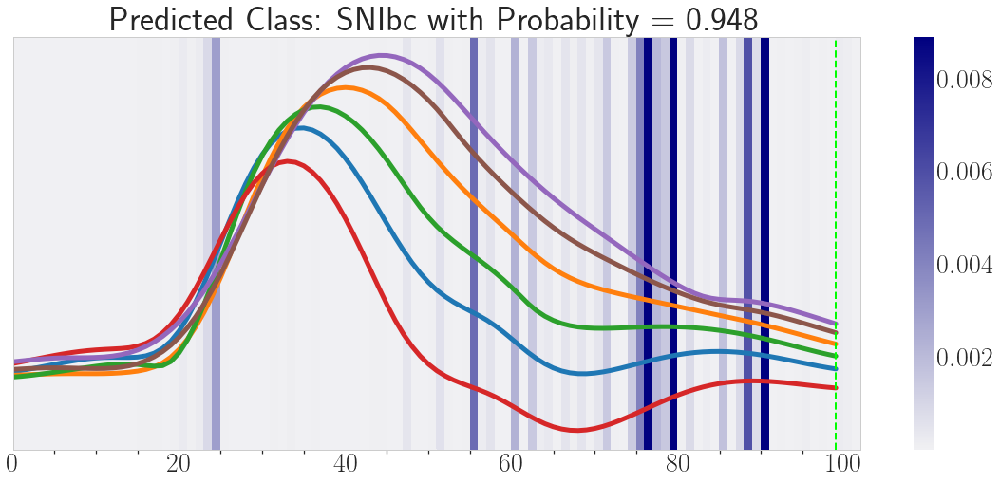

(102,)
(1, 102)
Predicted Class = 6, Probability = 0.58760625
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.3864933
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.67604953
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.42173496
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.5801882
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.74614745
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.54332227
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.58194584
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.54332227
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.93129116


<Figure size 1440x216 with 0 Axes>

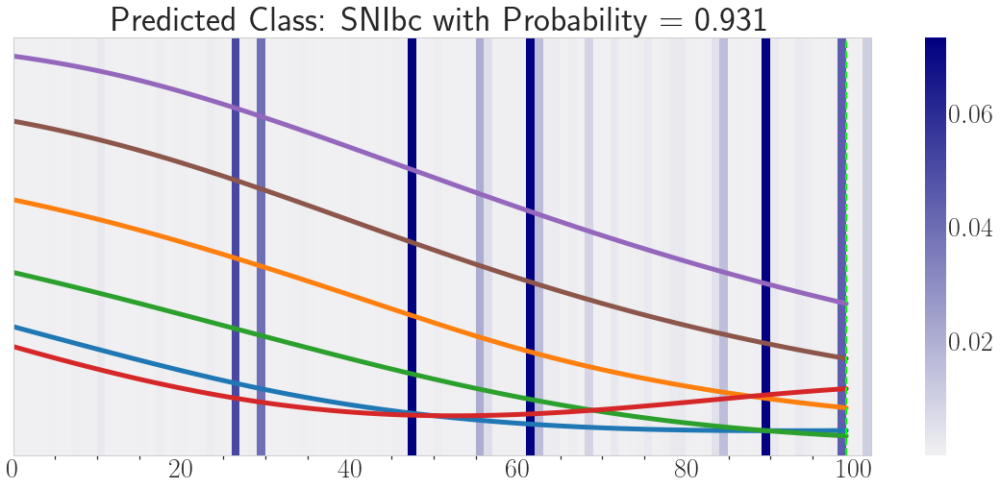

(102,)
(1, 102)
Predicted Class = 6, Probability = 0.5411293
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.39791724
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.26250616
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.40318906
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.8698726
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.66369635
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.4171639
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.4147843
(102,)
(1, 102)
Predicted Class = 6, Probability = 0.426968
(102,)
(1, 102)
Predicted Class = 8, Probability = 0.83912873
(102,)
(1, 102)
Predicted Class = 8, Probability = 0.5582004
(102,)
(1, 102)
Predicted Class = 8, Probability = 0.90286976


<Figure size 1440x216 with 0 Axes>

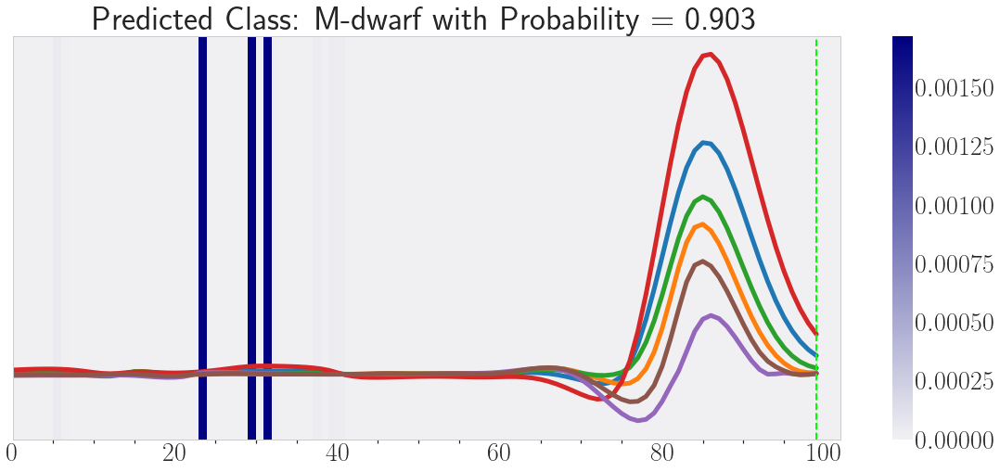

(102,)
(1, 102)
Predicted Class = 8, Probability = 0.8363081
(102,)
(1, 102)
Predicted Class = 8, Probability = 0.6275933
(102,)
(1, 102)
Predicted Class = 8, Probability = 0.68707746
(102,)
(1, 102)
Predicted Class = 8, Probability = 0.94389987


<Figure size 1440x216 with 0 Axes>

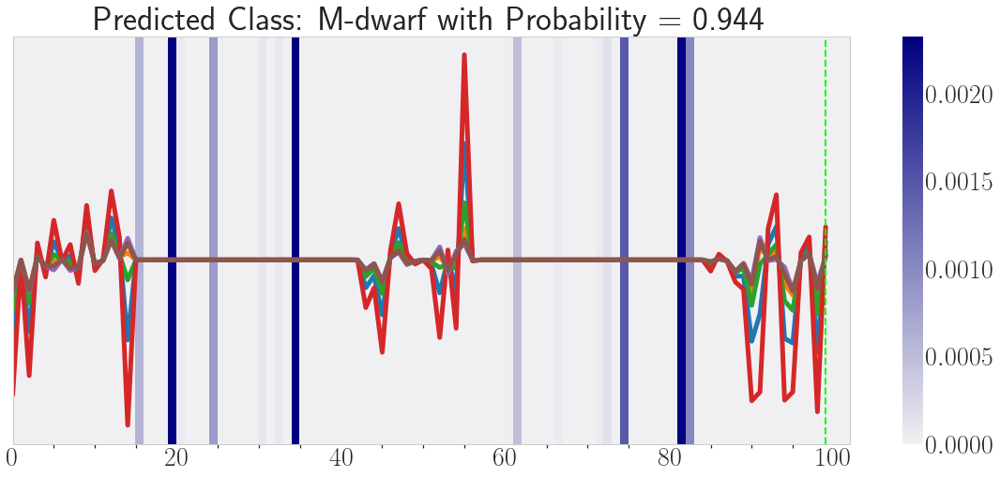

(102,)
(1, 102)
Predicted Class = 8, Probability = 0.9965648


<Figure size 1440x216 with 0 Axes>

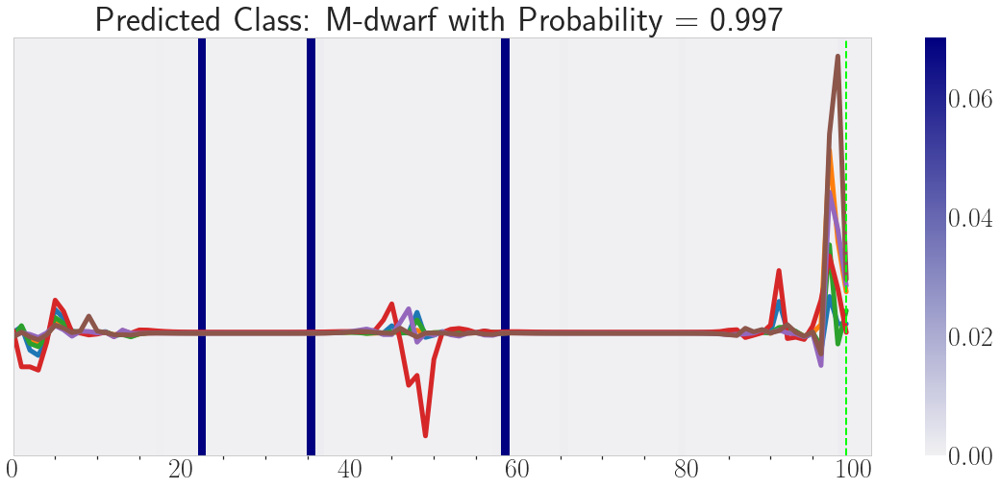

(102,)
(1, 102)
Predicted Class = 8, Probability = 0.99223936


<Figure size 1440x216 with 0 Axes>

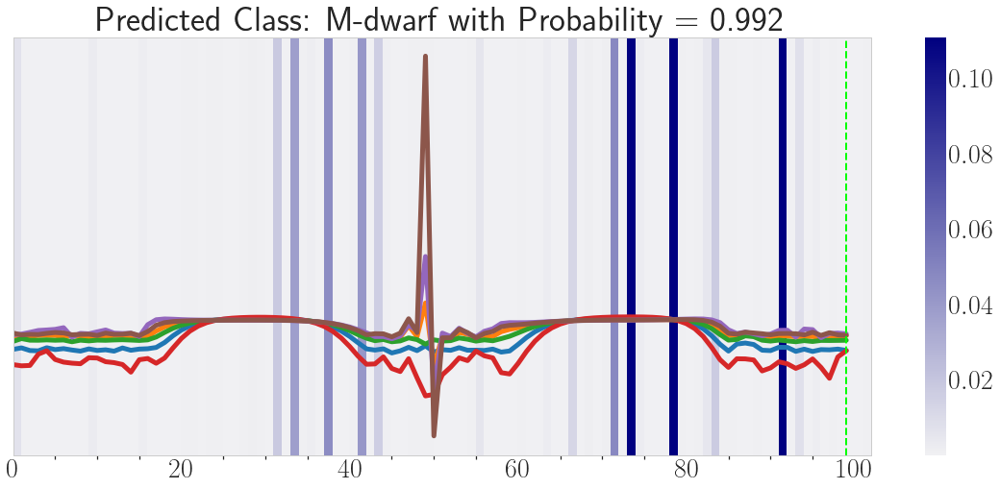

(102,)
(1, 102)
Predicted Class = 8, Probability = 0.8010983
(102,)
(1, 102)
Predicted Class = 8, Probability = 0.5940078
(102,)
(1, 102)
Predicted Class = 8, Probability = 0.6275933
(102,)
(1, 102)
Predicted Class = 8, Probability = 0.9999105


<Figure size 1440x216 with 0 Axes>

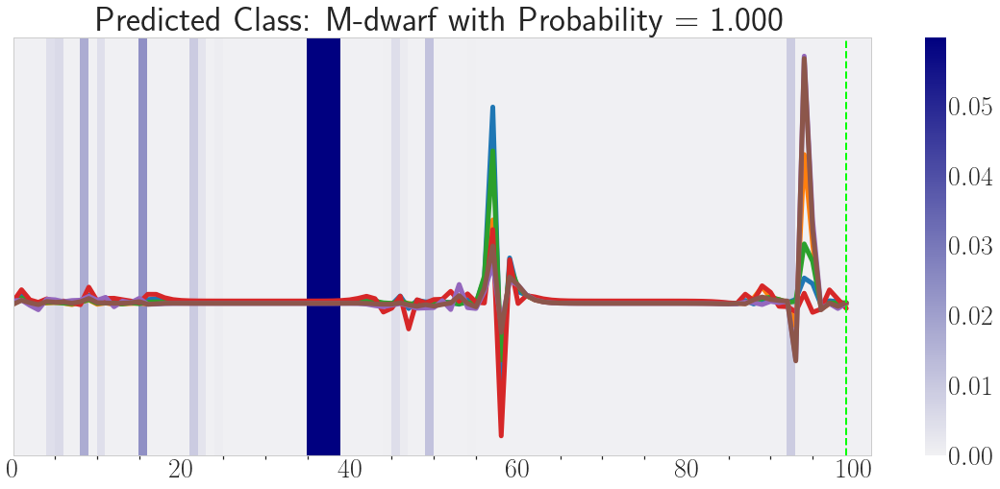

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.6617595
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.36184302
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.48090276
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.48315313
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.9598311


<Figure size 1440x216 with 0 Axes>

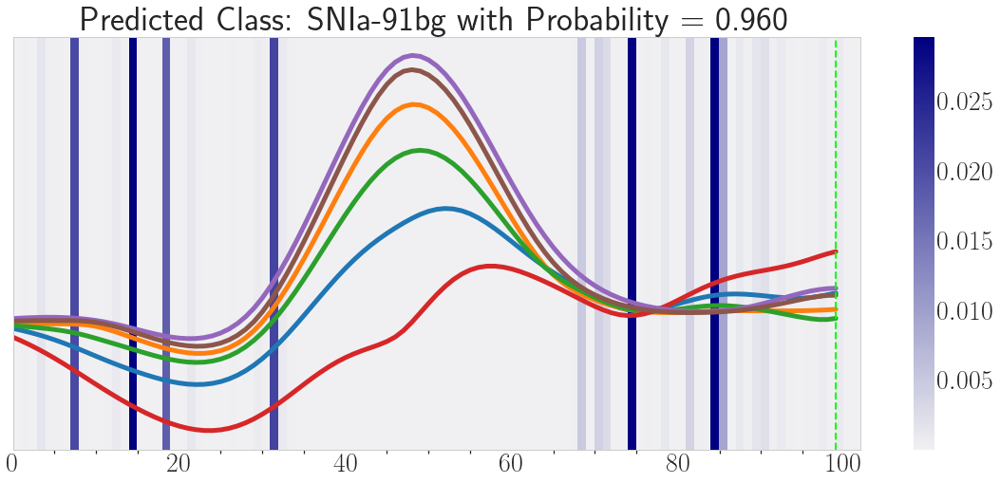

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.57634956
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.48708057
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.52878255
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.3597576
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.24612357
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.52677363
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.36184302
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.7561945
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.96958244


<Figure size 1440x216 with 0 Axes>

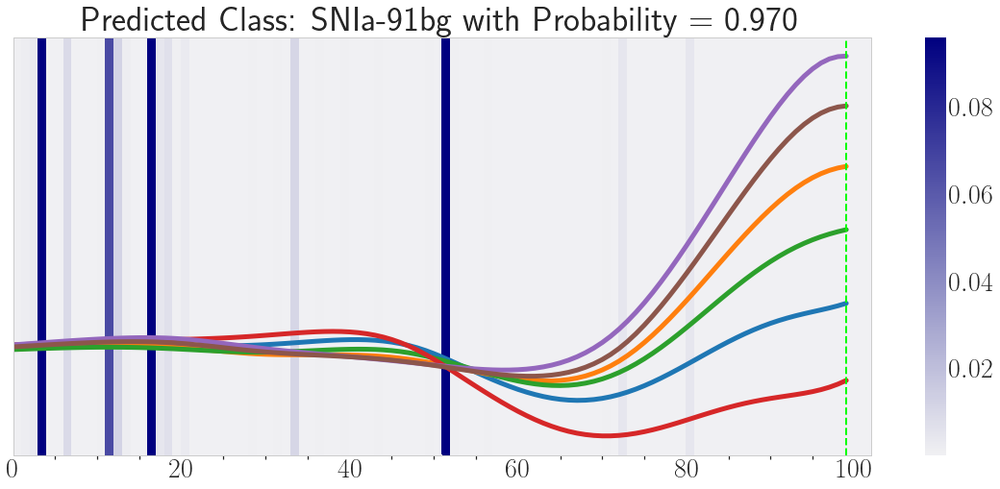

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.36184302
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.9909841


<Figure size 1440x216 with 0 Axes>

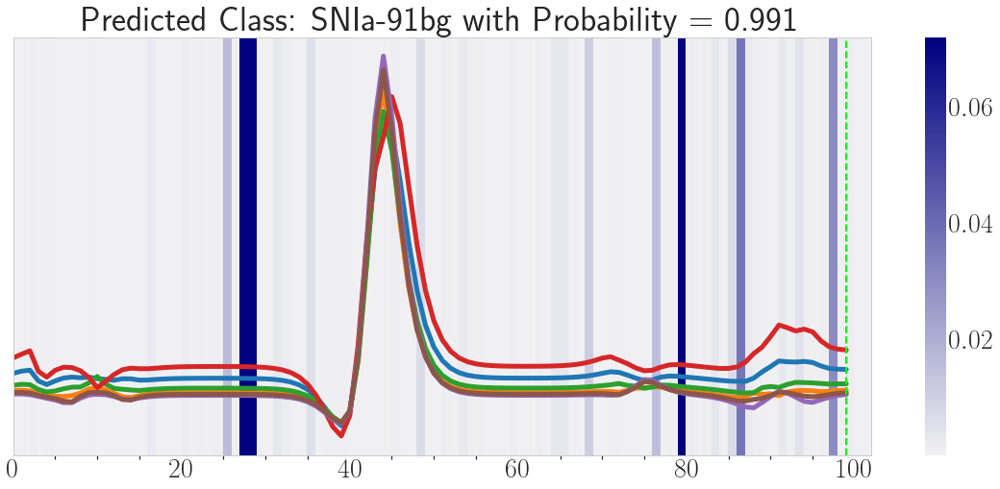

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.5448855
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.73258656
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.9987764


<Figure size 1440x216 with 0 Axes>

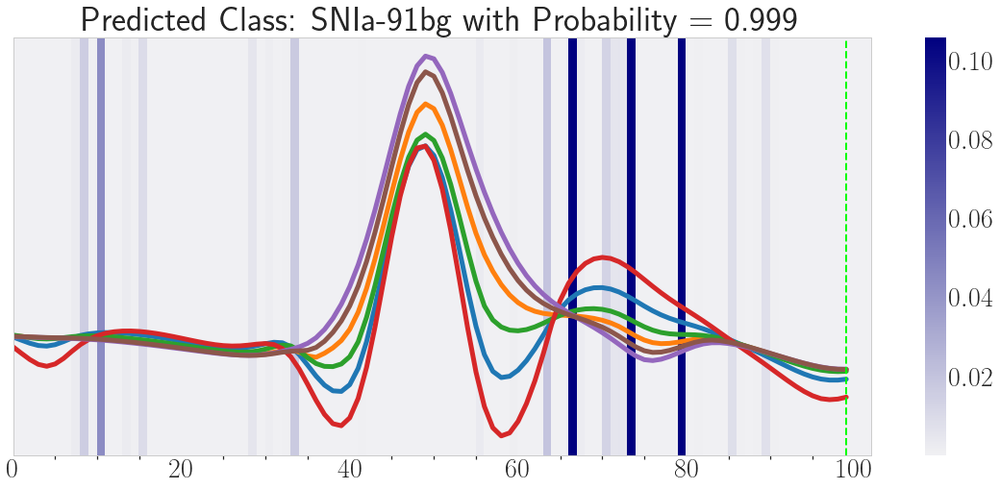

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.8039283
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.9779196


<Figure size 1440x216 with 0 Axes>

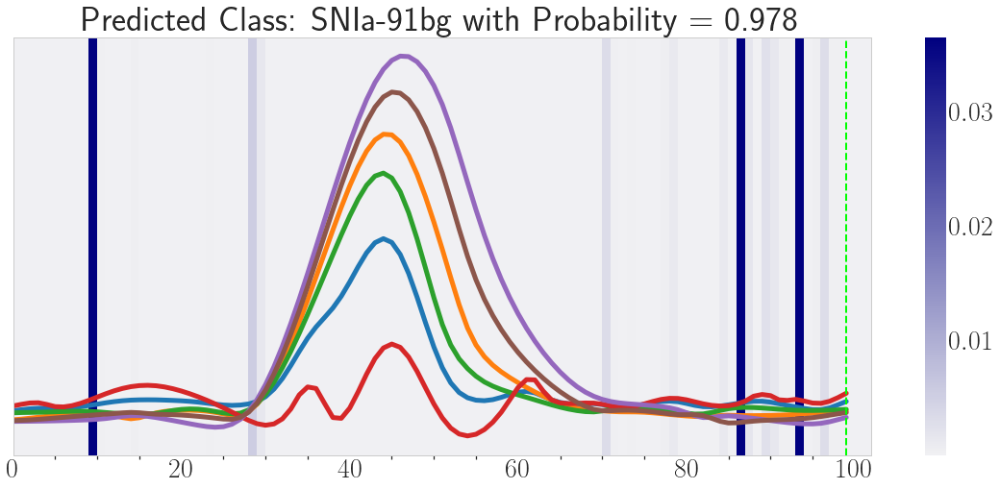

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.99732566


<Figure size 1440x216 with 0 Axes>

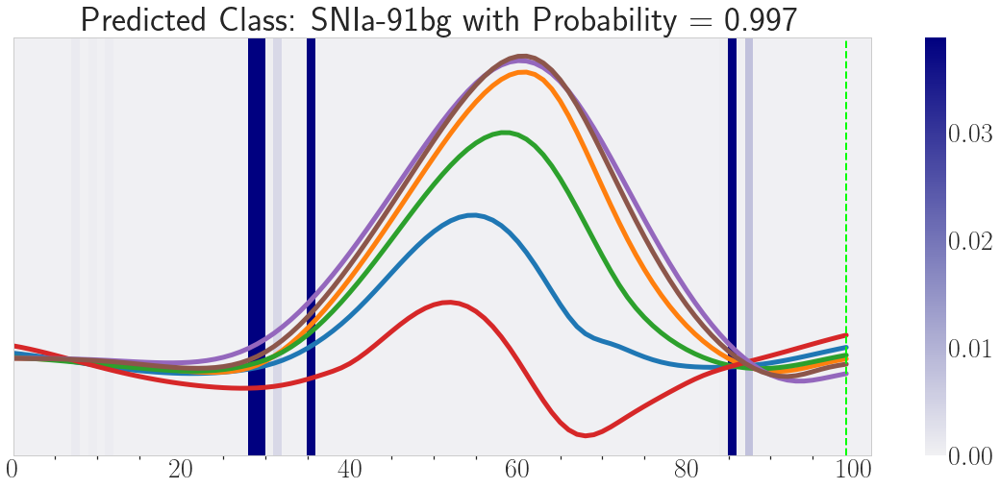

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.48315313
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.35366678
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.33211744
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.49052665
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.9932626


<Figure size 1440x216 with 0 Axes>

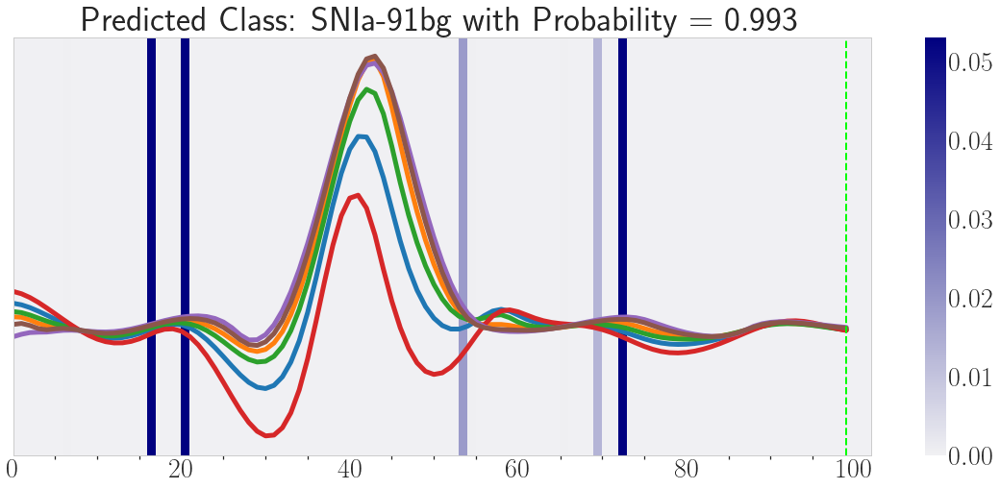

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.24612357
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.41941613
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.96781015


<Figure size 1440x216 with 0 Axes>

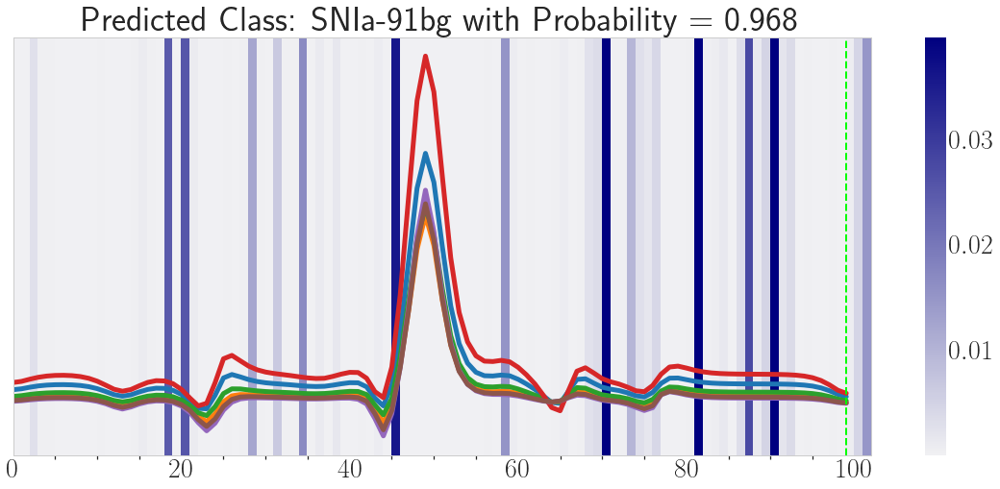

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.48708057
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.33211744
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.34363458
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.6235284
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.9617793


<Figure size 1440x216 with 0 Axes>

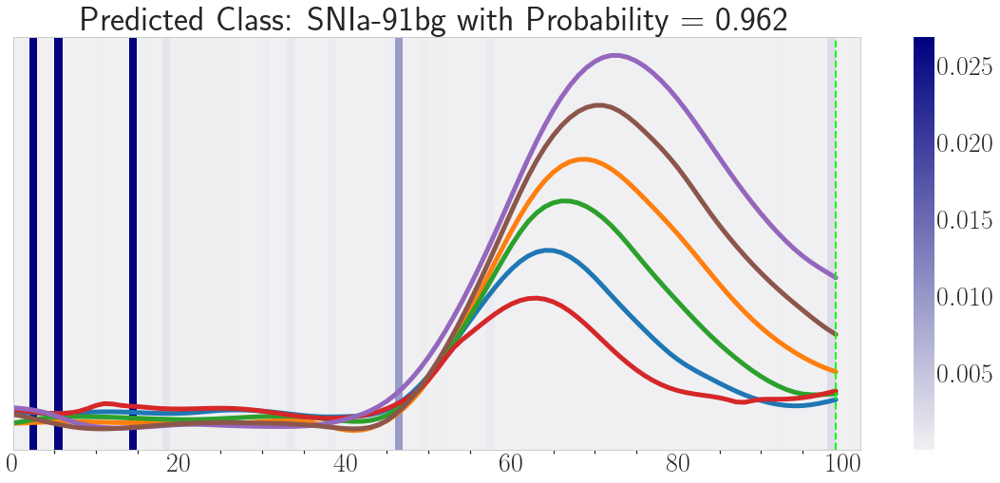

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.808259
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.9987764


<Figure size 1440x216 with 0 Axes>

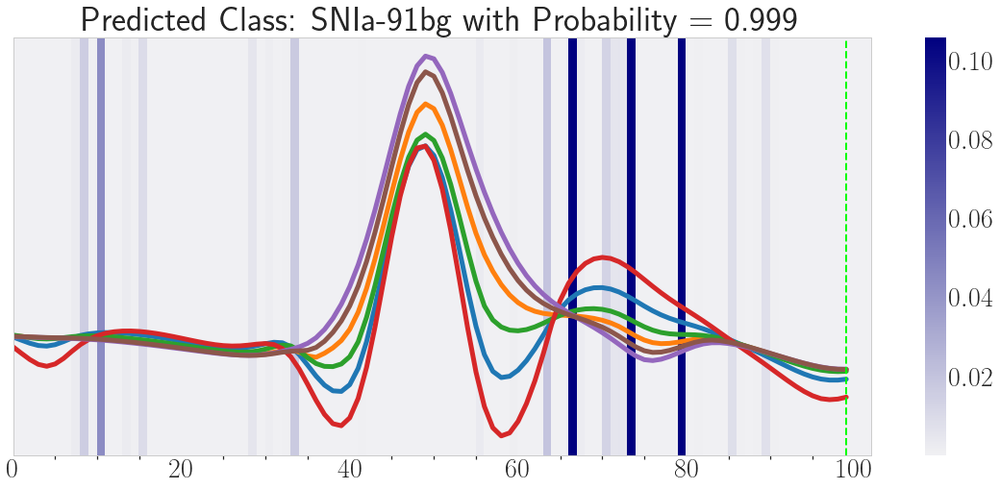

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.33902514
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.5814585
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.33162105
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.6559517
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.96781015


<Figure size 1440x216 with 0 Axes>

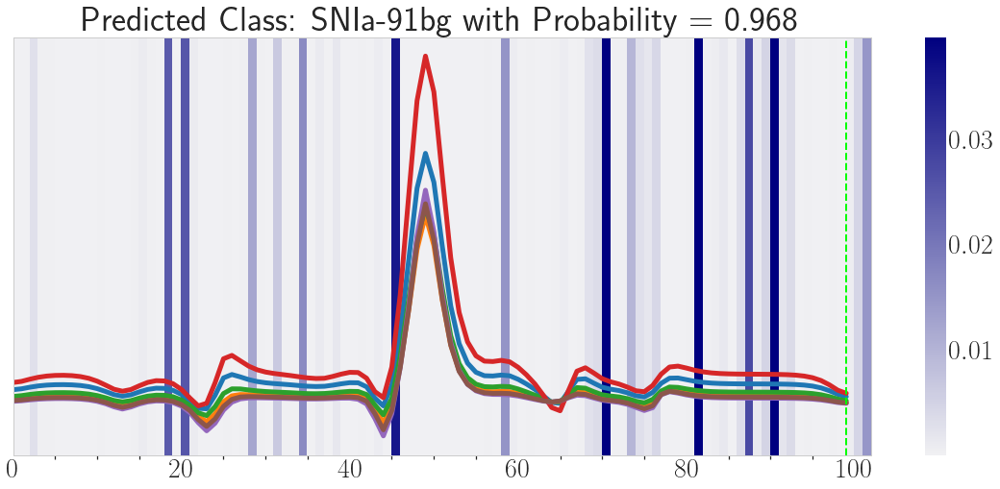

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.40764782
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.915656


<Figure size 1440x216 with 0 Axes>

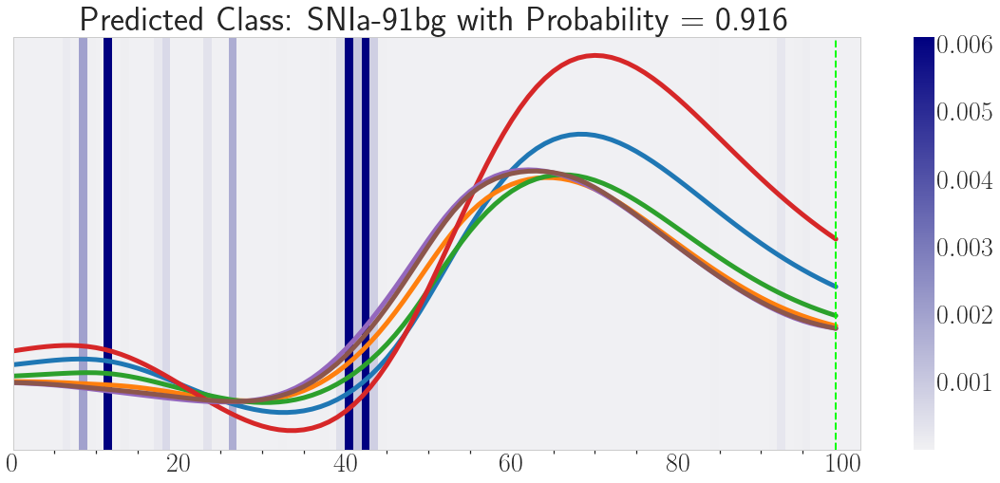

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.35059378
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.35366678
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.49468577
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.9932626


<Figure size 1440x216 with 0 Axes>

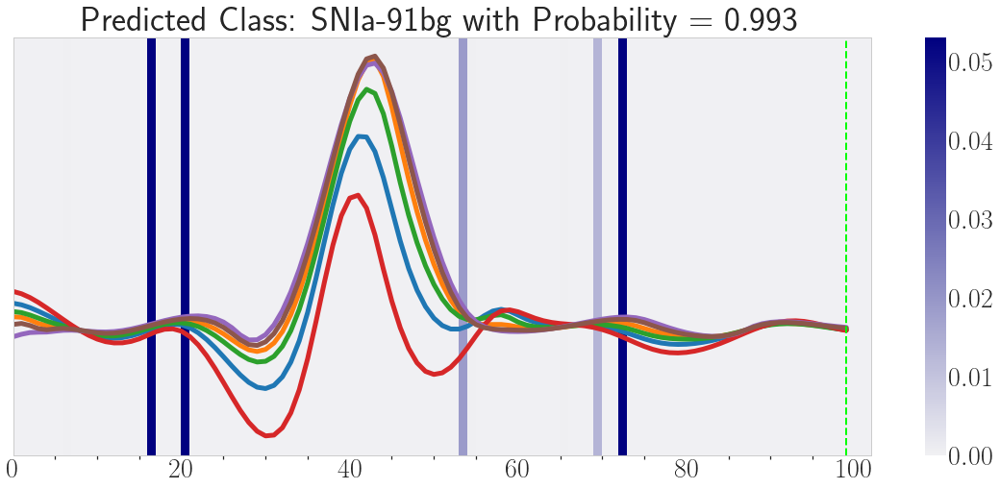

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.9526038


<Figure size 1440x216 with 0 Axes>

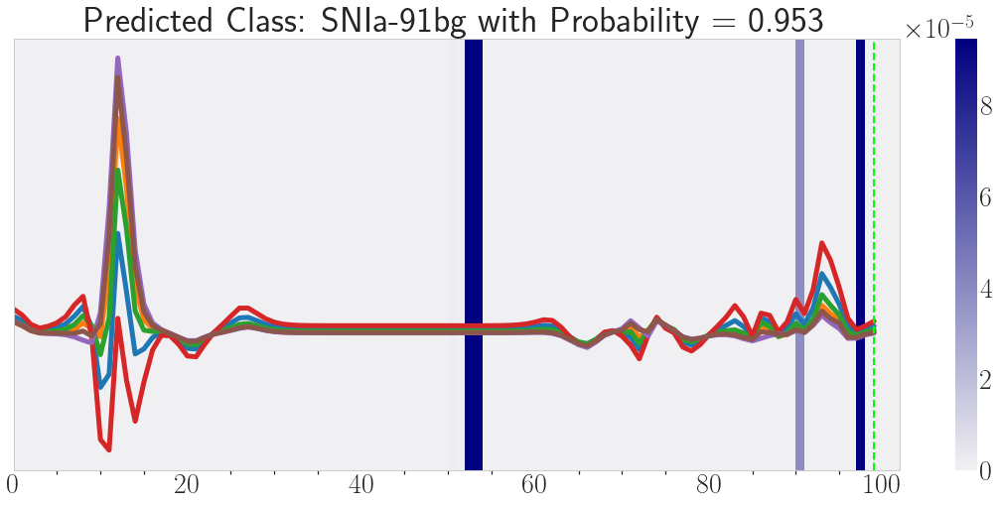

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.9598311


<Figure size 1440x216 with 0 Axes>

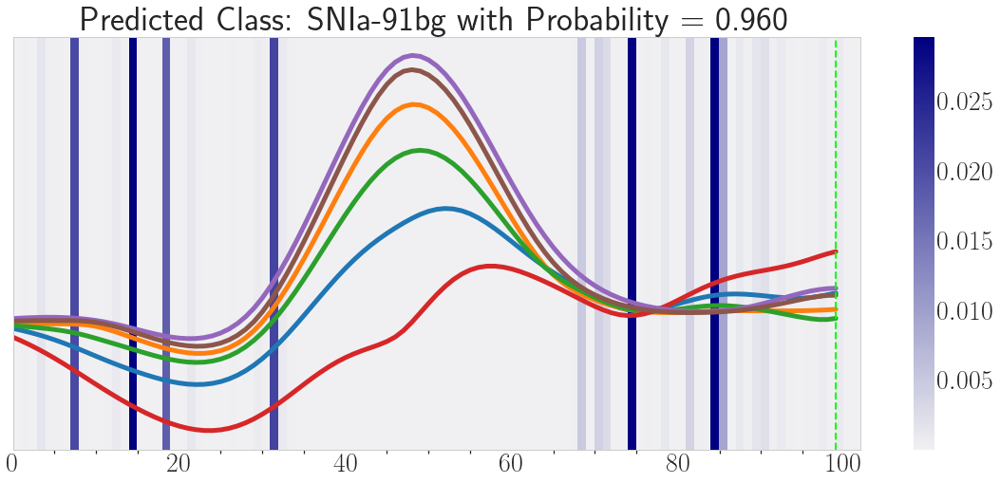

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.32938612
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.9932626


<Figure size 1440x216 with 0 Axes>

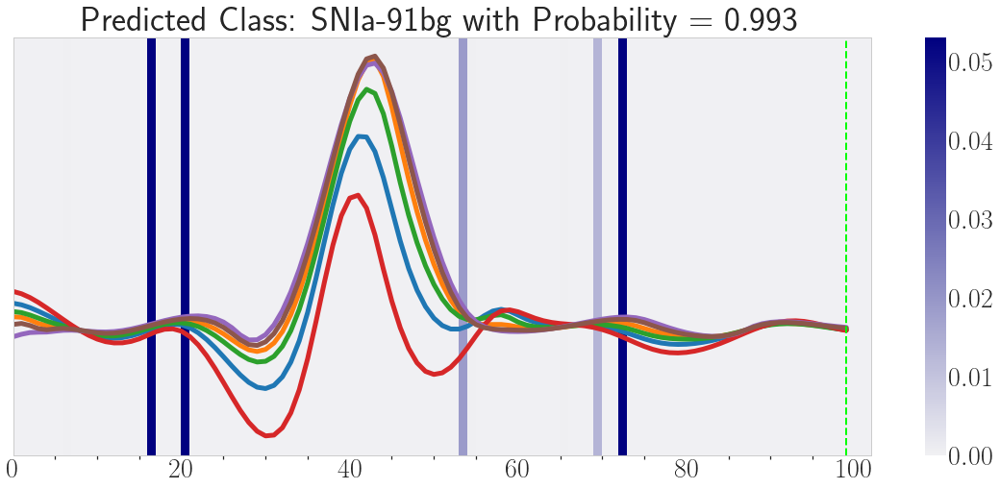

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.99732566


<Figure size 1440x216 with 0 Axes>

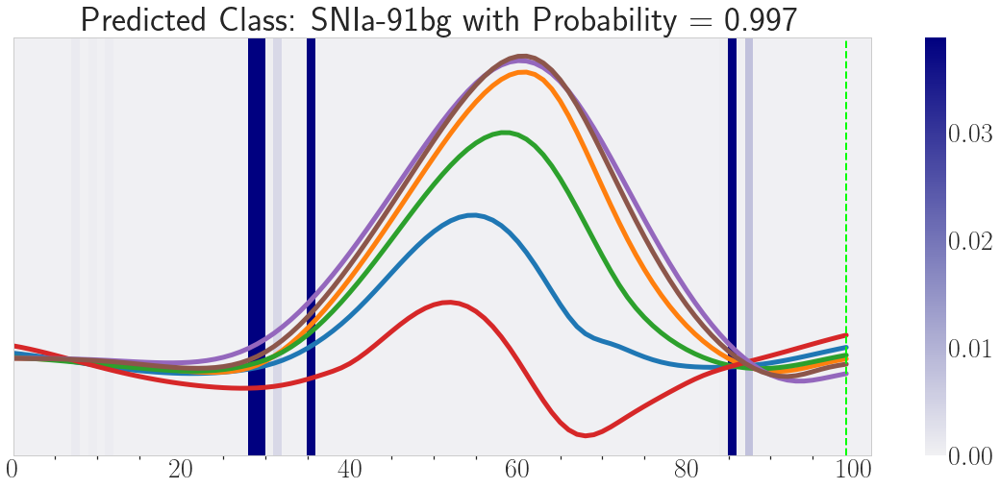

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.24612357
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.24823453
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.35366678
(102,)
(1, 102)
Predicted Class = 9, Probability = 0.9617793


<Figure size 1440x216 with 0 Axes>

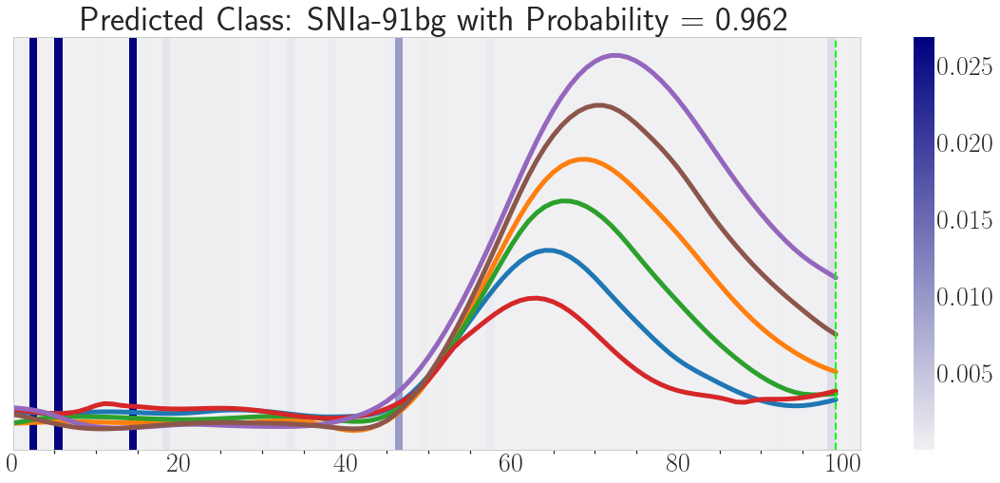

(102,)
(1, 102)
Predicted Class = 9, Probability = 0.808259
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.99998784


<Figure size 1440x216 with 0 Axes>

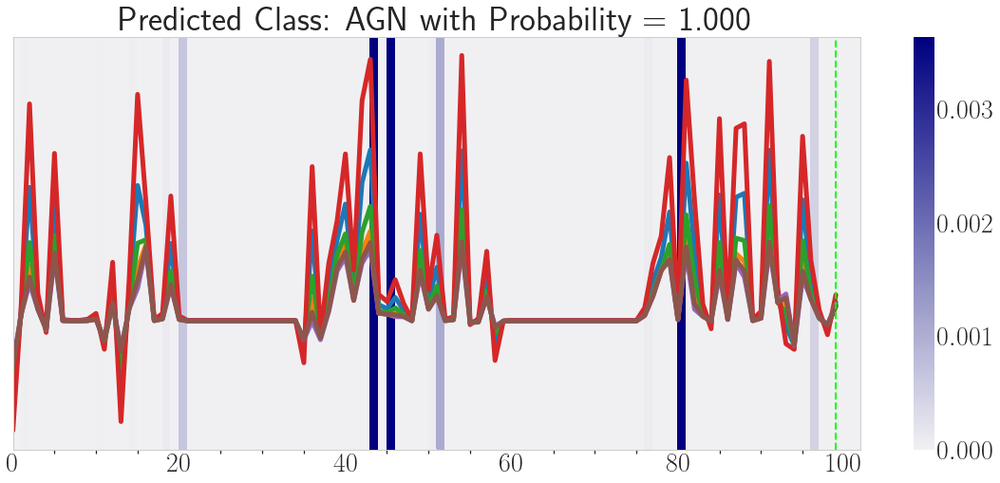

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.50155413
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.86665297
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.99993706


<Figure size 1440x216 with 0 Axes>

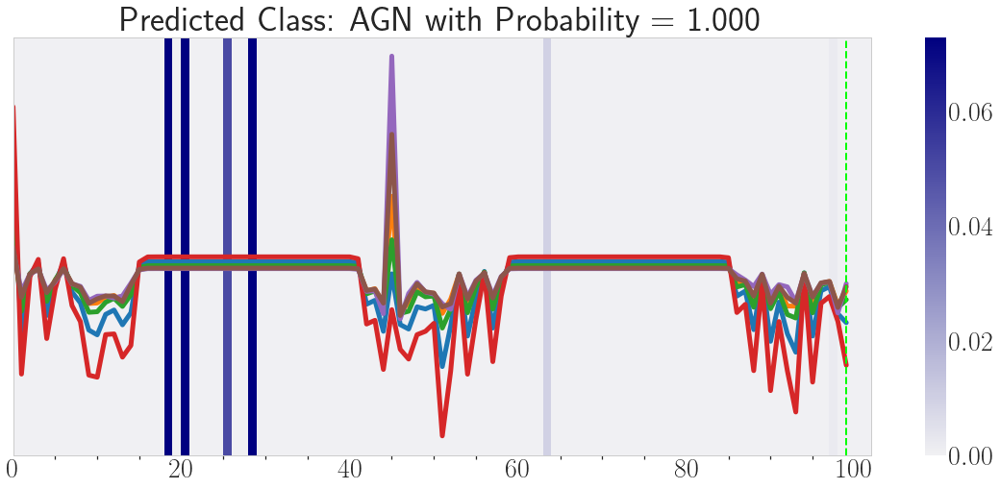

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9942187


<Figure size 1440x216 with 0 Axes>

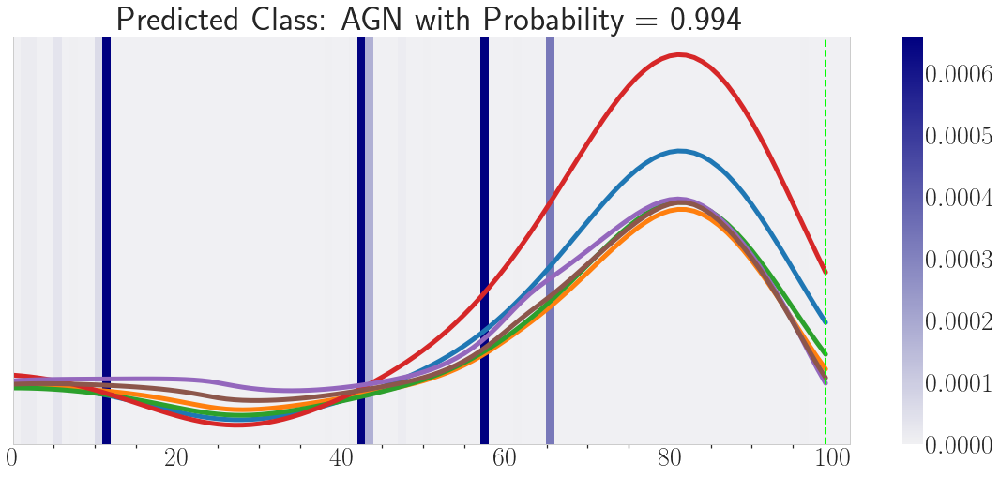

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9988643


<Figure size 1440x216 with 0 Axes>

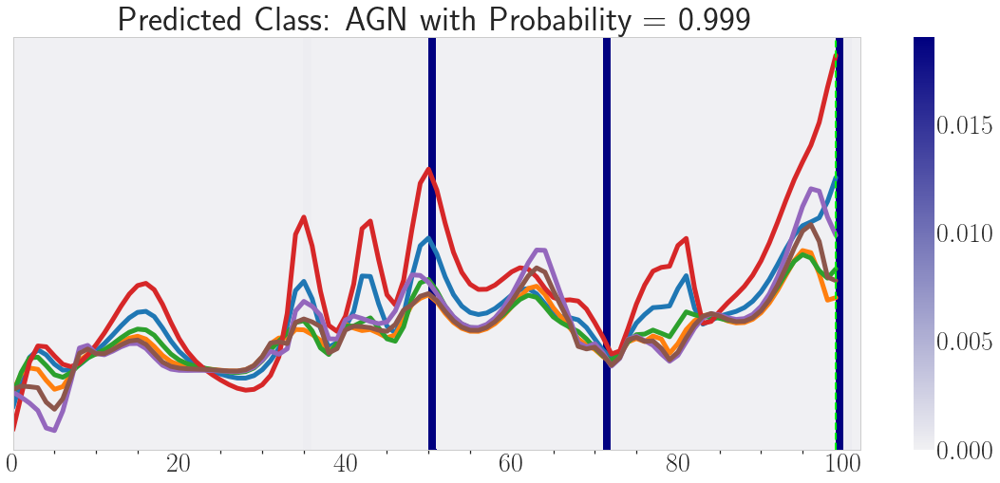

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9956766


<Figure size 1440x216 with 0 Axes>

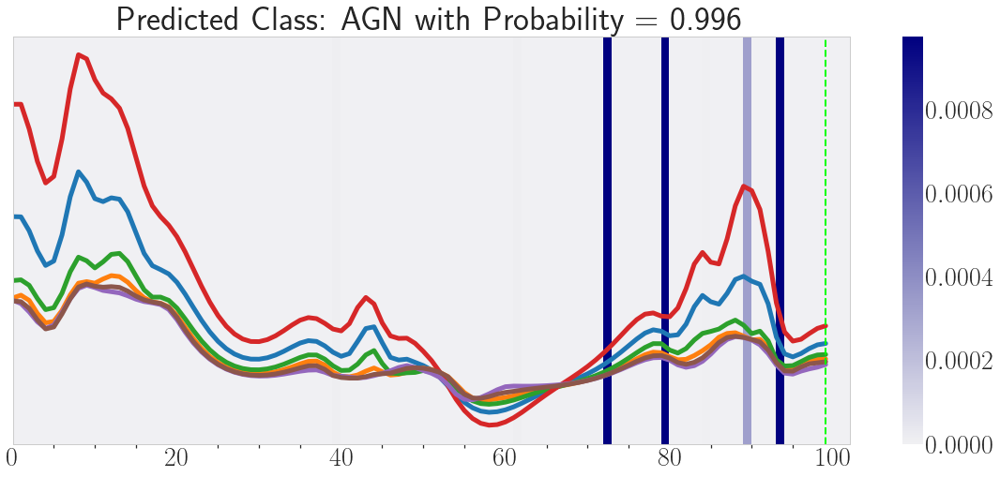

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9816159


<Figure size 1440x216 with 0 Axes>

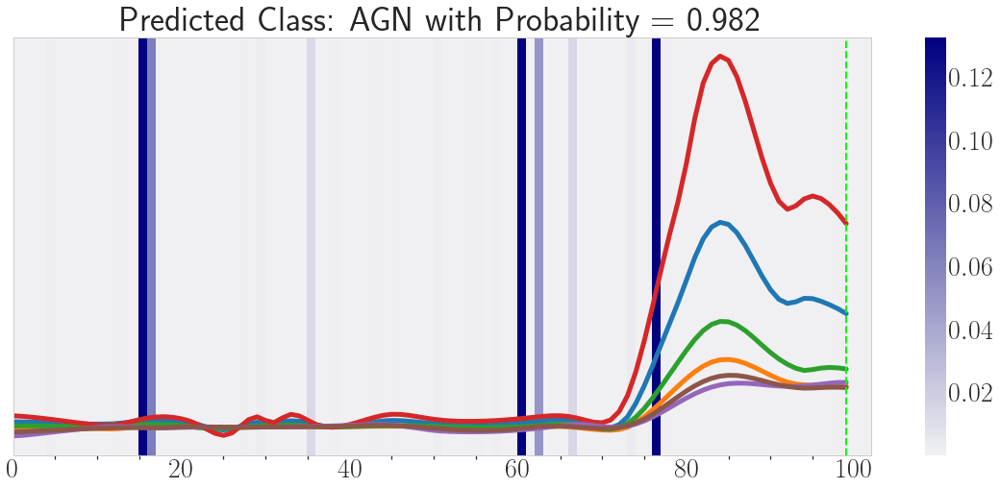

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.6518676
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.48493806
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.99842983


<Figure size 1440x216 with 0 Axes>

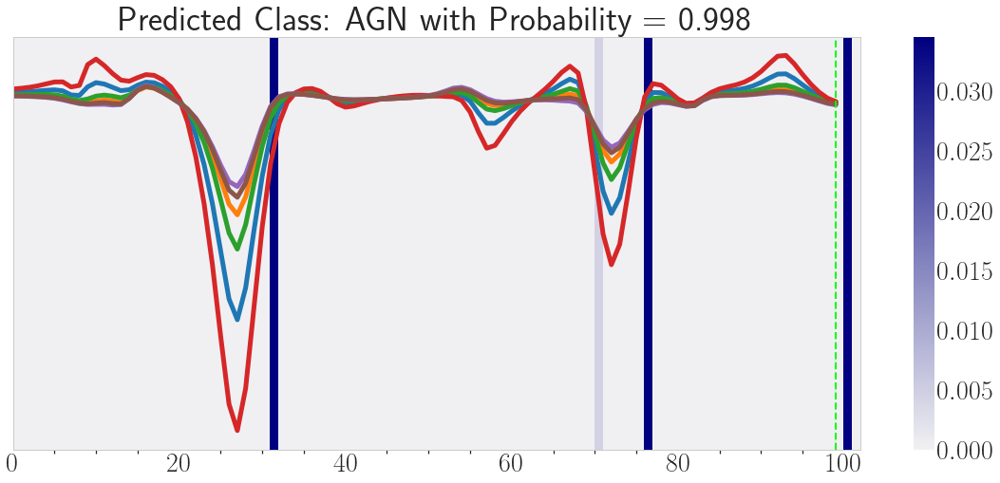

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.3742519
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.7794622
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9992613


<Figure size 1440x216 with 0 Axes>

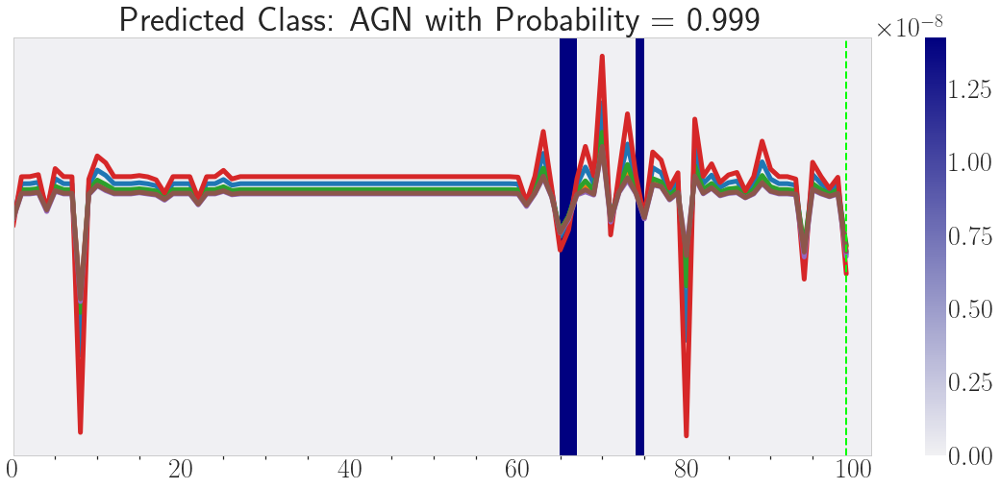

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9495294


<Figure size 1440x216 with 0 Axes>

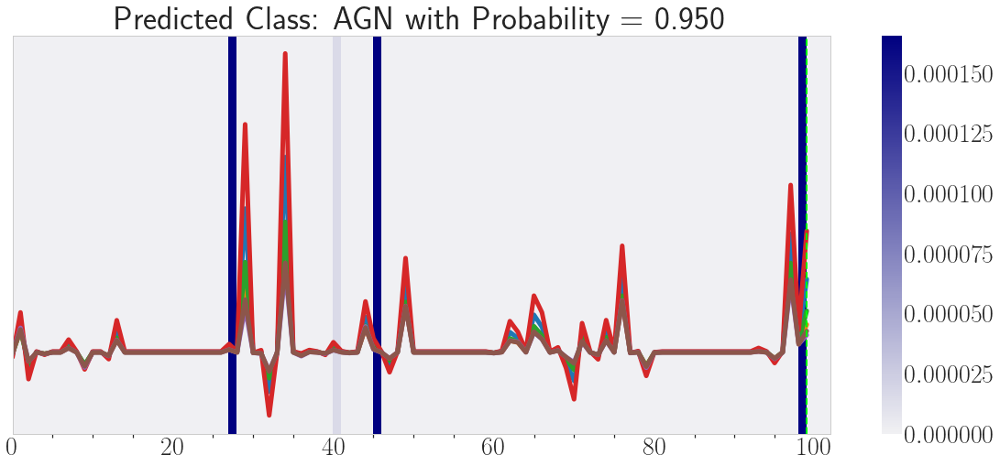

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9969694


<Figure size 1440x216 with 0 Axes>

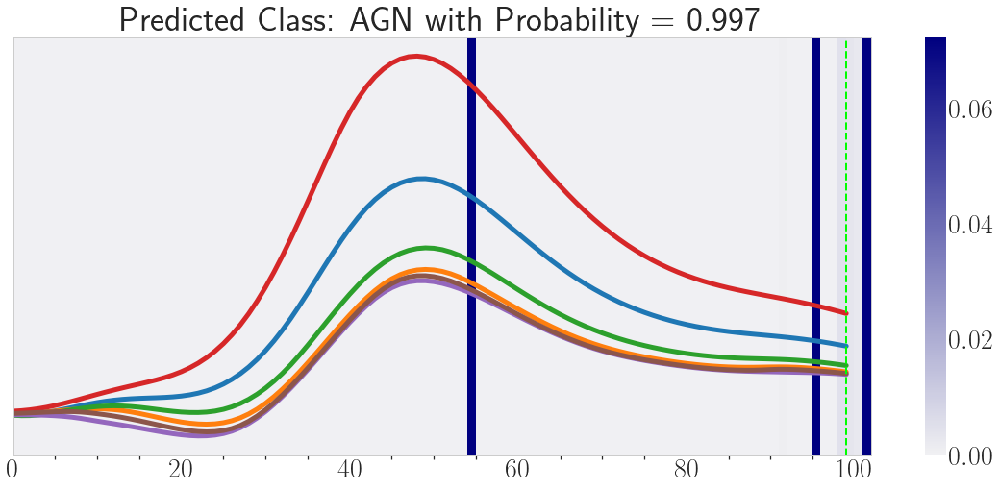

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.60491556
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.99994564


<Figure size 1440x216 with 0 Axes>

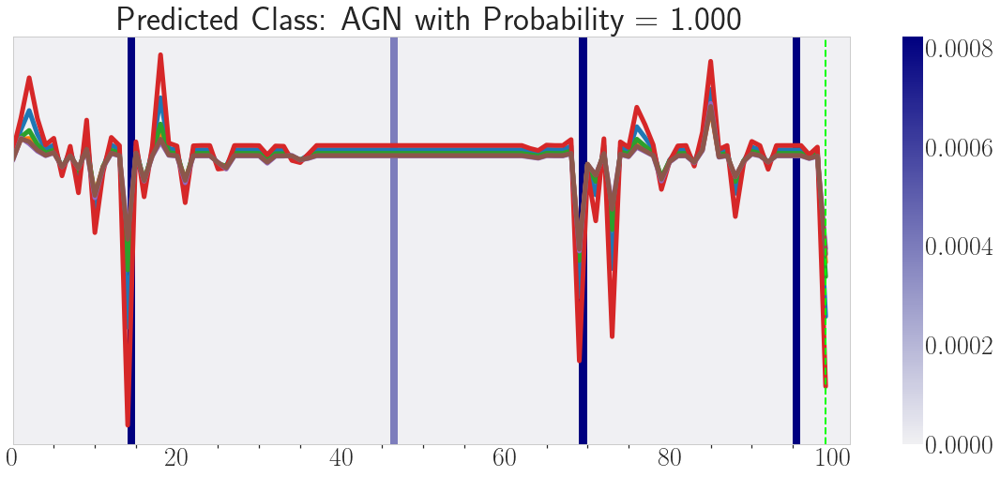

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.99999905


<Figure size 1440x216 with 0 Axes>

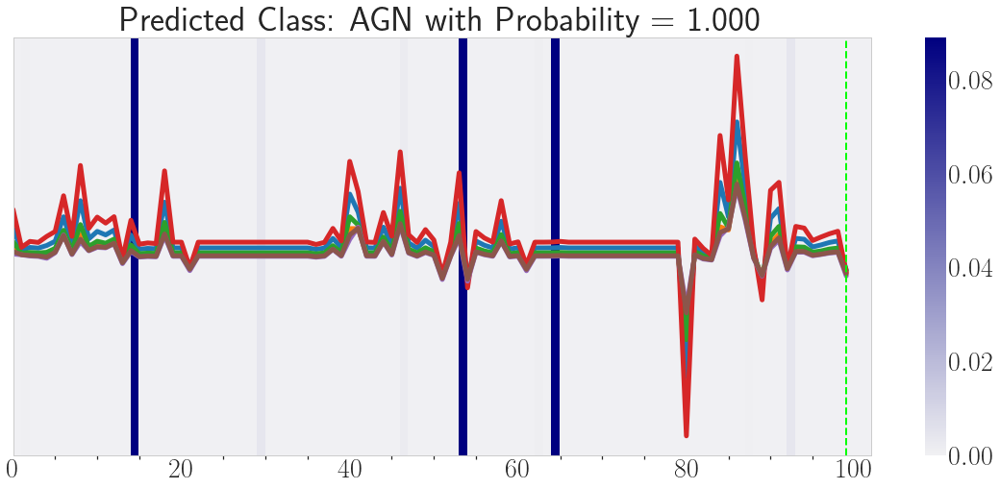

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.88584167
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.979412


<Figure size 1440x216 with 0 Axes>

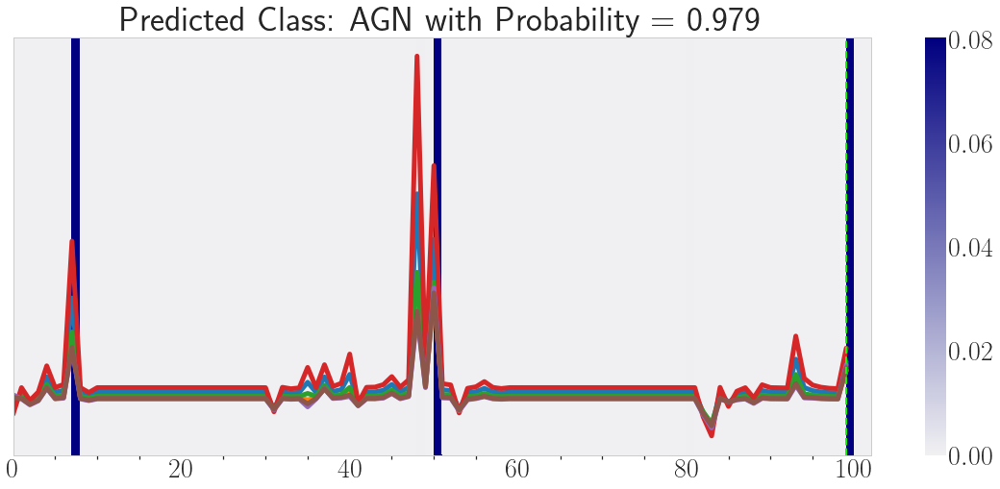

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9997552


<Figure size 1440x216 with 0 Axes>

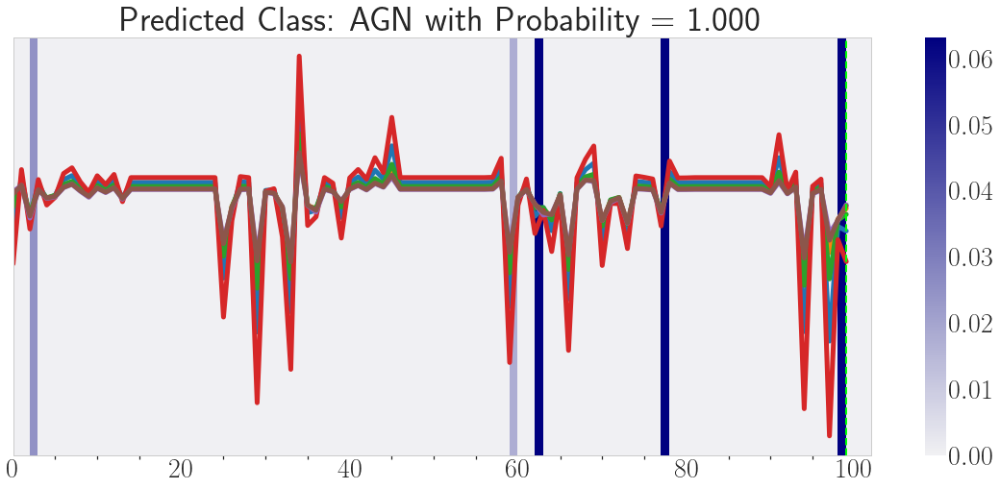

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.5295184
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.99999785


<Figure size 1440x216 with 0 Axes>

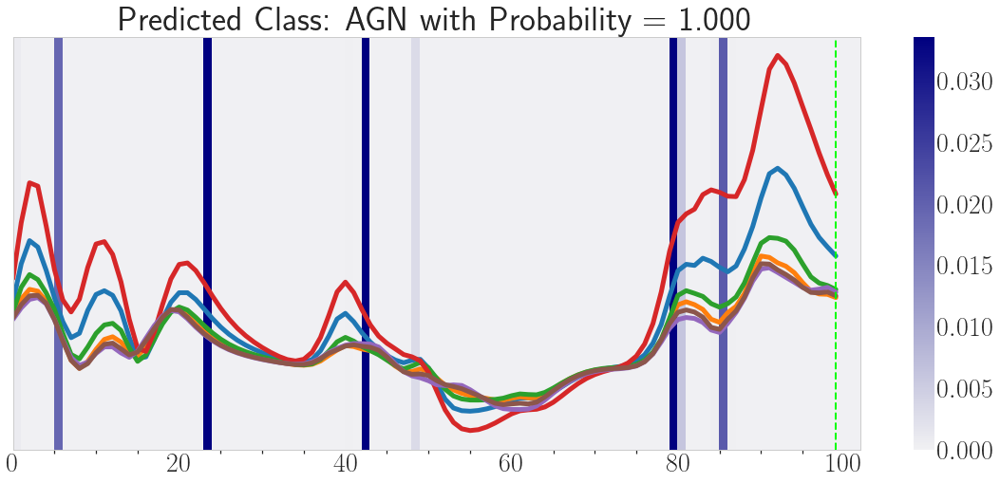

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9981914


<Figure size 1440x216 with 0 Axes>

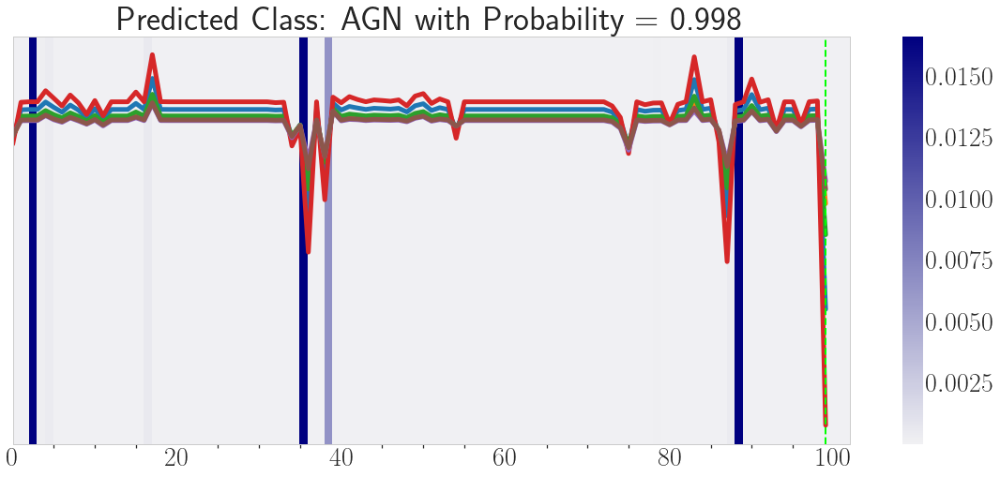

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.99981016


<Figure size 1440x216 with 0 Axes>

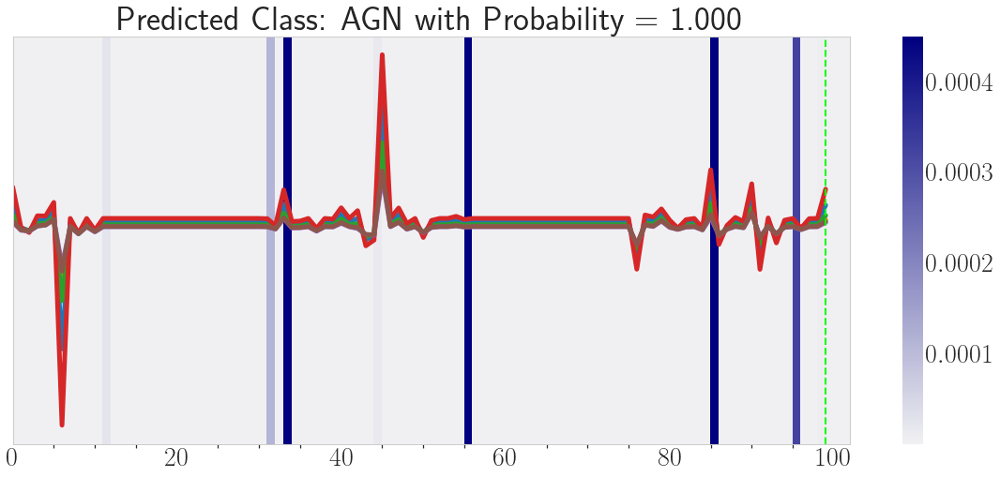

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.49065334
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.8987294
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9999989


<Figure size 1440x216 with 0 Axes>

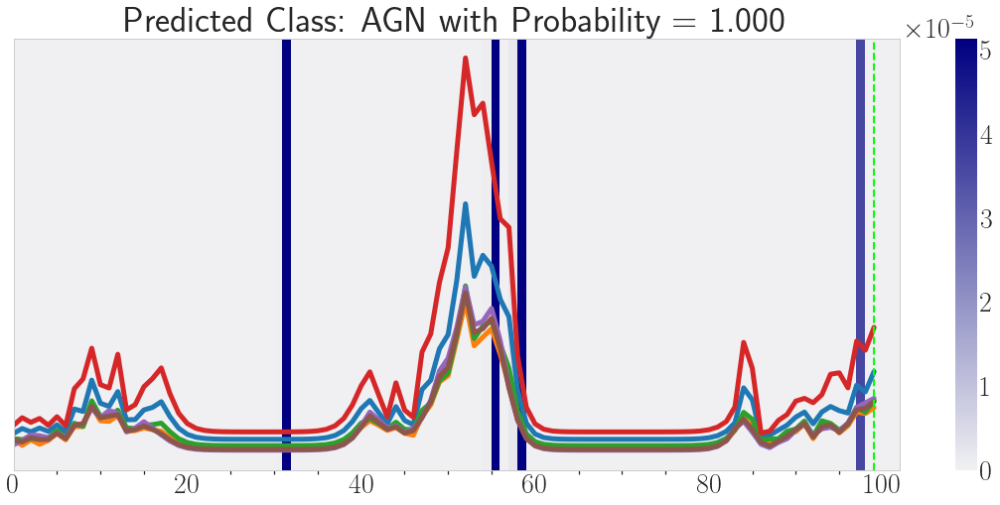

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9634396


<Figure size 1440x216 with 0 Axes>

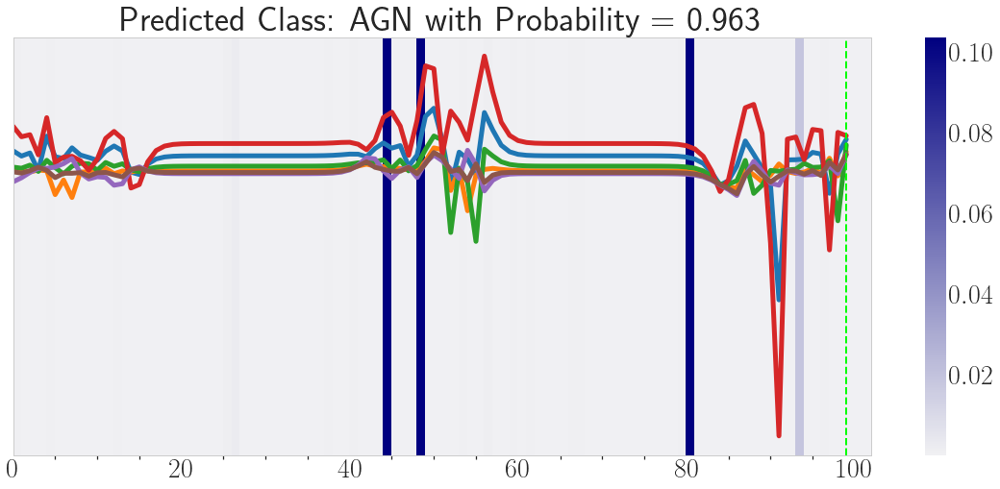

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9982799


<Figure size 1440x216 with 0 Axes>

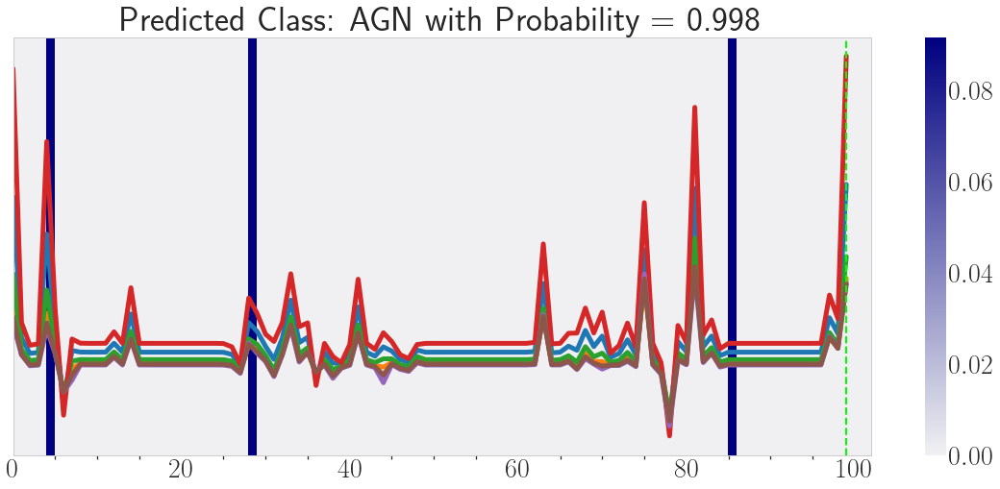

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.59494704
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.47598407
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.5371242
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.5994189
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9993886


<Figure size 1440x216 with 0 Axes>

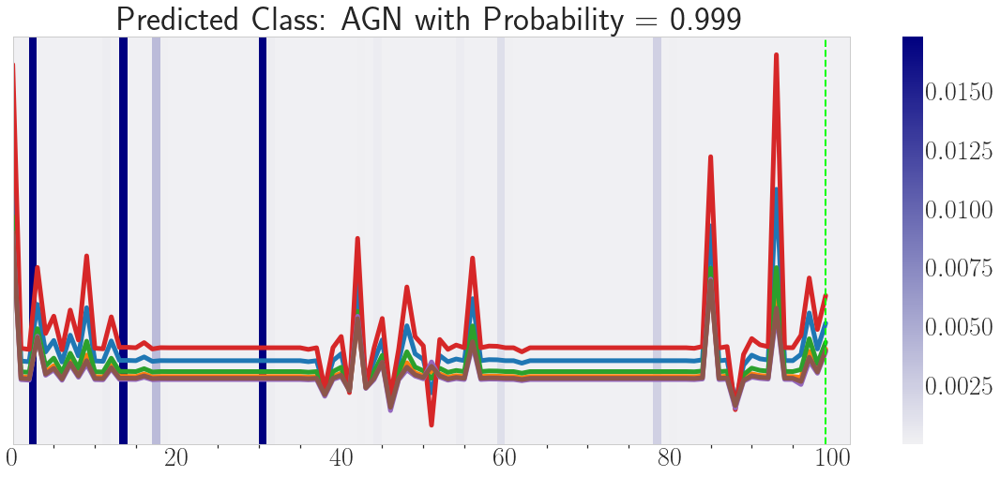

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.99965274


<Figure size 1440x216 with 0 Axes>

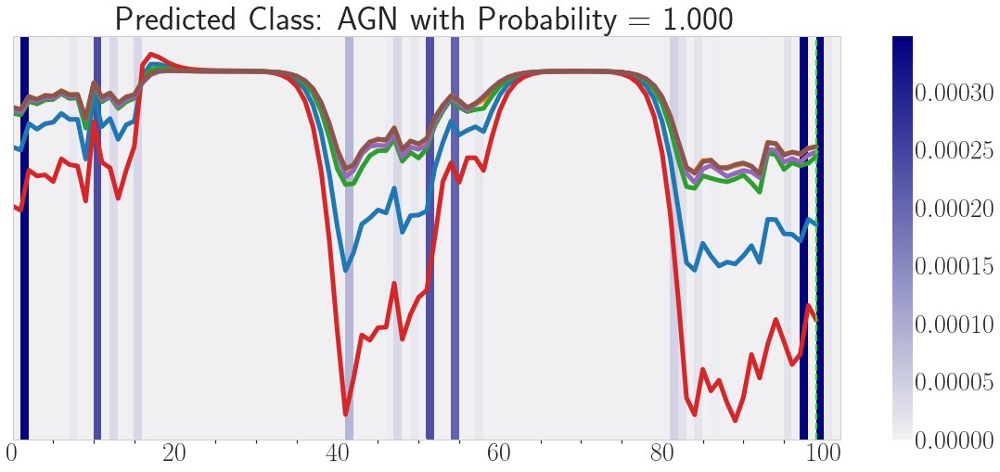

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.99762183


<Figure size 1440x216 with 0 Axes>

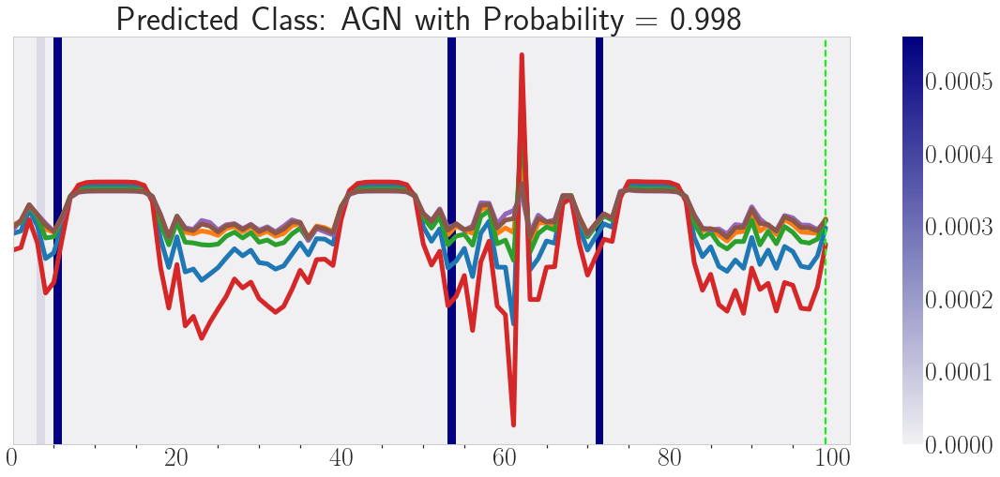

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.59357435
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9987281


<Figure size 1440x216 with 0 Axes>

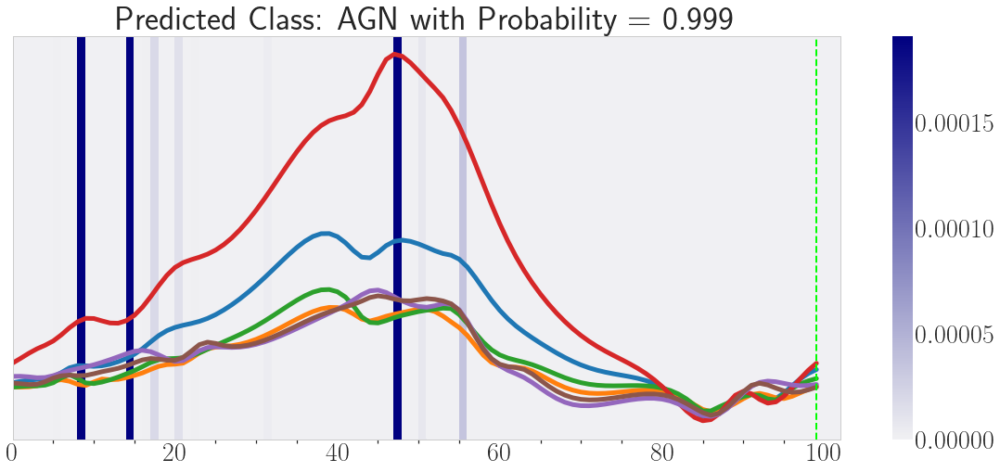

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9752984


<Figure size 1440x216 with 0 Axes>

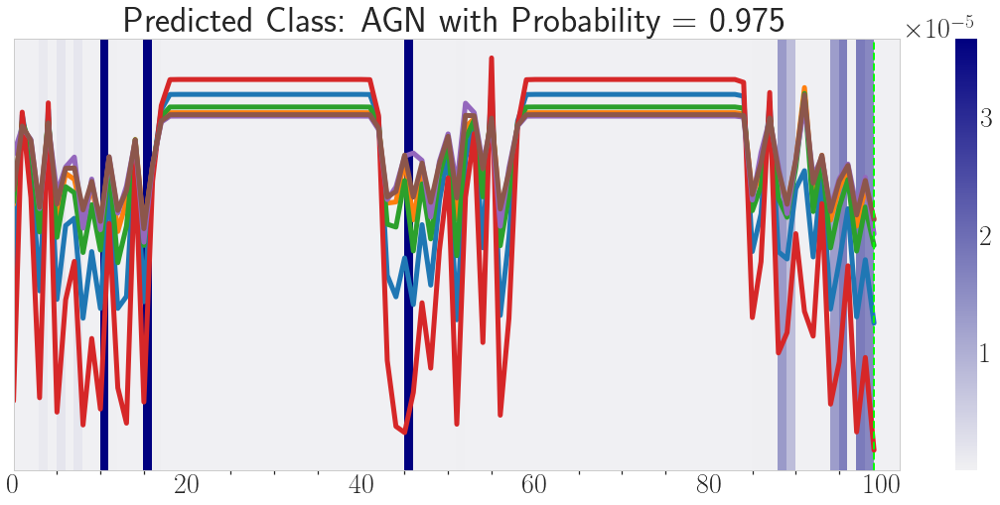

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.98967946


<Figure size 1440x216 with 0 Axes>

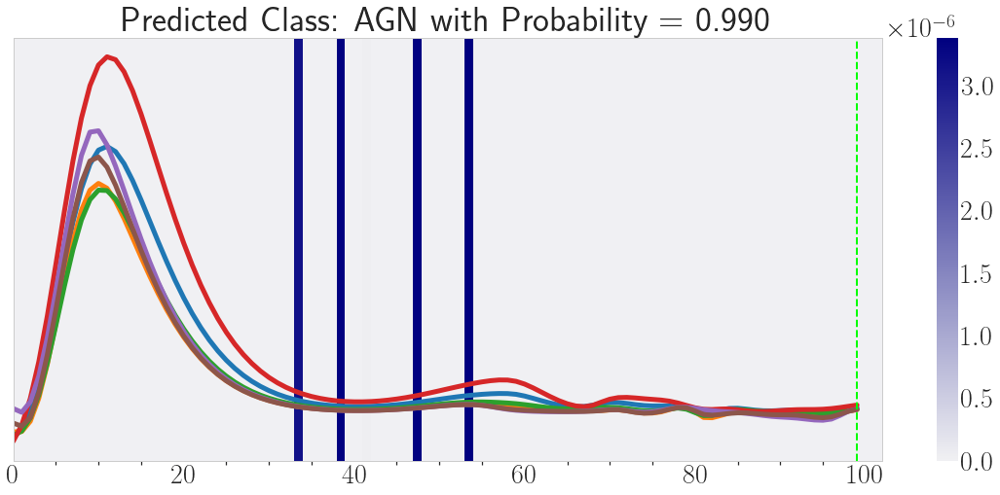

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.5496031
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9983822


<Figure size 1440x216 with 0 Axes>

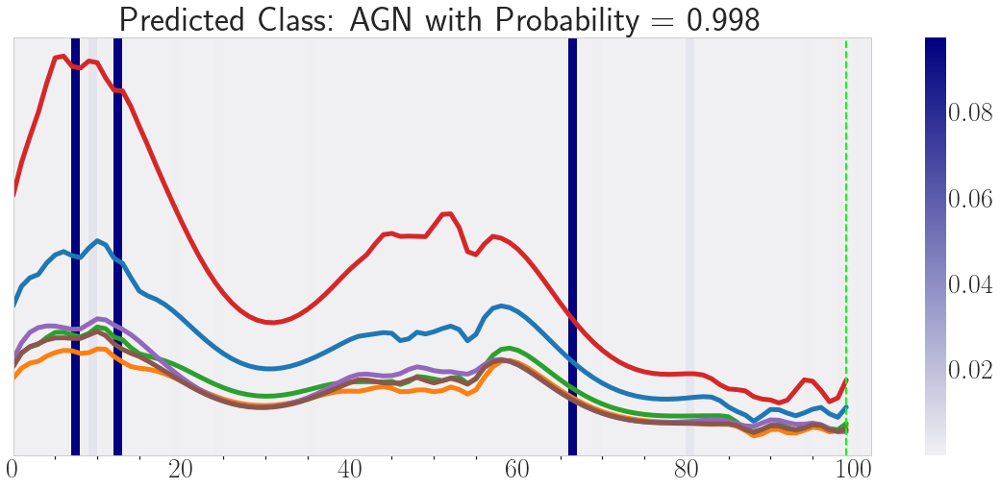

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9999969


<Figure size 1440x216 with 0 Axes>

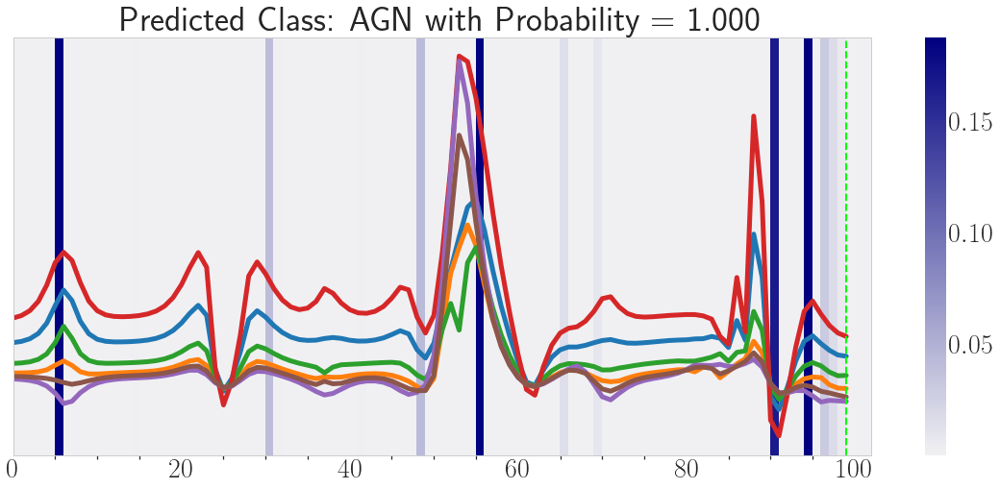

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.46697146
(102,)
(1, 102)
Predicted Class = 10, Probability = 0.97796154


<Figure size 1440x216 with 0 Axes>

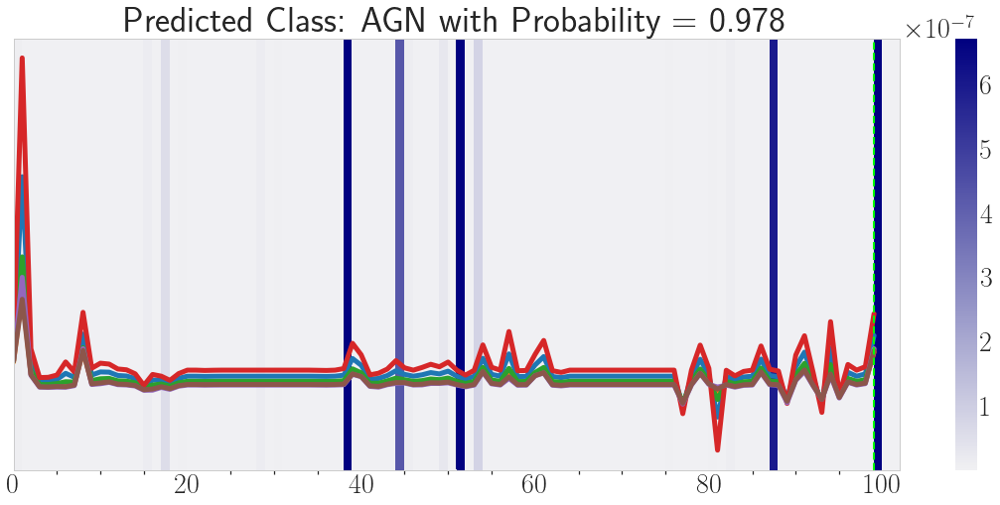

(102,)
(1, 102)
Predicted Class = 10, Probability = 0.9964204


<Figure size 1440x216 with 0 Axes>

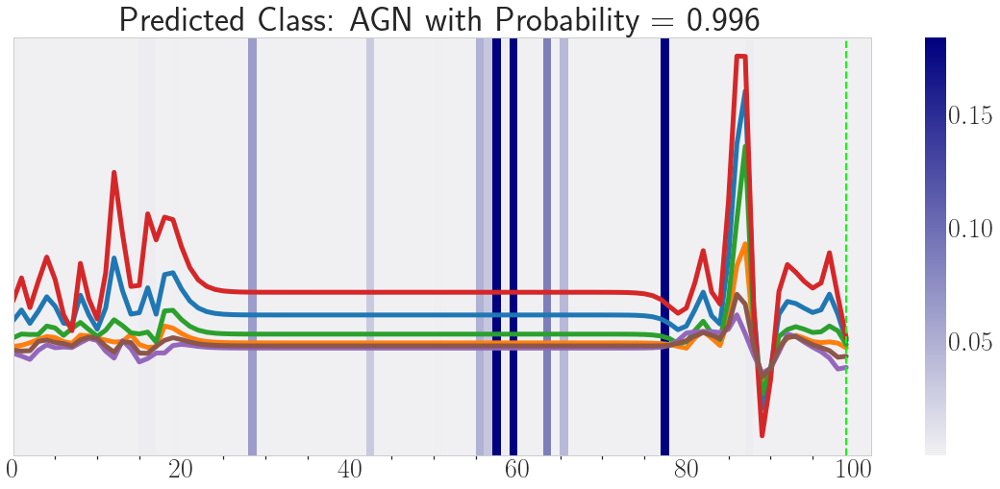

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.53733784
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9946896


<Figure size 1440x216 with 0 Axes>

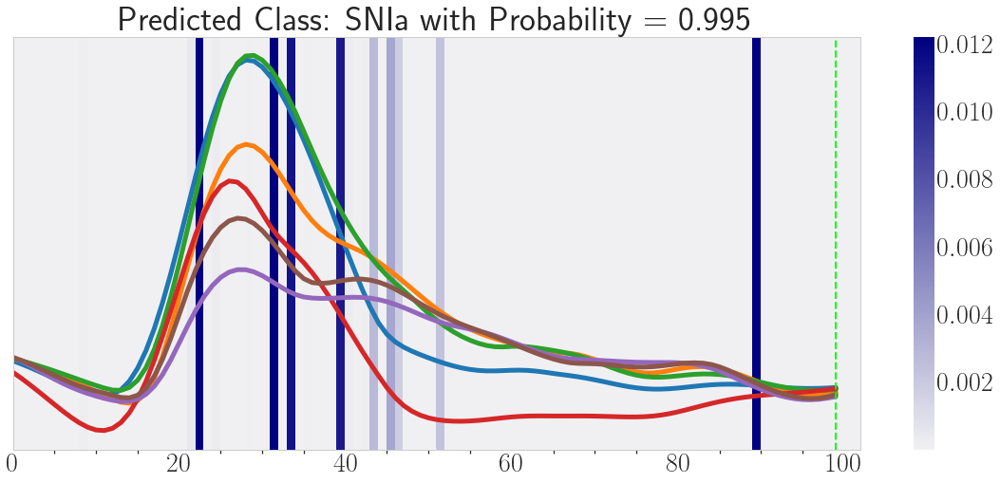

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9561242


<Figure size 1440x216 with 0 Axes>

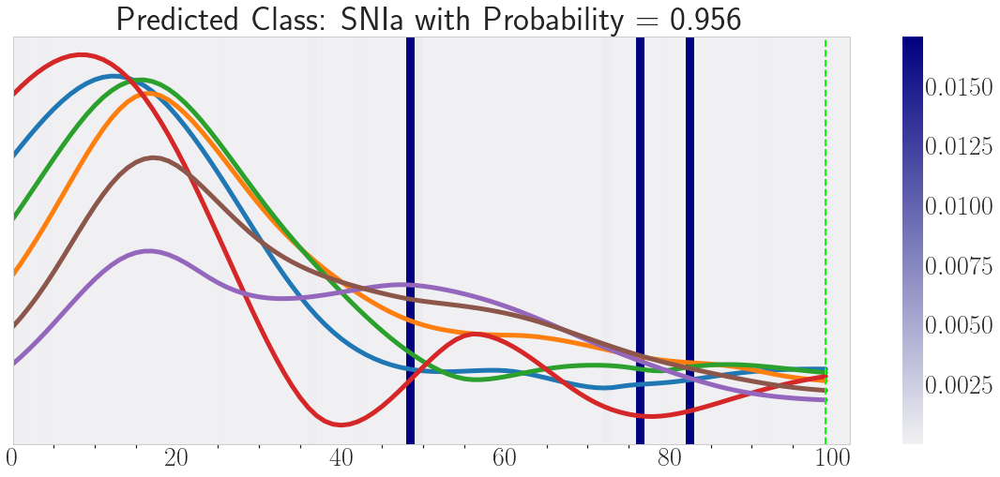

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.47938114
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.2808237
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.55046266
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.93906486


<Figure size 1440x216 with 0 Axes>

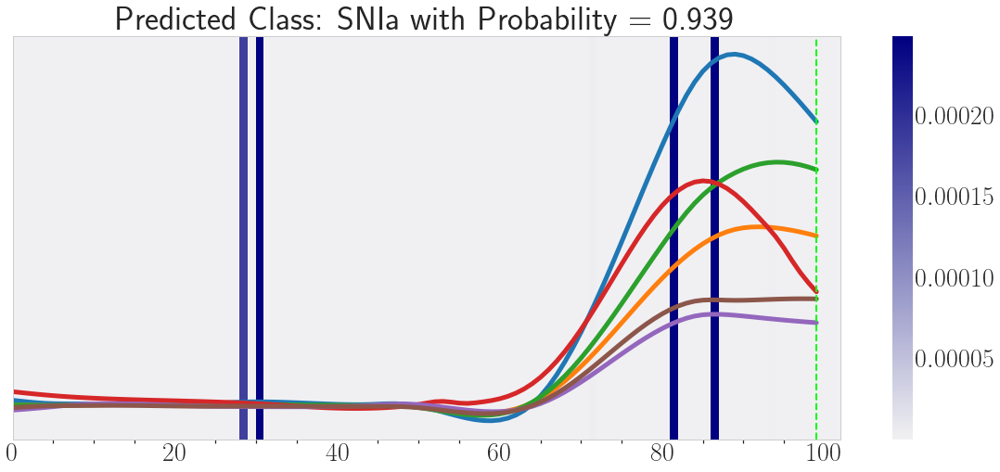

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.7882122
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.3184649
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.85368764
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9248861


<Figure size 1440x216 with 0 Axes>

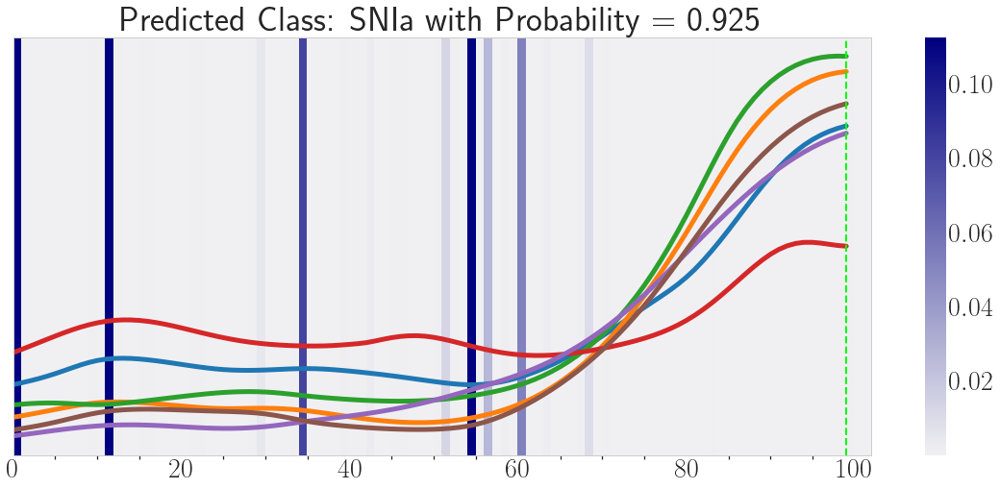

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.7057605
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.487189
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9756428


<Figure size 1440x216 with 0 Axes>

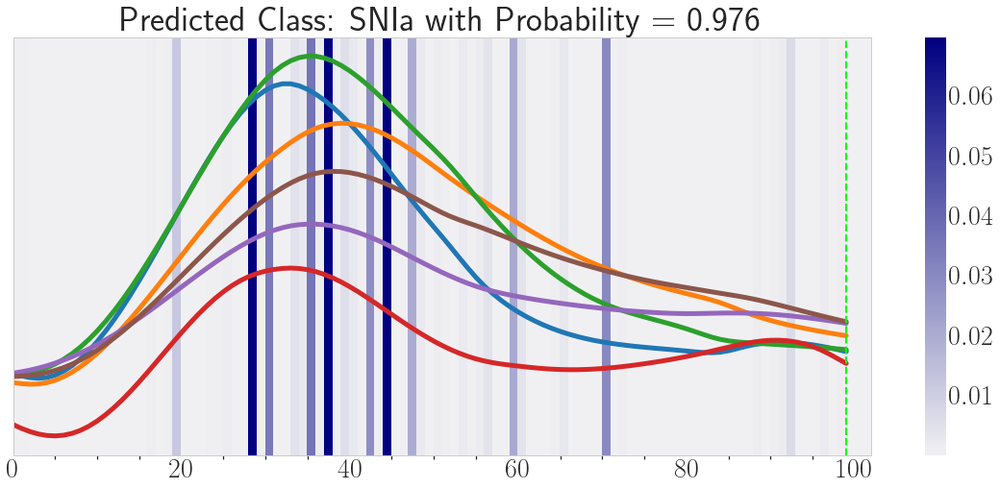

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.56737727
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9343194


<Figure size 1440x216 with 0 Axes>

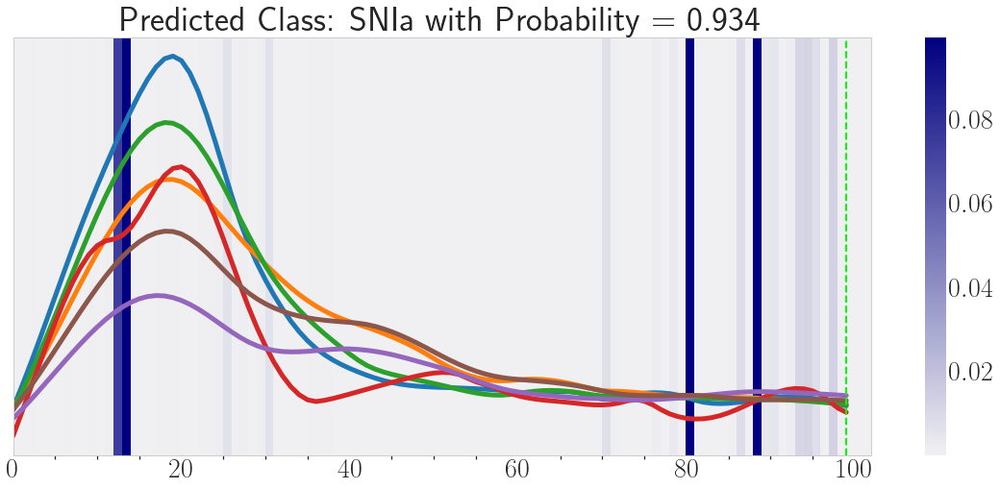

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9366258


<Figure size 1440x216 with 0 Axes>

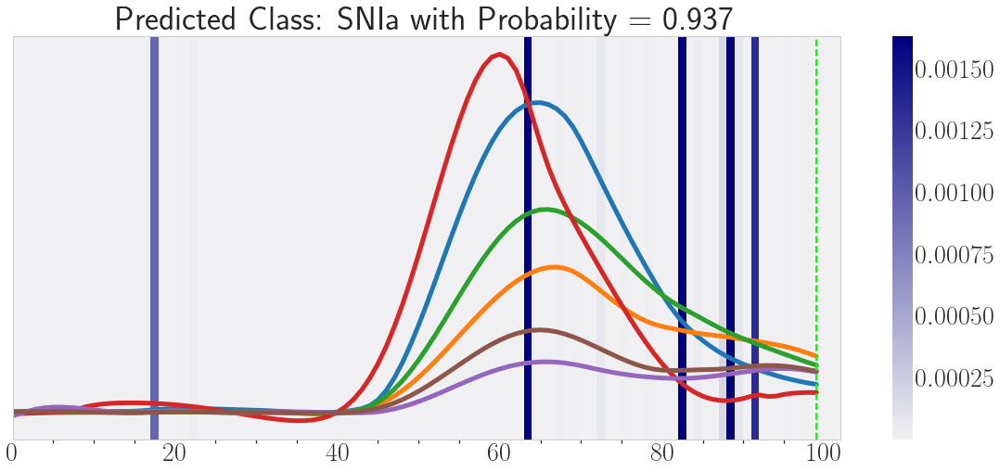

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9343194


<Figure size 1440x216 with 0 Axes>

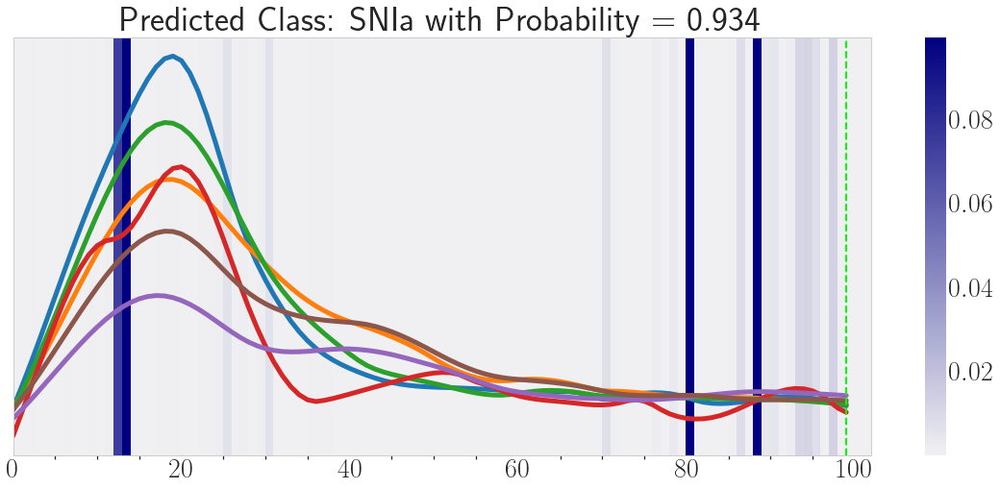

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.71468264
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.86570877
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.85368764
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.5696262
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.67025894
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.72229713
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.87825567
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.88505745
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.40582266
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.89139605
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.5975046
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.86570877
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9485625


<Figure size 1440x216 with 0 Axes>

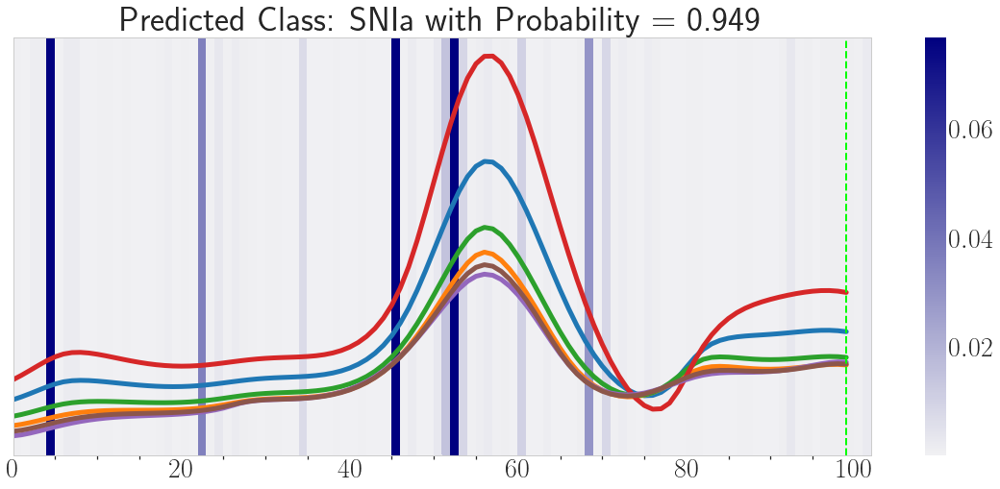

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.44575244
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.45283994
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.6453155
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.62061256
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.39366007
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.57137686
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.35239086
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.7969773
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.95442075


<Figure size 1440x216 with 0 Axes>

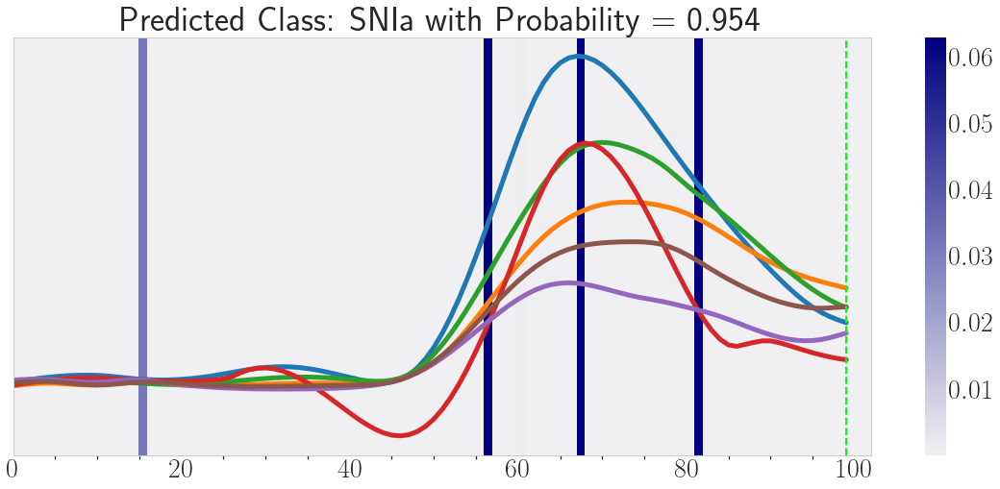

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.58373696
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.47675174
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.5975046
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.81744426
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9449077


<Figure size 1440x216 with 0 Axes>

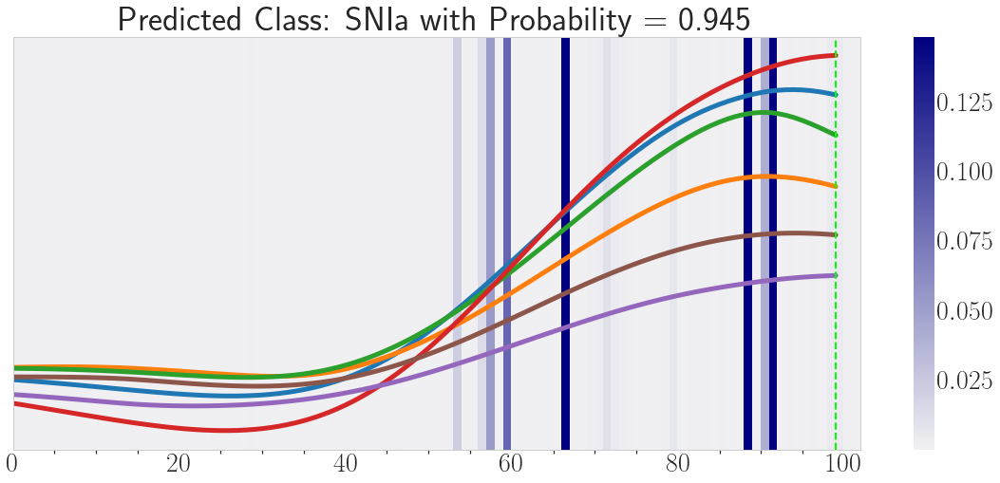

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.5591799
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.710521
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.41527483
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9853897


<Figure size 1440x216 with 0 Axes>

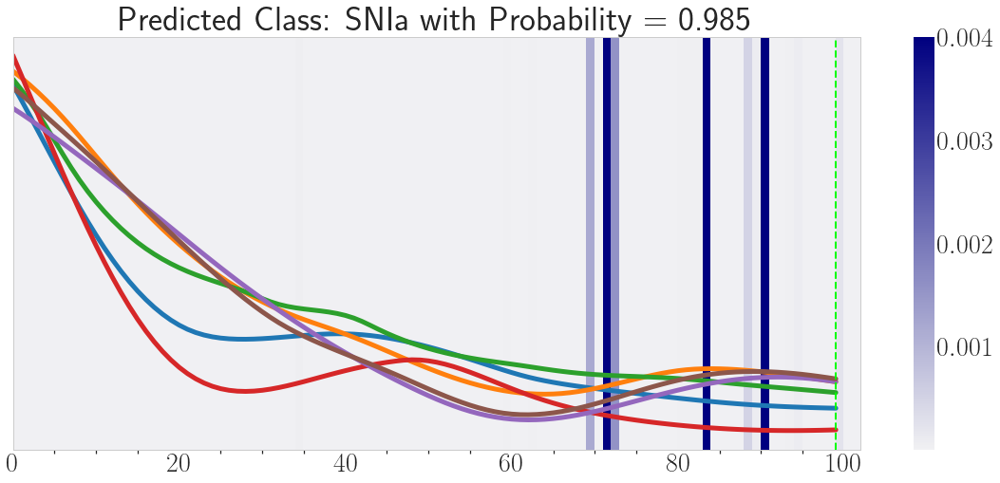

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.5253978
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.6246346
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.56600076
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.8284663
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.4309666
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.884688
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.7011364
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.42014334
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.7683552
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9700256


<Figure size 1440x216 with 0 Axes>

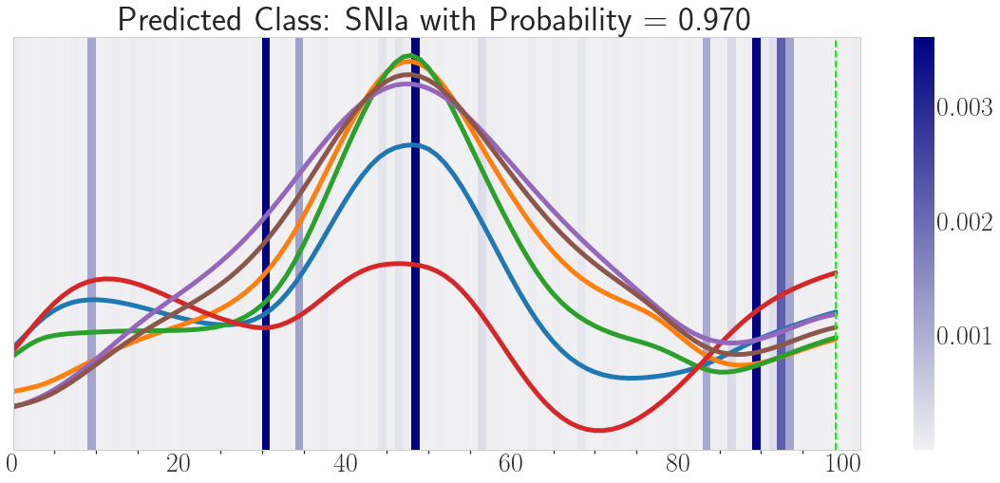

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.98714334


<Figure size 1440x216 with 0 Axes>

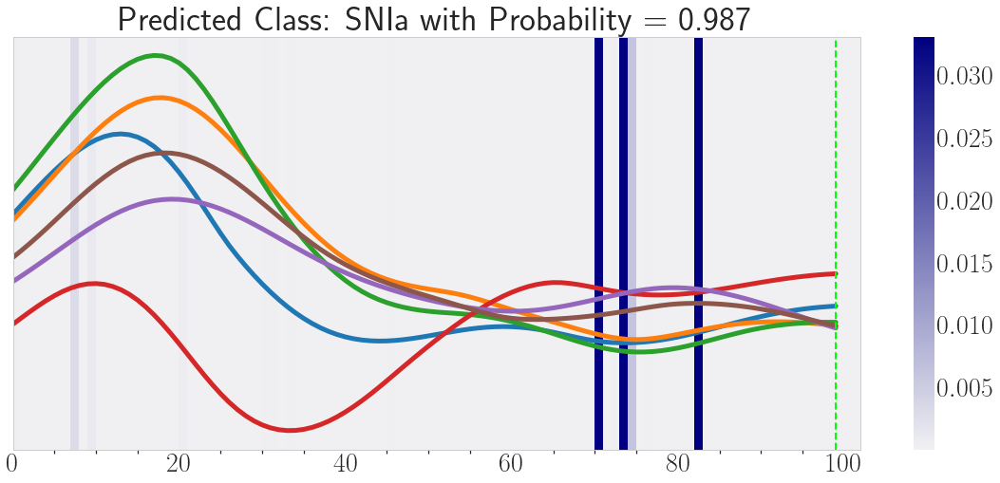

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9523866


<Figure size 1440x216 with 0 Axes>

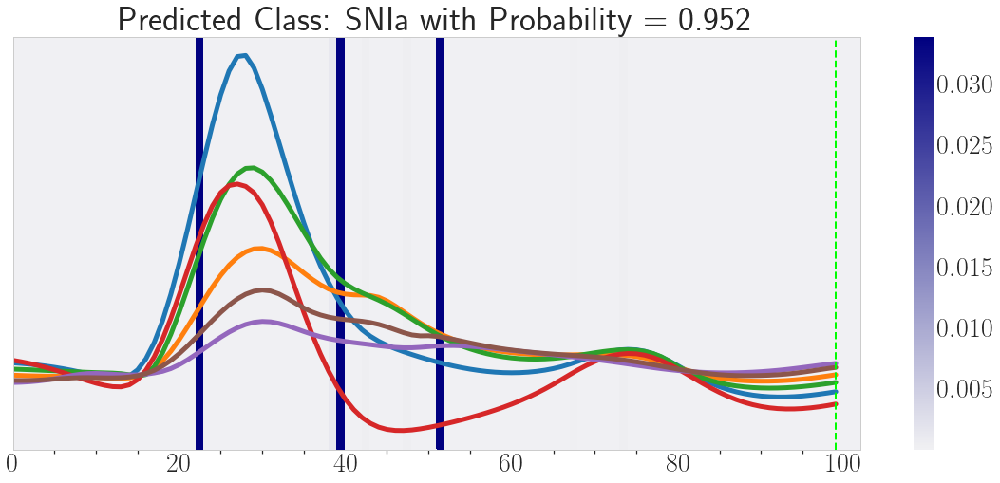

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9057994


<Figure size 1440x216 with 0 Axes>

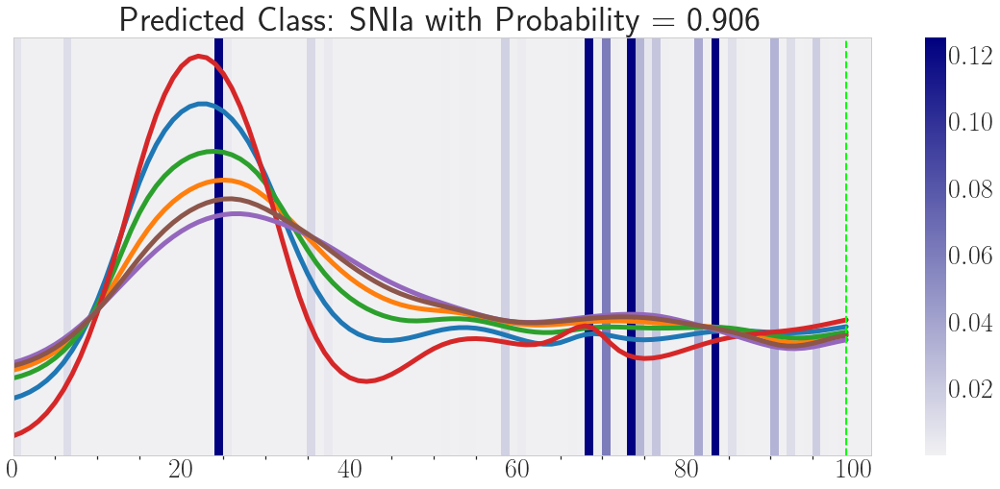

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.8284663
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.7602744
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9959745


<Figure size 1440x216 with 0 Axes>

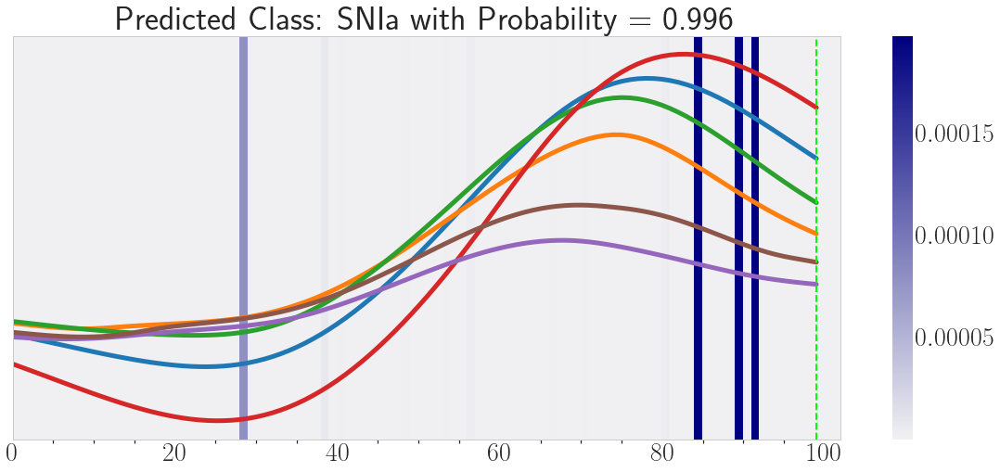

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.80786914
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.3759214
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.7691326
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9505987


<Figure size 1440x216 with 0 Axes>

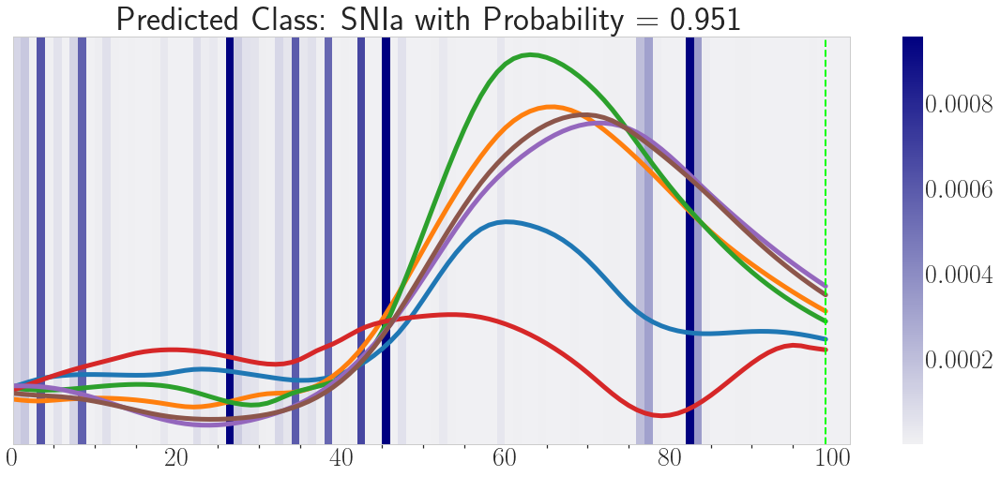

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.7376224
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.71919703
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.4948378
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9485625


<Figure size 1440x216 with 0 Axes>

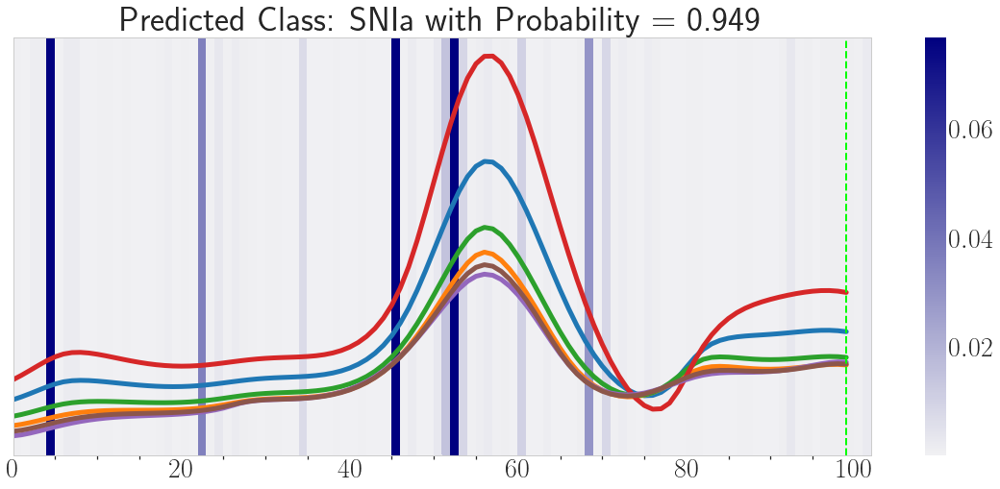

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.74613726
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.7888864
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.4818971
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.71919703
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.3759214
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9967624


<Figure size 1440x216 with 0 Axes>

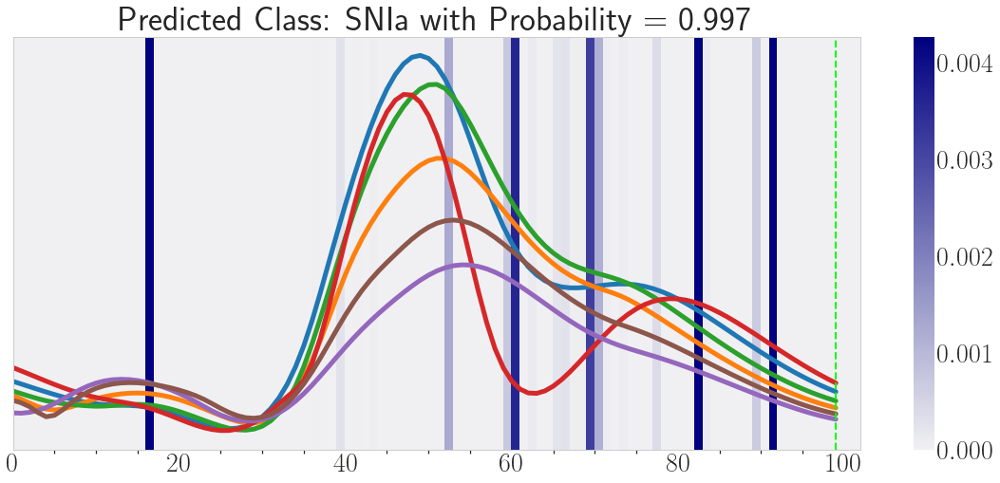

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.6531293
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.6268409
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9946896


<Figure size 1440x216 with 0 Axes>

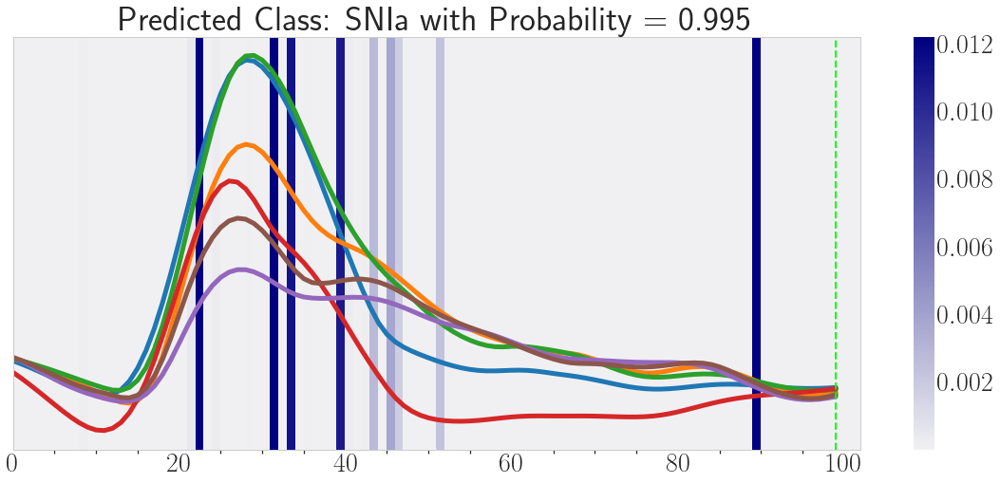

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.92012656


<Figure size 1440x216 with 0 Axes>

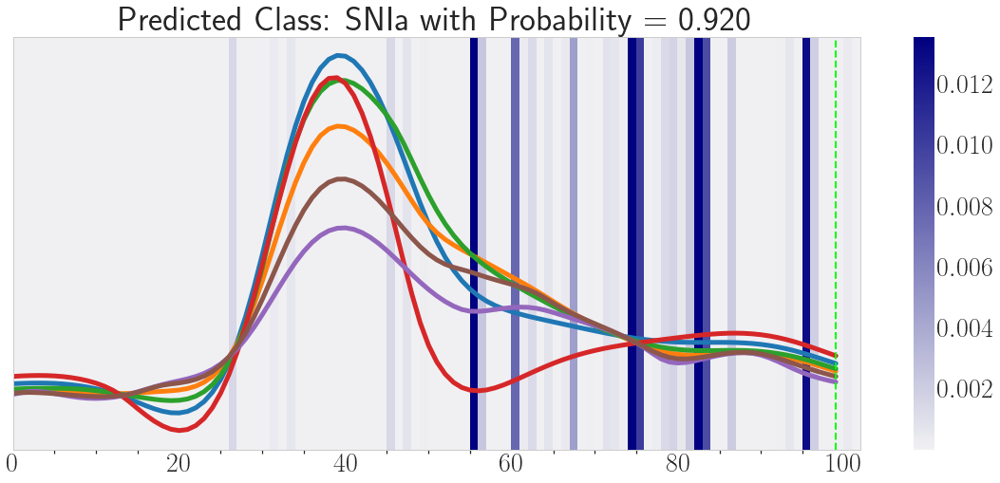

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.26924297
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.51624334
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.73703605
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.394218
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.8861639
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.46982628
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.454215
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.7728065
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.8045847
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.3684541
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.8583552
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9316109


<Figure size 1440x216 with 0 Axes>

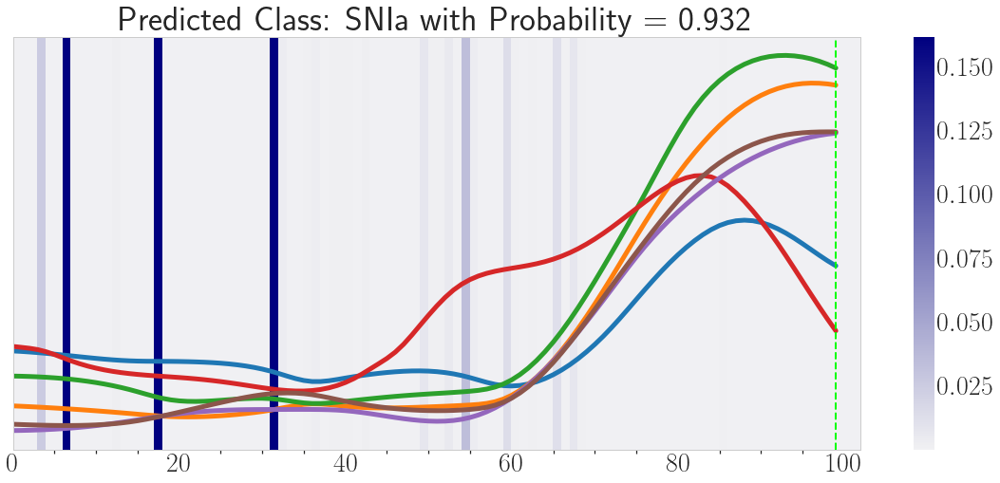

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.7011364
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9573786


<Figure size 1440x216 with 0 Axes>

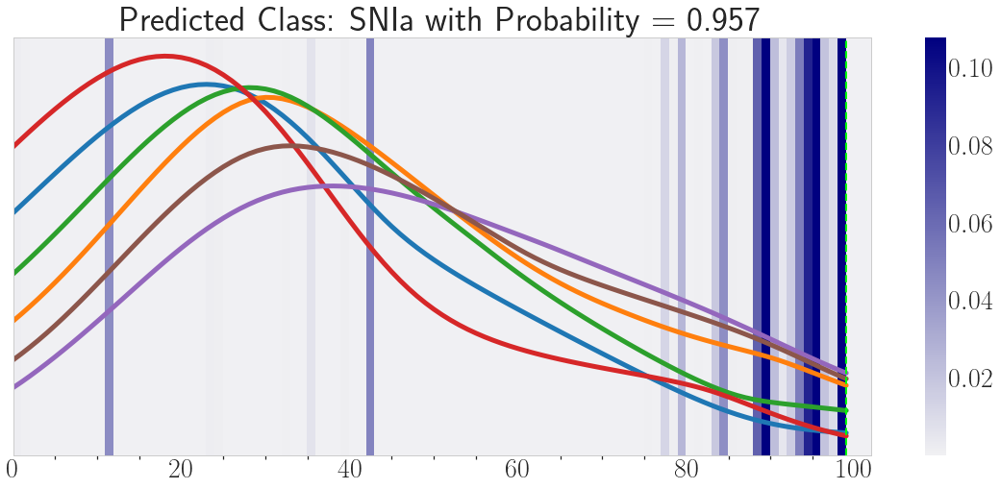

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.8601835
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.7097684
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.8960959
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.78225344
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.56600076
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.60087174
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9731569


<Figure size 1440x216 with 0 Axes>

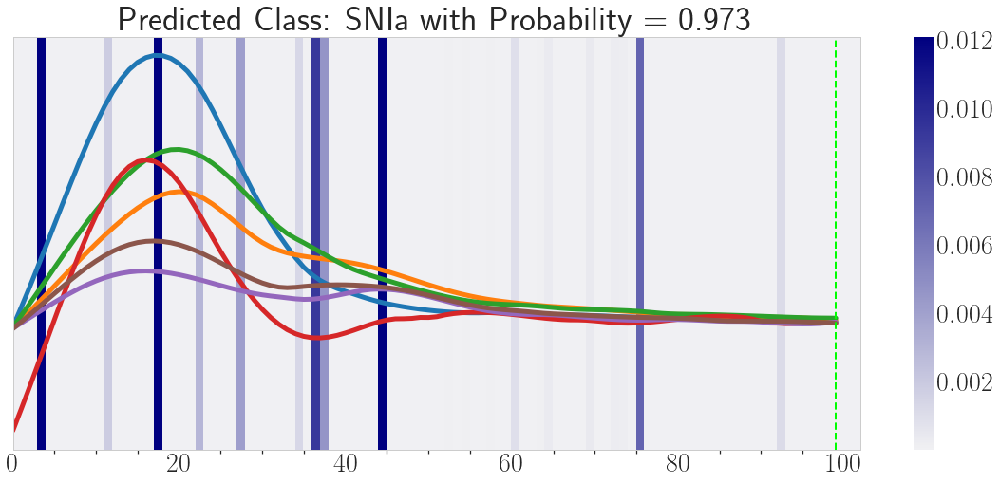

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.8527196
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.42014334
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.53513163
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9413986


<Figure size 1440x216 with 0 Axes>

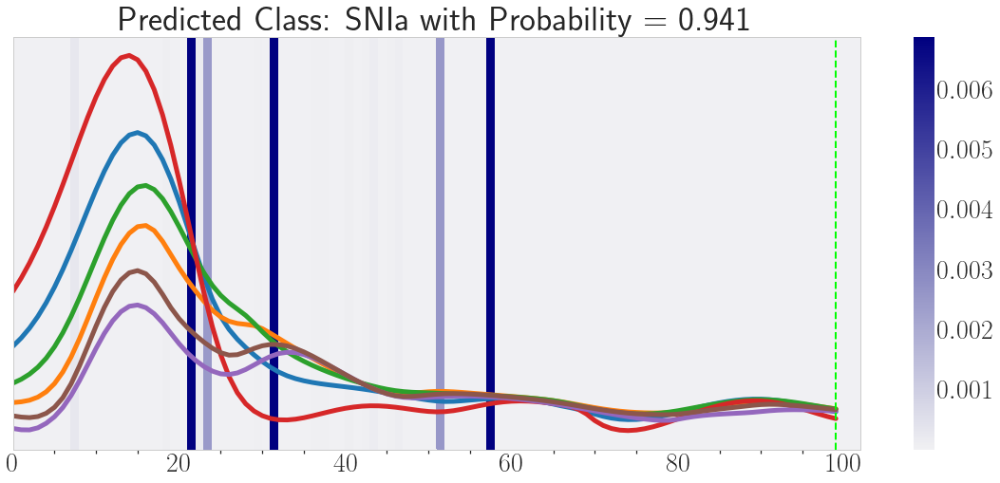

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.4007771
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9389676


<Figure size 1440x216 with 0 Axes>

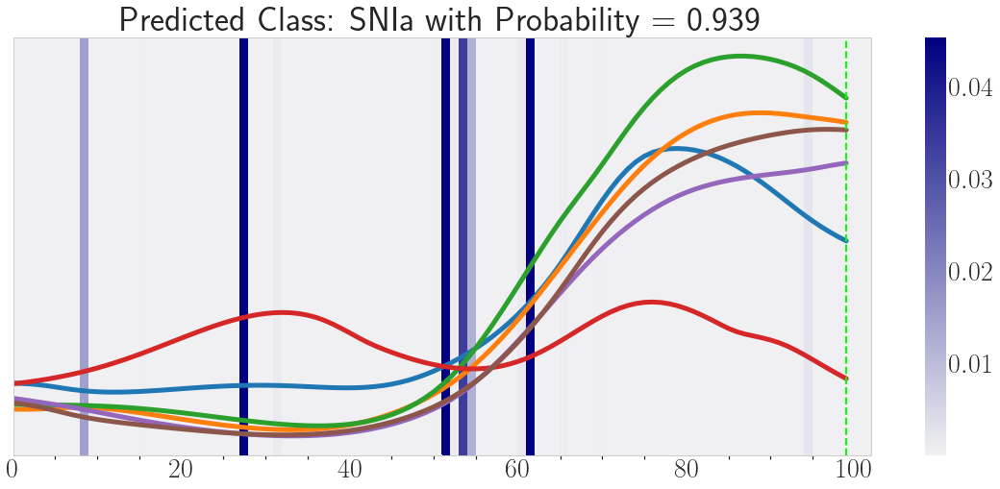

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.4692017
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.58373696
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.91133946


<Figure size 1440x216 with 0 Axes>

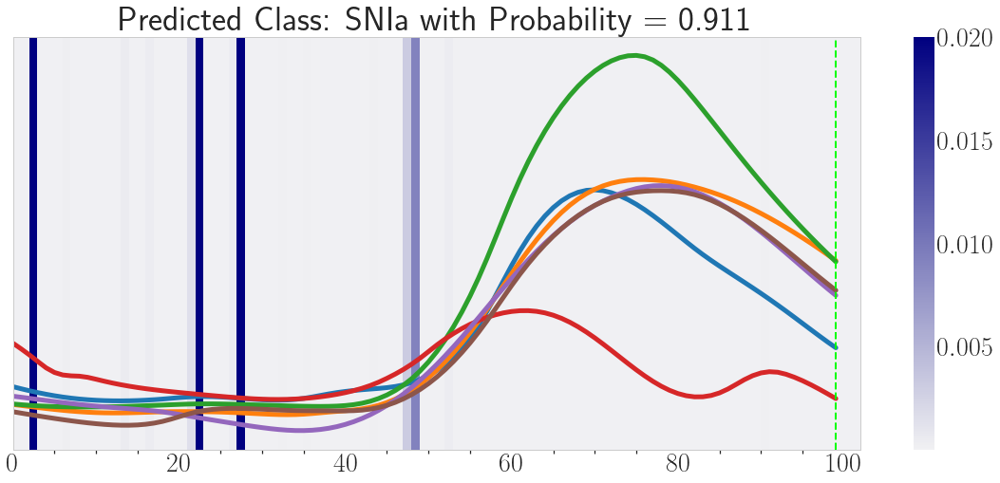

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.5835524
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.31658173
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.41527483
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.88538885
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.6277488
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.33358034
(102,)
(1, 102)
Predicted Class = 11, Probability = 0.90120655


<Figure size 1440x216 with 0 Axes>

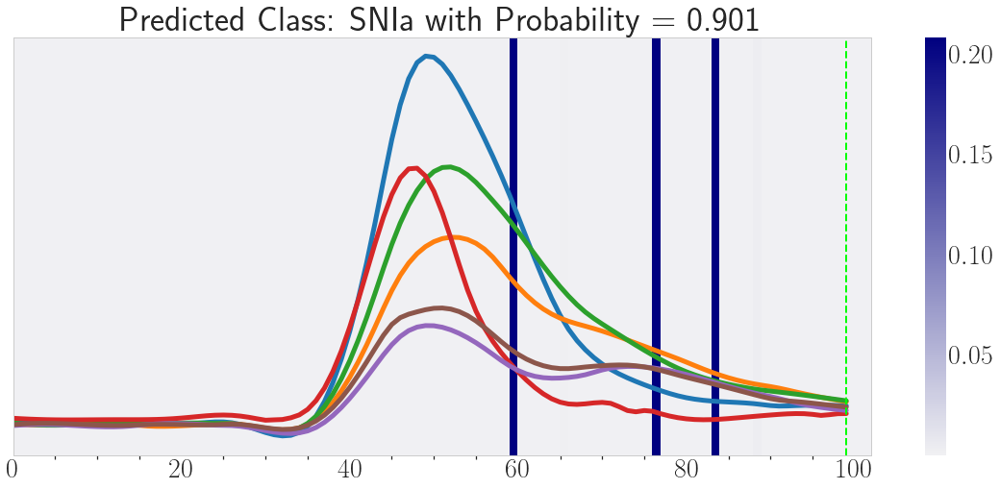

(102,)
(1, 102)
Predicted Class = 11, Probability = 0.9853897


<Figure size 1440x216 with 0 Axes>

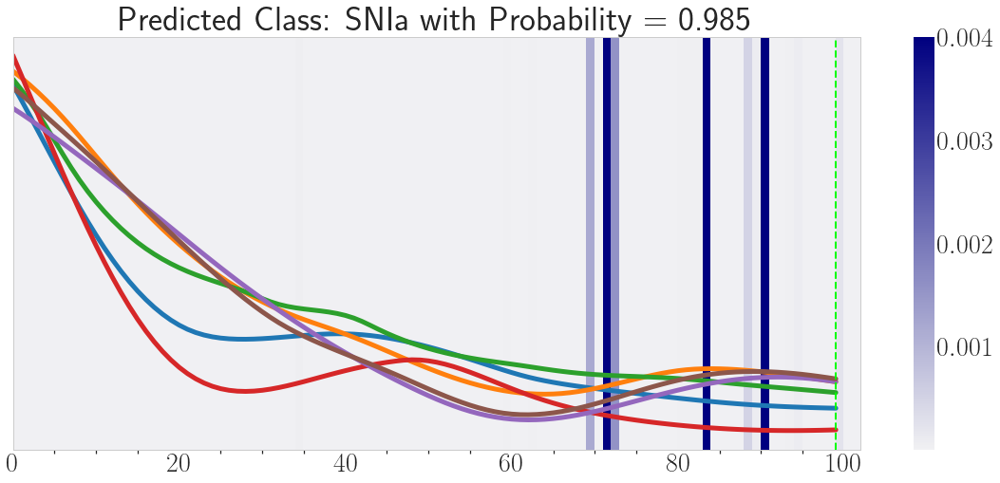

(102,)
(1, 102)
Predicted Class = 12, Probability = 0.91836506


<Figure size 1440x216 with 0 Axes>

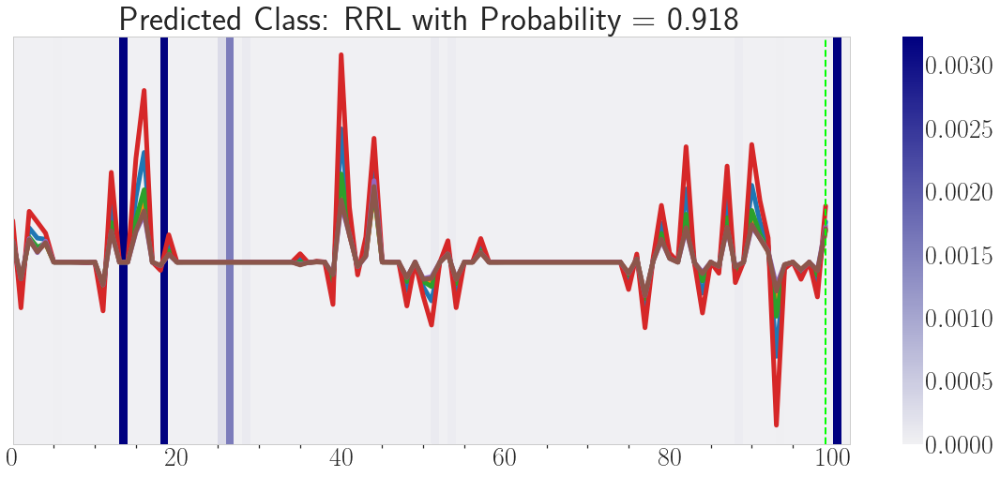

(102,)
(1, 102)
Predicted Class = 12, Probability = 0.99790037


<Figure size 1440x216 with 0 Axes>

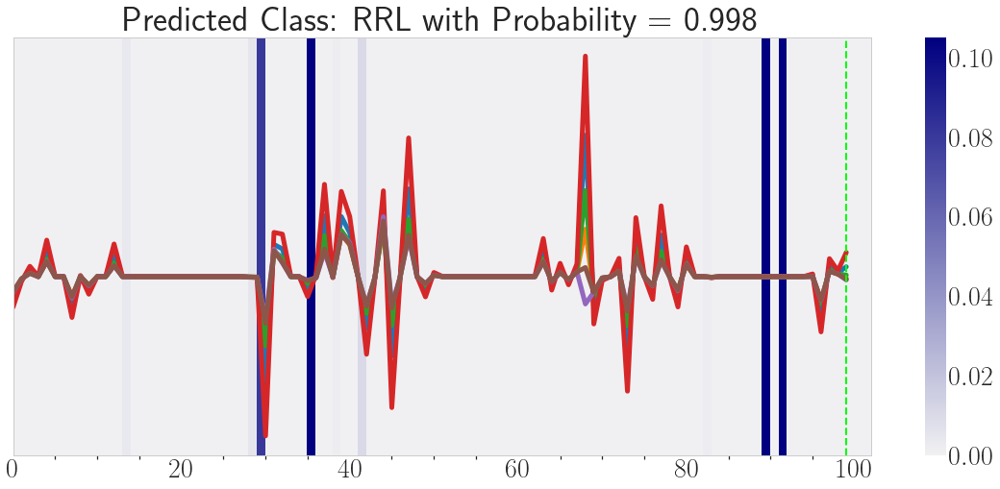

(102,)
(1, 102)
Predicted Class = 12, Probability = 0.9277764


<Figure size 1440x216 with 0 Axes>

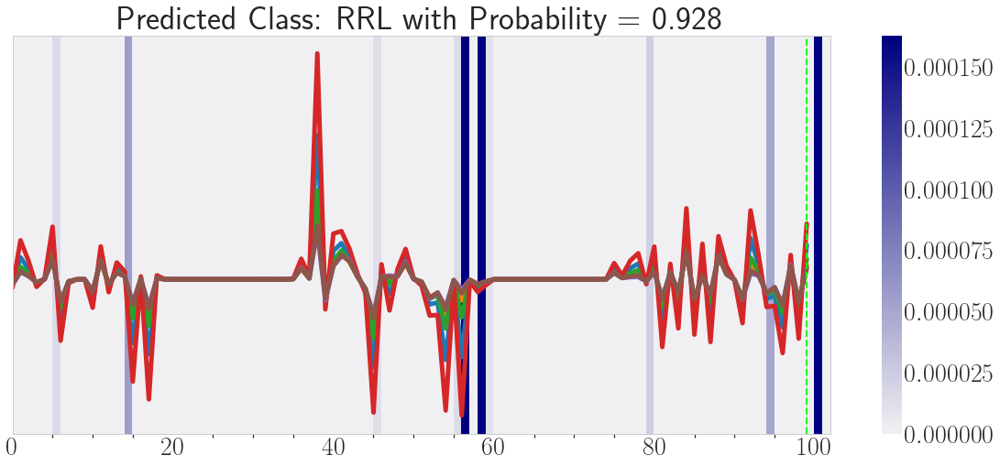

(102,)
(1, 102)
Predicted Class = 12, Probability = 0.8880188
(102,)
(1, 102)
Predicted Class = 12, Probability = 0.99929583


<Figure size 1440x216 with 0 Axes>

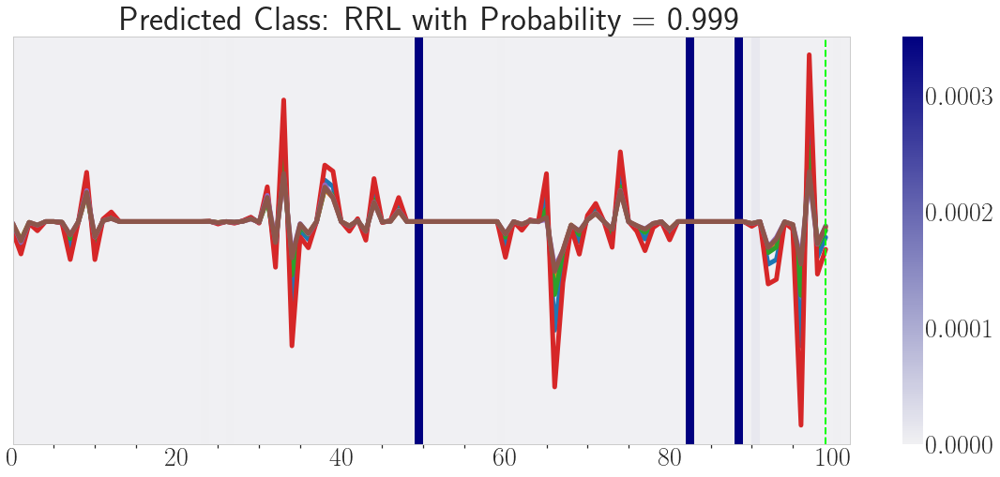

(102,)
(1, 102)
Predicted Class = 12, Probability = 0.8880188
(102,)
(1, 102)
Predicted Class = 12, Probability = 0.8880188
(102,)
(1, 102)
Predicted Class = 12, Probability = 0.8880188
(102,)
(1, 102)
Predicted Class = 12, Probability = 0.91836506


<Figure size 1440x216 with 0 Axes>

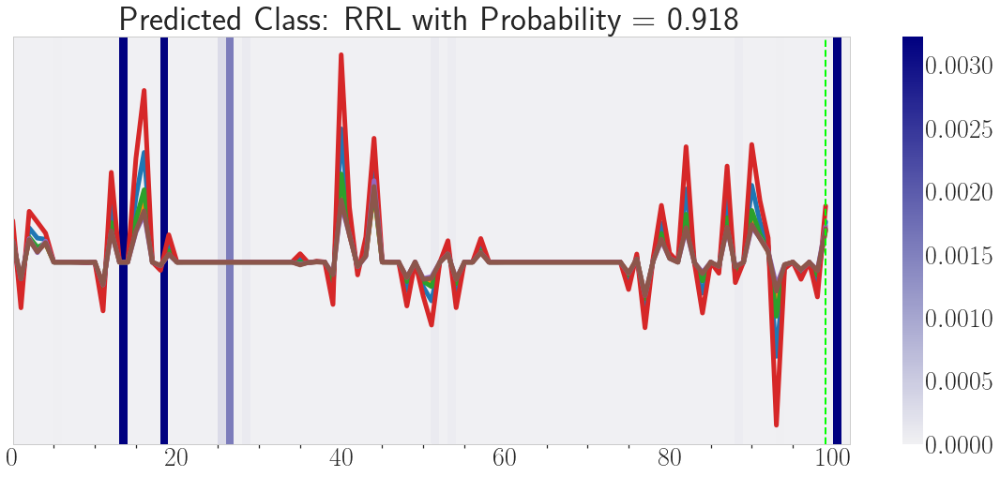

(102,)
(1, 102)
Predicted Class = 12, Probability = 0.99500245


<Figure size 1440x216 with 0 Axes>

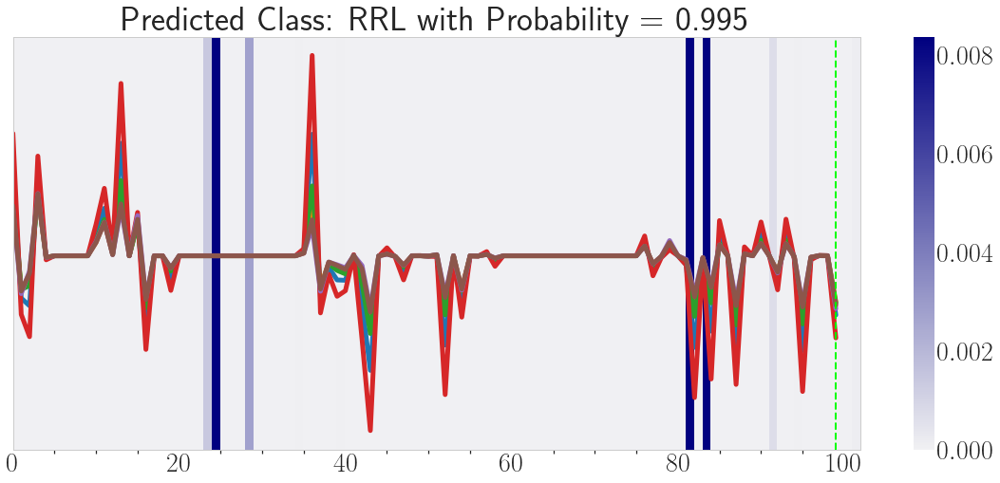

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.5262914
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.6574962
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.74557334
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.83492935
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.7266209
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.6744936
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.9421269


<Figure size 1440x216 with 0 Axes>

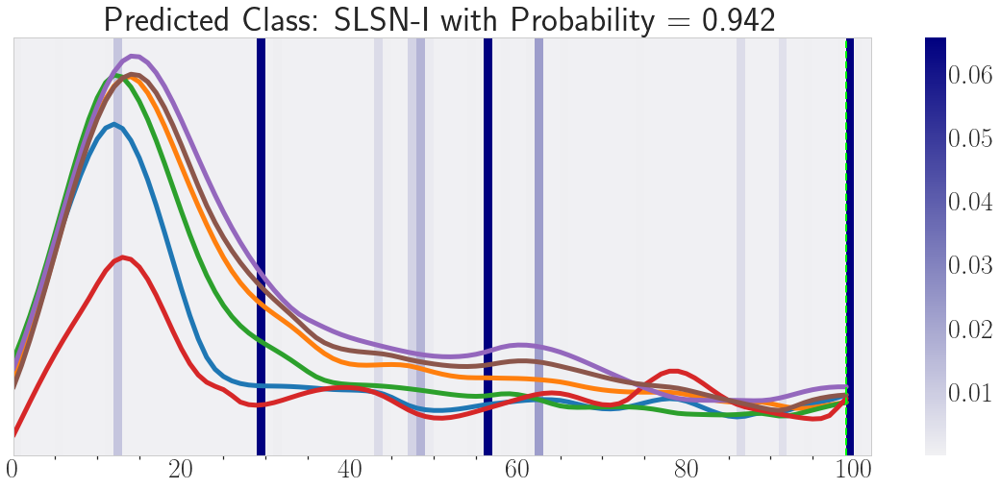

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.4315873
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.76920927
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.9208356


<Figure size 1440x216 with 0 Axes>

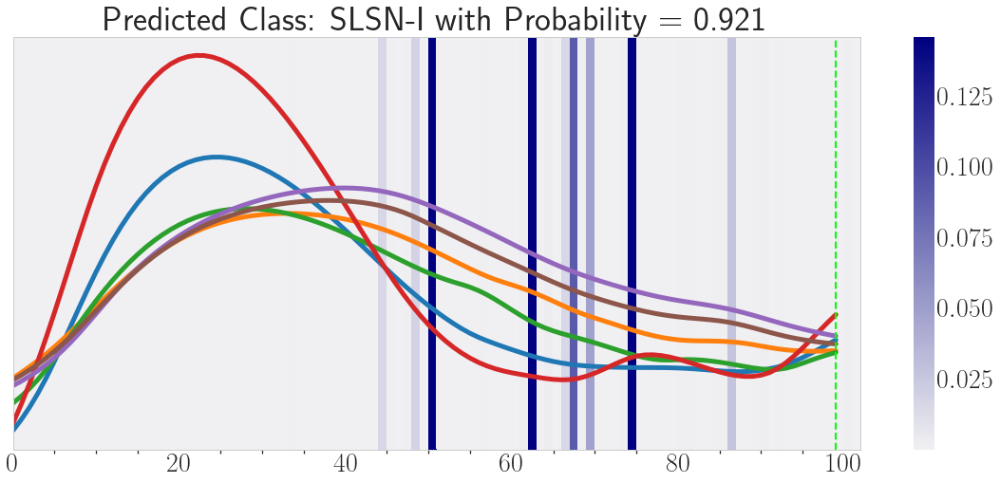

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.60658514
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.60658514
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.84578073
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.9622488


<Figure size 1440x216 with 0 Axes>

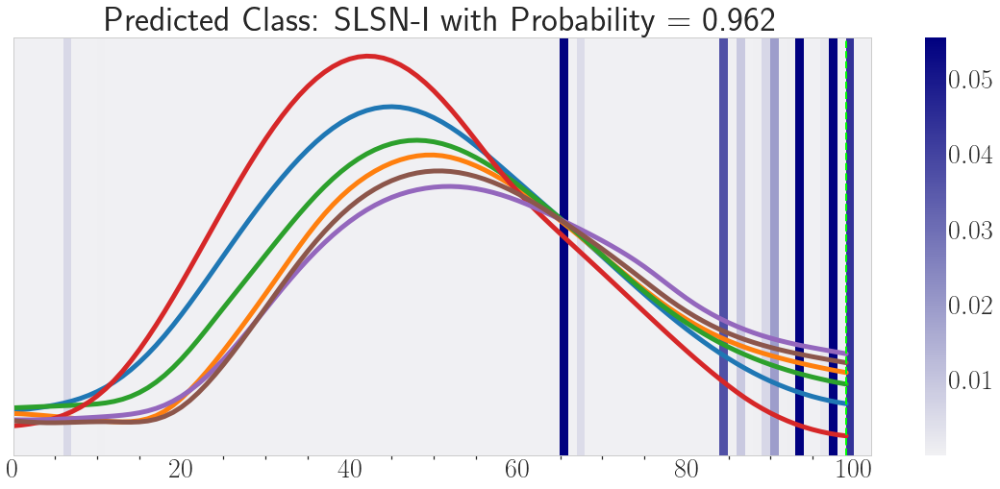

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.49564072
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.92818844


<Figure size 1440x216 with 0 Axes>

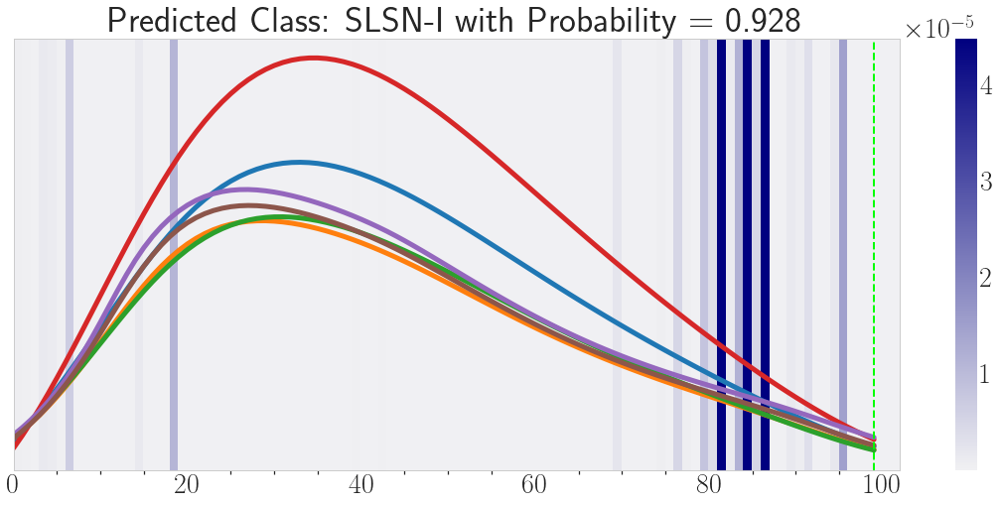

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.92818844


<Figure size 1440x216 with 0 Axes>

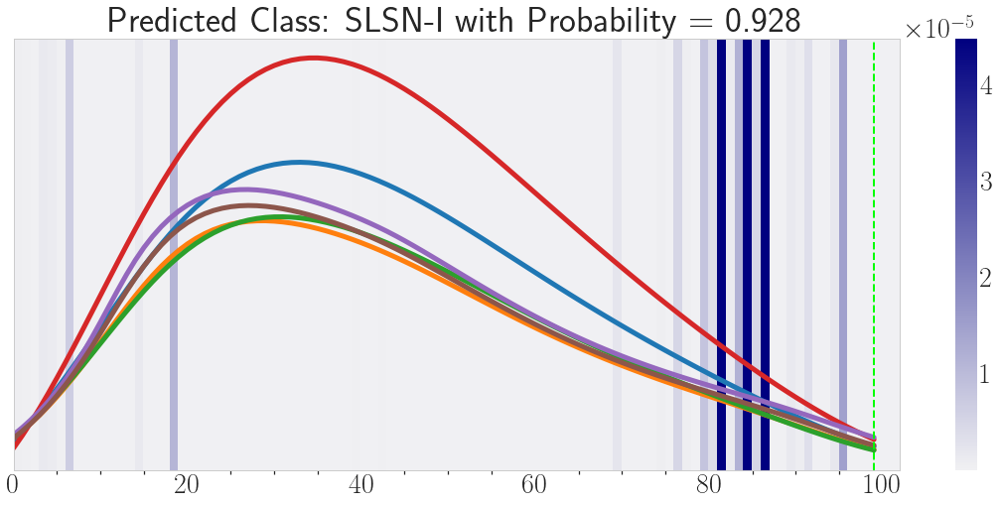

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.97279376


<Figure size 1440x216 with 0 Axes>

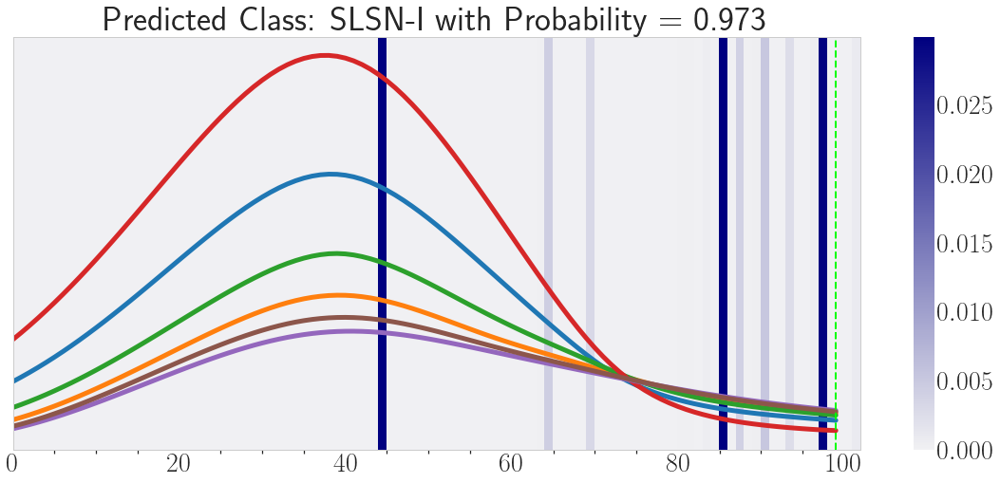

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.46392396
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.84765667
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.541433
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.6408343
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.6615024
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.46392396
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.83492935
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.9998605


<Figure size 1440x216 with 0 Axes>

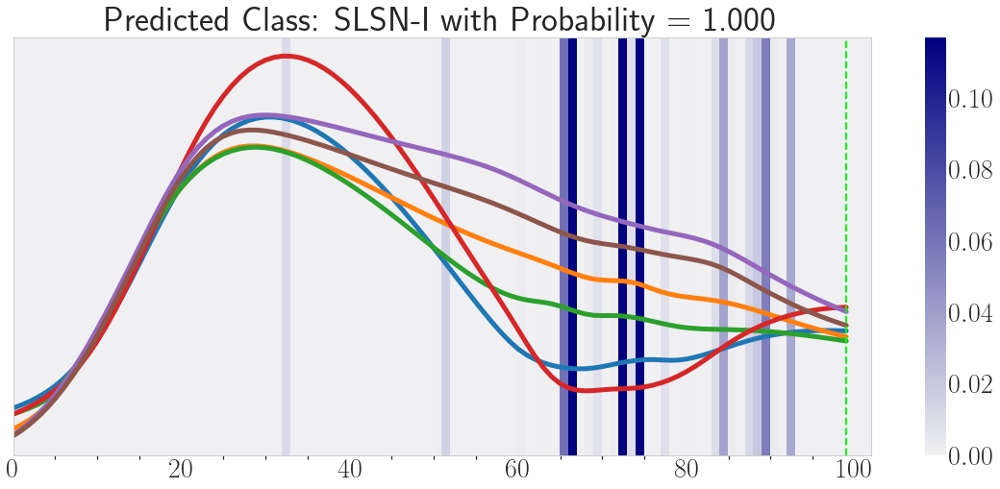

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.6351202
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.38852516
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.9999937


<Figure size 1440x216 with 0 Axes>

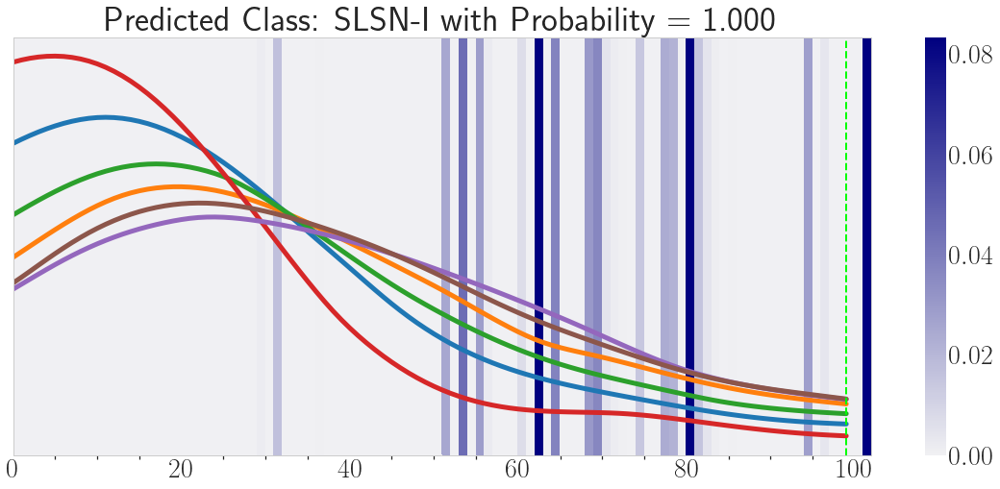

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.9926427


<Figure size 1440x216 with 0 Axes>

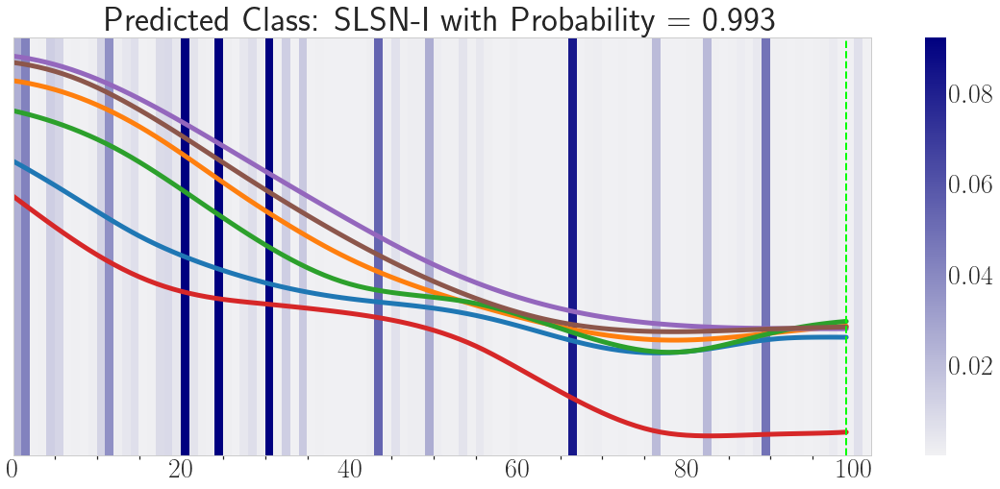

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.98136044


<Figure size 1440x216 with 0 Axes>

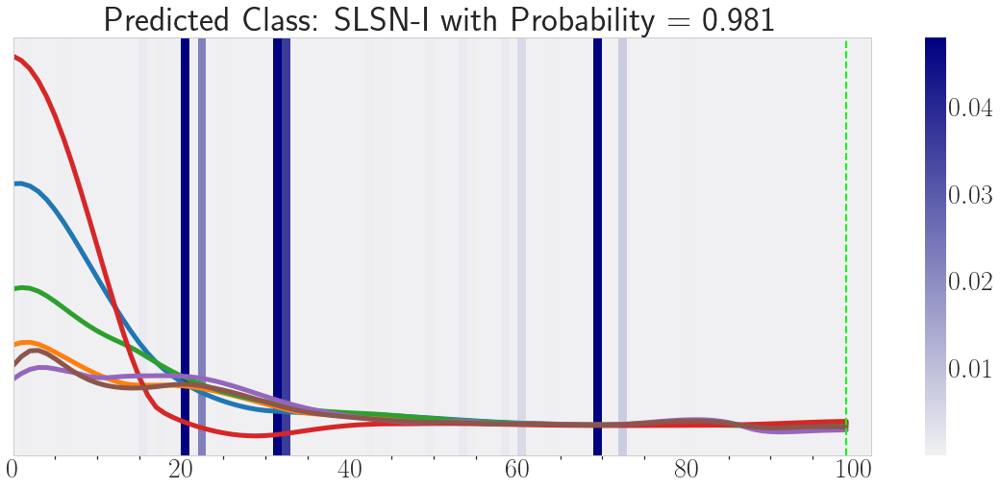

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.8790823
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.65110594
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.97056335


<Figure size 1440x216 with 0 Axes>

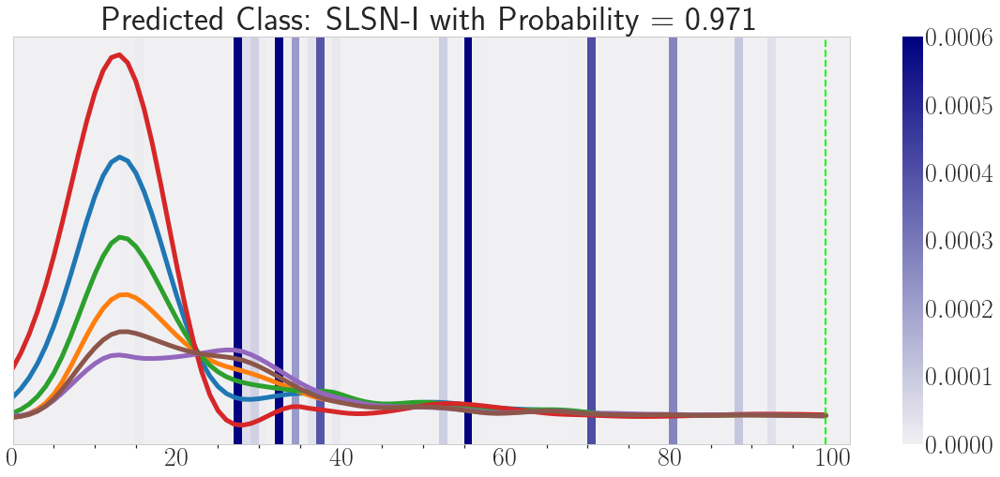

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.9996537


<Figure size 1440x216 with 0 Axes>

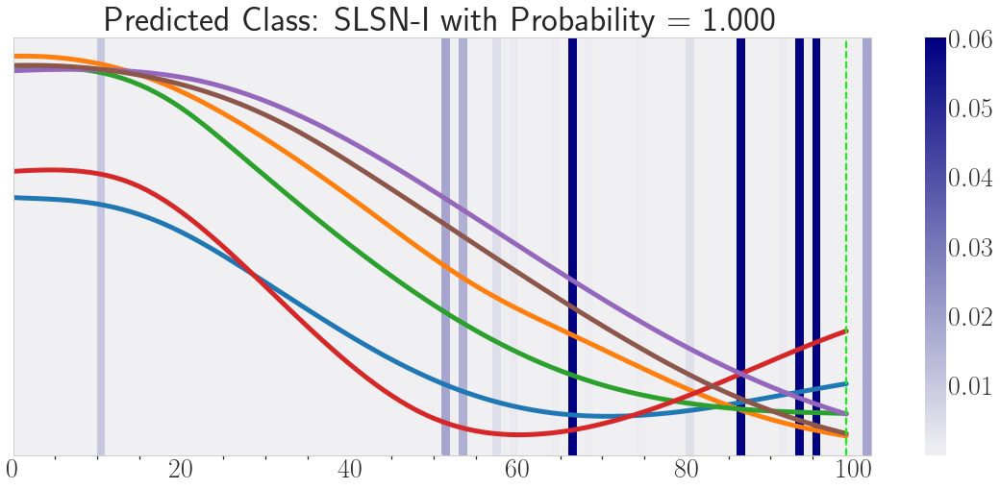

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.4144399
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.99999595


<Figure size 1440x216 with 0 Axes>

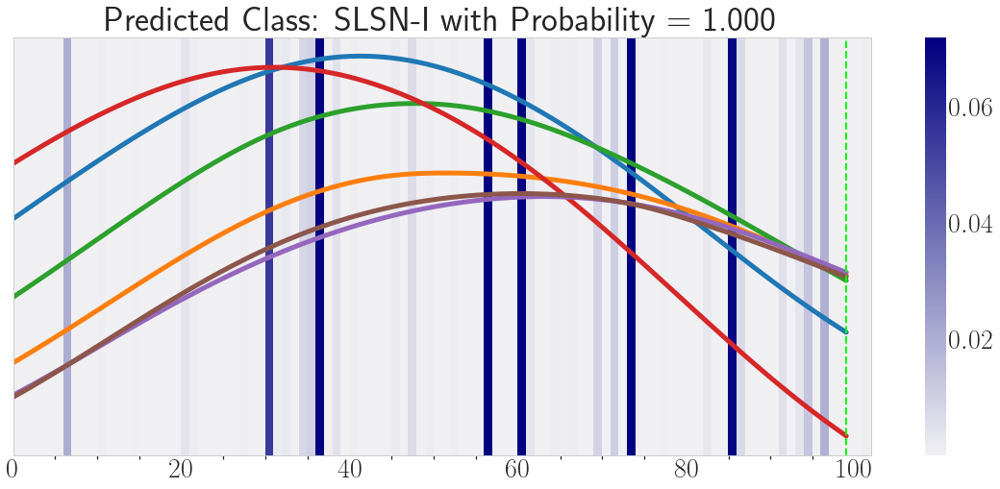

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.75257176
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.7403723
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.98136044


<Figure size 1440x216 with 0 Axes>

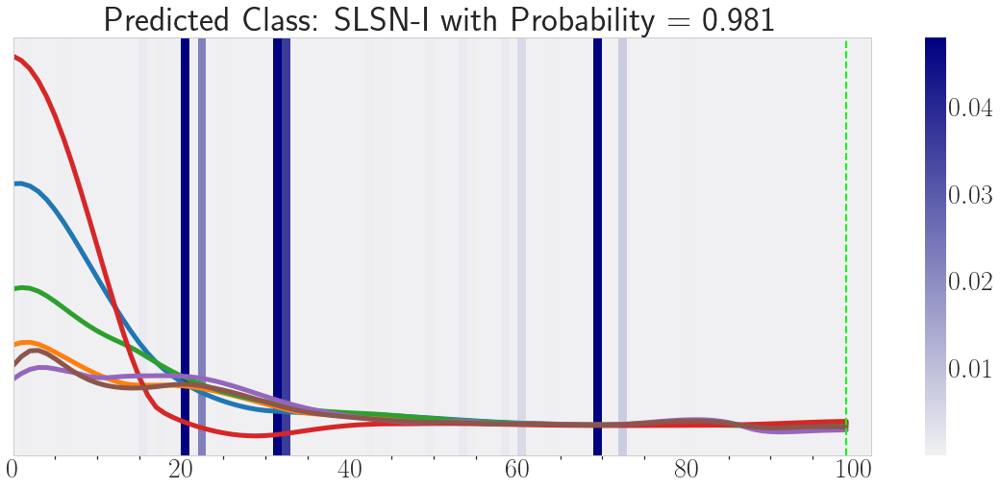

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.59799355
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.60658514
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.9982414


<Figure size 1440x216 with 0 Axes>

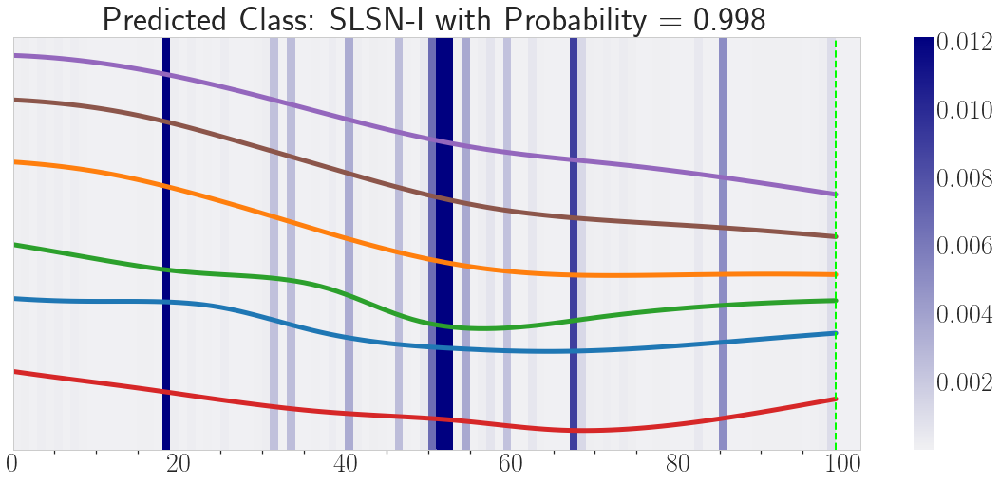

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.6351202
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.5784429
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.4939681
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.5453425
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.3693897
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.49149352
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.65110594
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.999905


<Figure size 1440x216 with 0 Axes>

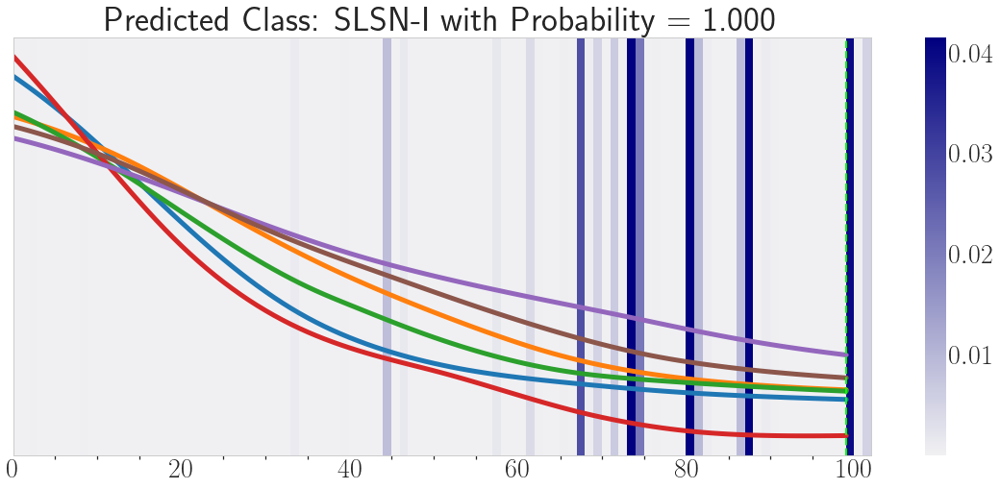

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.5262914
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.9998605


<Figure size 1440x216 with 0 Axes>

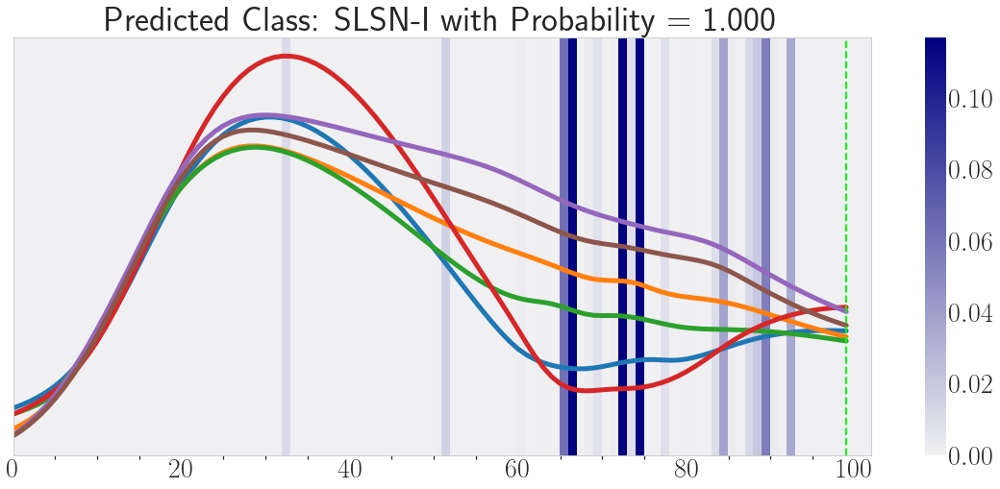

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.8895355
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.8284538
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.24279606
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.9996537


<Figure size 1440x216 with 0 Axes>

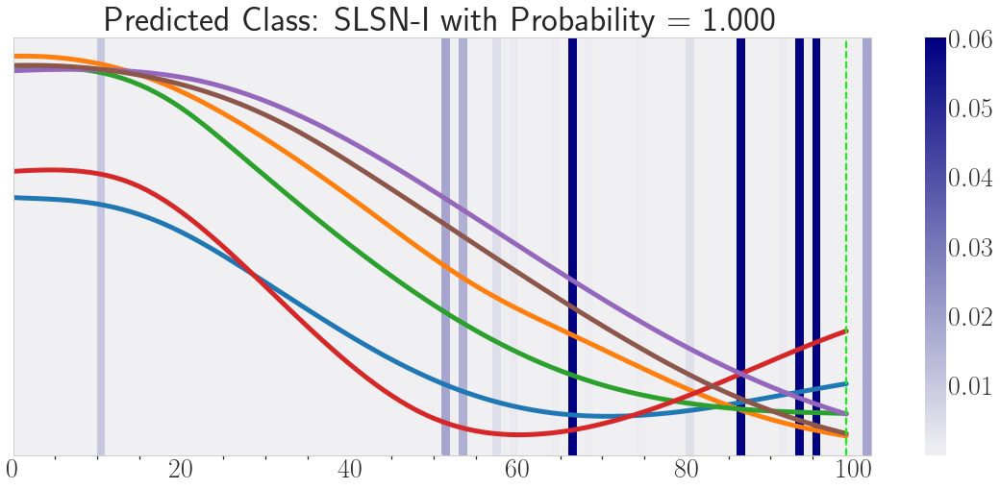

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.447578
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.7134498
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.3693897
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.7134498
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.9998375


<Figure size 1440x216 with 0 Axes>

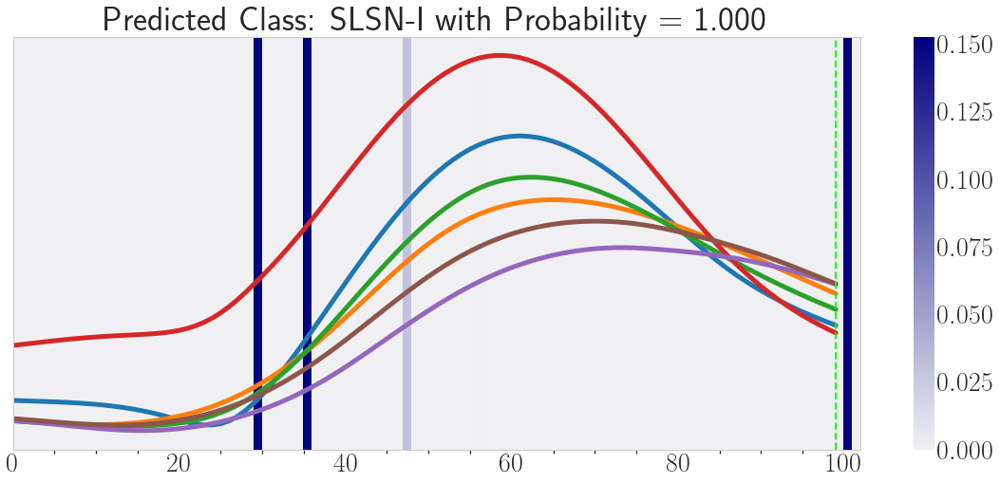

(102,)
(1, 102)
Predicted Class = 13, Probability = 0.4315873
(102,)
(1, 102)
Predicted Class = 13, Probability = 0.6039544


<Figure size 1440x216 with 0 Axes>

In [126]:
for i in range(len(class_names)):
    show_maps(desired_class=i, num_maps=30)

##### Make associated GIFs

In [ ]:
from pathlib import Path
import imageio

# for i in range(len(class_names)):
#     with imageio.get_writer(f"{asnwd}/notebooks/cams/CAM-{class_names[i]}.gif", mode='I') as writer:
#         for filename in Path(f"{asnwd}/notebooks/cams/").rglob(f"CAM-{class_names[i]}-*.png"):
# #             image = imageio.imread(filename)
# #             writer.append_data(image)
#             print(filename)

In [ ]:
for i in range(len(class_names)):
    filenames = []
    for filename in Path(f"{asnwd}/notebooks/cams/").rglob(f"CAM-{class_names[i]}-*.png"):
        filenames.append(filename.name)
    print(filenames)
    with imageio.get_writer(f"{asnwd}/notebooks/cams/CAM-{class_names[i]}.gif", mode='I', duration=3) as writer:
        for filename in filenames:
            image = imageio.imread(f"{asnwd}/notebooks/cams/{filename}")
            writer.append_data(image)

In [ ]:
# Build GIF
# with imageio.get_writer(f"{asnwd}/notebooks/cams/CAM-{class_names[desired_class]}.gif", mode='I') as writer:
#     for filename in ['1.png', '2.png', '3.png', '4.png']:
#         image = imageio.imread(filename)
#         writer.append_data(image)

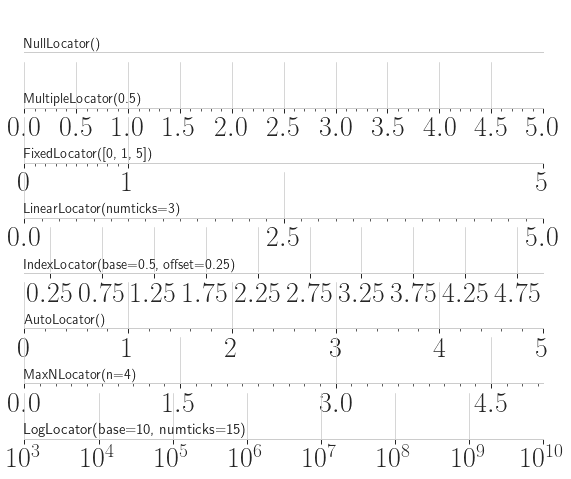

In [247]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker


# Setup a plot such that only the bottom spine is shown
def setup(ax):
    ax.spines['right'].set_color('none')
    ax.spines['left'].set_color('none')
    ax.yaxis.set_major_locator(ticker.NullLocator())
    ax.spines['top'].set_color('none')
    ax.xaxis.set_ticks_position('bottom')
    ax.tick_params(which='major', width=1.00)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', width=0.75)
    ax.tick_params(which='minor', length=2.5)
    ax.set_xlim(0, 5)
    ax.set_ylim(0, 1)
    ax.patch.set_alpha(0.0)


plt.figure(figsize=(8, 6))
n = 8

# Null Locator
ax = plt.subplot(n, 1, 1)
setup(ax)
ax.xaxis.set_major_locator(ticker.NullLocator())
ax.xaxis.set_minor_locator(ticker.NullLocator())
ax.text(0.0, 0.1, "NullLocator()", fontsize=14, transform=ax.transAxes)

# Multiple Locator
ax = plt.subplot(n, 1, 2)
setup(ax)
ax.xaxis.set_major_locator(ticker.MultipleLocator(0.5))
ax.xaxis.set_minor_locator(ticker.MultipleLocator(0.1))
ax.text(0.0, 0.1, "MultipleLocator(0.5)", fontsize=14,
        transform=ax.transAxes)

# Fixed Locator
ax = plt.subplot(n, 1, 3)
setup(ax)
majors = [0, 1, 5]
ax.xaxis.set_major_locator(ticker.FixedLocator(majors))
minors = np.linspace(0, 1, 11)[1:-1]
ax.xaxis.set_minor_locator(ticker.FixedLocator(minors))
ax.text(0.0, 0.1, "FixedLocator([0, 1, 5])", fontsize=14,
        transform=ax.transAxes)

# Linear Locator
ax = plt.subplot(n, 1, 4)
setup(ax)
ax.xaxis.set_major_locator(ticker.LinearLocator(3))
ax.xaxis.set_minor_locator(ticker.LinearLocator(31))
ax.text(0.0, 0.1, "LinearLocator(numticks=3)",
        fontsize=14, transform=ax.transAxes)

# Index Locator
ax = plt.subplot(n, 1, 5)
setup(ax)
ax.plot(range(0, 5), [0]*5, color='white')
ax.xaxis.set_major_locator(ticker.IndexLocator(base=.5, offset=.25))
ax.text(0.0, 0.1, "IndexLocator(base=0.5, offset=0.25)",
        fontsize=14, transform=ax.transAxes)

# Auto Locator
ax = plt.subplot(n, 1, 6)
setup(ax)
ax.xaxis.set_major_locator(ticker.AutoLocator())
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.text(0.0, 0.1, "AutoLocator()", fontsize=14, transform=ax.transAxes)

# MaxN Locator
ax = plt.subplot(n, 1, 7)
setup(ax)
ax.xaxis.set_major_locator(ticker.MaxNLocator(4))
ax.xaxis.set_minor_locator(ticker.MaxNLocator(40))
ax.text(0.0, 0.1, "MaxNLocator(n=4)", fontsize=14, transform=ax.transAxes)

# Log Locator
ax = plt.subplot(n, 1, 8)
setup(ax)
ax.set_xlim(10**3, 10**10)
ax.set_xscale('log')
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=15))
ax.text(0.0, 0.1, "LogLocator(base=10, numticks=15)",
        fontsize=15, transform=ax.transAxes)

# Push the top of the top axes outside the figure because we only show the
# bottom spine.
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=1.05)

plt.show()

![SegmentLocal](cams/myimage.gif)

CAM-AGN.gif
CAM-EB.gif
CAM-KN.gif
CAM-M-dwarf.gif
CAM-Mira.gif
CAM-RRL.gif
CAM-SLSN-I.gif
CAM-SNII.gif
CAM-SNIa-91bg.gif
CAM-SNIa.gif
CAM-SNIax.gif
CAM-SNIbc.gif
CAM-TDE.gif
CAM-mu-Lens-Single.gif


<img src="./cams/CAM-AGN.gif" width="1000" align="center">

<img src="./cams/CAM-EB.gif" width="1000" align="center">

<img src="./cams/CAM-KN.gif" width="1000" align="center">

<img src="./cams/CAM-M-dwarf.gif" width="1000" align="center">

<img src="./cams/CAM-Mira.gif" width="1000" align="center">

<img src="./cams/CAM-RRL.gif" width="1000" align="center">

<img src="./cams/CAM-SLSN-I.gif" width="1000" align="center">

<img src="./cams/CAM-SNII.gif" width="1000" align="center">

<img src="./cams/CAM-SNIa-91bg.gif" width="1000" align="center">

<img src="./cams/CAM-SNIax.gif" width="1000" align="center">

<img src="./cams/CAM-SNIa.gif" width="1000" align="center">

<img src="./cams/CAM-SNIbc.gif" width="1000" align="center">

<img src="./cams/CAM-TDE.gif" width="1000" align="center">

<img src="./cams/CAM-mu-Lens-Single.gif" width="1000" align="center">